Installations

In [ ]:
!pip install powerlaw
!pip install python-igraph
!pip install numpy==1.23.5 # in the new version of numpy, there is a problem with np.array

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 55.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.


**Graph U-Nets Integration**
<br>
We integrate into preproc_data method the gpool operation. We will not use the coarse graph of misc-gan that generated in parse_data (R, P, W and c values). We used gpool operation instead.

In the fist approach, in the test method of cycle-gan class, after generating the new coarse graph, we will apply gunpool operation on it. The generate_network iterate on each layer and it executes the test method of cycle-gan.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

In [ ]:
class GNet(nn.Module):
    def __init__(self, in_dim, n_classes, args):
        super(GNet, self).__init__()
        self.n_act = getattr(nn, args.act_n)()
        self.c_act = getattr(nn, args.act_c)()
        self.s_gcn = GCN(in_dim, args.l_dim, self.n_act, args.drop_n)
        self.g_unet = GraphUnet(
            args.ks, args.l_dim, args.l_dim, args.l_dim, self.n_act,
            args.drop_n)
        self.out_l_1 = nn.Linear(3*args.l_dim*(args.l_num+1), args.h_dim)
        self.out_l_2 = nn.Linear(args.h_dim, n_classes)
        self.out_drop = nn.Dropout(p=args.drop_c)
        Initializer.weights_init(self)

    def forward(self, gs, hs, labels):
        hs = self.embed(gs, hs)
        logits = self.classify(hs)
        return self.metric(logits, labels)

    def embed(self, gs, hs):
        o_hs = []
        for g, h in zip(gs, hs):
            h = self.embed_one(g, h)
            o_hs.append(h)
        hs = torch.stack(o_hs, 0)
        return hs

    def embed_one(self, g, h):
        g = norm_g(g)
        h = self.s_gcn(g, h)
        hs = self.g_unet(g, h)
        h = self.readout(hs)
        return h

    def readout(self, hs):
        h_max = [torch.max(h, 0)[0] for h in hs]
        h_sum = [torch.sum(h, 0) for h in hs]
        h_mean = [torch.mean(h, 0) for h in hs]
        h = torch.cat(h_max + h_sum + h_mean)
        return h

    def classify(self, h):
        h = self.out_drop(h)
        h = self.out_l_1(h)
        h = self.c_act(h)
        h = self.out_drop(h)
        h = self.out_l_2(h)
        return F.log_softmax(h, dim=1)

    def metric(self, logits, labels):
        loss = F.nll_loss(logits, labels)
        _, preds = torch.max(logits, 1)
        acc = torch.mean((preds == labels).float())
        return loss, acc


In [ ]:
class GraphUnet(nn.Module):

    def __init__(self, ks, in_dim, out_dim, dim, act, drop_p):
        super(GraphUnet, self).__init__()
        self.ks = ks
        self.bottom_gcn = GCN(dim, dim, act, drop_p)
        self.down_gcns = nn.ModuleList()
        self.up_gcns = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.unpools = nn.ModuleList()
        self.l_n = len(ks)
        for i in range(self.l_n):
            self.down_gcns.append(GCN(dim, dim, act, drop_p))
            self.up_gcns.append(GCN(dim, dim, act, drop_p))
            self.pools.append(Pool(ks[i], dim, drop_p))
            self.unpools.append(Unpool(dim, dim, drop_p))

    def forward(self, g, h):
        adj_ms = []
        indices_list = []
        down_outs = []
        hs = []
        org_h = h
        for i in range(self.l_n):
            h = self.down_gcns[i](g, h)
            adj_ms.append(g)
            down_outs.append(h)
            g, h, idx = self.pools[i](g, h)
            indices_list.append(idx)
        h = self.bottom_gcn(g, h)
        for i in range(self.l_n):
            up_idx = self.l_n - i - 1
            g, idx = adj_ms[up_idx], indices_list[up_idx]
            g, h = self.unpools[i](g, h, down_outs[up_idx], idx)
            h = self.up_gcns[i](g, h)
            h = h.add(down_outs[up_idx])
            hs.append(h)
        h = h.add(org_h)
        hs.append(h)
        return hs


class GCN(nn.Module):

    def __init__(self, in_dim, out_dim, act, p):
        super(GCN, self).__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        self.act = act
        self.drop = nn.Dropout(p=p) if p > 0.0 else nn.Identity()

    def forward(self, g, h):
        h = self.drop(h)
        h = torch.matmul(g, h)
        h = self.proj(h)
        h = self.act(h)
        return h

class Pool(nn.Module):

    def __init__(self, k, in_dim, p):
        super(Pool, self).__init__()
        self.k = k
        self.sigmoid = nn.Sigmoid()
        self.proj = nn.Linear(in_dim, 1)
        self.drop = nn.Dropout(p=p) if p > 0 else nn.Identity()

    def forward(self, g, h):
        Z = self.drop(h)
        weights = self.proj(Z).squeeze()
        scores = self.sigmoid(weights)
        return top_k_graph(scores, g, h, self.k)


class Unpool(nn.Module):
    def __init__(self, *args):
        super(Unpool, self).__init__()

    def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        # Subset h to match the size of idx
        h_subset = h[:len(idx)]
        # Debug: Print shapes before assignment
        print(f"Shape of new_h before assignment: {new_h.shape}")
        print(f"Shape of h_subset: {h_subset.shape}")
        print(f"Shape of idx: {idx.shape}")
        new_h[idx] = h_subset
        return g, new_h
    '''def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        new_h[idx] = h
        return g, new_h'''


def top_k_graph(scores, g, h, k):
    num_nodes = g.shape[0]
    values, idx = torch.topk(scores, max(2, int(k*num_nodes)))
    new_h = h[idx, :]
    values = torch.unsqueeze(values, -1)
    new_h = torch.mul(new_h, values)
    un_g = g.bool().float()
    un_g = torch.matmul(un_g, un_g).bool().float()
    un_g = un_g[idx, :]
    un_g = un_g[:, idx]
    g = norm_g(un_g)
    return g, new_h, idx


def norm_g(g):
    degrees = torch.sum(g, 1)
    g = g / degrees
    return g

In [ ]:
class Initializer(object):

    @classmethod
    def _glorot_uniform(cls, w):
        if len(w.size()) == 2:
            fan_in, fan_out = w.size()
        elif len(w.size()) == 3:
            fan_in = w.size()[1] * w.size()[2]
            fan_out = w.size()[0] * w.size()[2]
        else:
            fan_in = np.prod(w.size())
            fan_out = np.prod(w.size())
        limit = np.sqrt(6.0 / (fan_in + fan_out))
        w.uniform_(-limit, limit)

    @classmethod
    def _param_init(cls, m):
        if isinstance(m, nn.parameter.Parameter):
            cls._glorot_uniform(m.data)
        elif isinstance(m, nn.Linear):
            m.bias.data.zero_()
            cls._glorot_uniform(m.weight.data)

    @classmethod
    def weights_init(cls, m):
        for p in m.modules():
            if isinstance(p, nn.ParameterList):
                for pp in p:
                    cls._param_init(pp)
            else:
                cls._param_init(p)

        for name, p in m.named_parameters():
            if '.' not in name:
                cls._param_init(p)

First analysis results: DBLP dataset what were trained on graph u-nets using the following hyperparameters:
<br>
    seed = 42
    <br>
    data = 'DBLP'
    <br>
    fold = 1
    <br>
    num_epochs = 200
    <br>
    batch = 1
    <br>
    lr = 0.001  # A higher learning rate for faster convergence
    <br>
    deg_as_tag = 0
    <br>
    l_num = 3  # Number of layers in the model
    <br>
    h_dim = 128  # Higher hidden dimension for larger datasets
    <br>
    l_dim = 64  # Latent dimension
    <br>
    drop_n = 0.5  # Dropout rate for nodes
    <br>
    drop_c = 0.5  # Dropout rate for edges
    <br>
    act_n = 'ReLU'
    <br>
    act_c = 'ReLU'
    <br>
    ks = [0.9, 0.8, 0.7]  # k for pooling layers
    <br>
    acc_file = 're'
    <br>
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/DBLP_graph_unet_model.pth'
    <br>
    in_dim = 1

In [ ]:
class GNetArgs:
    seed = 42
    data = 'DBLP'
    fold = 1
    num_epochs = 200
    batch = 1
    lr = 0.001  # A higher learning rate for faster convergence
    deg_as_tag = 0
    l_num = 3  # Number of layers in the model
    h_dim = 128  # Higher hidden dimension for larger datasets
    l_dim = 64  # Latent dimension
    drop_n = 0.5  # Dropout rate for nodes
    drop_c = 0.5  # Dropout rate for edges
    act_n = 'ReLU'
    act_c = 'ReLU'
    ks = [0.9, 0.8, 0.7]  # k for pooling layers
    acc_file = 're'
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/dblp_graph_unet_model.pth'
    in_dim = 1

gnet_args = GNetArgs()
net = GNet(in_dim=gnet_args.in_dim, n_classes=2, args=gnet_args)

def load_model_parameters(model, model_path):
    pretrained_dict = torch.load(model_path)
    model_dict = model.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)

model_path = gnet_args.save_model
load_model_parameters(net, model_path)
net.eval()

# for g-unets integration
global_params = {
    "down_outs_list": [],
    "indices_list_list": []
}

Imports

In [ ]:
import tensorflow as tf
import numpy as np
import pickle as pkl
import argparse
import networkx as nx
import scipy.sparse as sp
import scipy.io as sio
import sys
import os
from collections import namedtuple
import math
import time
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from scipy.sparse.csgraph import connected_components
from __future__ import division
from __future__ import print_function
import copy
import powerlaw
import collections
import igraph
import tf_slim as slim # import tensorflow.contrib.slim as slim also legacy and goolge colab removed it
from tensorflow.python.framework import ops

print(np.__version__)

1.23.5


In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
class Args:
  def __init__(self, version=-1):
    self.demo = False
    self.dataset_A = f'cora_{version}.mat' if version > -1 else 'cora.mat'  # path of the data set
    self.checkpoint = f'/content/Misc-Gan_Project/checkpoint_training_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/checkpoint_training_cora'  # path of the checkpoint
    self.filename = f'cora_output_network_{version}' if version > -1 else 'cora_output_network'  # the filename of output network
    self.output_dir = f'/content/Misc-Gan_Project/output_dir_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/output_dir_cora'  # results are saved here
    self.epoch = 250  # number of epoch
    self.layer = 5  # number of layers
    self.clusters = 2  # number of clusters (2 or 3)
    self.use_resnet = True  # generation network using reidule block
    self.use_lsgan = True  # gan loss defined in lsgan
    self.which_direction = 'BtoA'  # AtoB or BtoA
    self.which_stage = 'training'  # training stage or testing stage
    self.starting_layer = 1  # the starting layer
    self.shuffle = True  # Shuffle the graph
    self.gpu = True  # Use gpu to train the model or not
    self.kernel_number = 32  # Shuffle the graph
    self.iter = 5  # Iterations of residule_block function for generator to train graph

args = Args()

Gae Module

initializations.py

In [ ]:
def weight_variable_glorot(input_dim, output_dim, name=""):
    """Create a weight variable with Glorot & Bengio (AISTATS 2010)
    initialization.
    """
    init_range = np.sqrt(6.0 / (input_dim + output_dim))
    initial = tf.compat.v1.random_uniform([input_dim, output_dim], minval=-init_range,
                                maxval=init_range, dtype=tf.compat.v1.float32)
    return tf.compat.v1.Variable(initial, name=name)


input_data.py

In [ ]:
def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

In [ ]:
def load_data(dataset):
    # load the data: x, tx, allx, graph
    names = ['x', 'tx', 'allx', 'graph']
    objects = []
    for i in range(len(names)):
        objects.append(pkl.load(open("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.{}".format(dataset, names[i]))))
    x, tx, allx, graph = tuple(objects)
    test_idx_reorder = parse_index_file("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.test.index".format(dataset))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder)+1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range-min(test_idx_range), :] = tx
        tx = tx_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]
    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))
    return adj, features

In [ ]:
def load_network_data(filename):
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(filename))
    A = network_A['A']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    return A, R, edges

layers.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

# global unique layer ID dictionary for layer name assignment
_LAYER_UIDS = {}

In [ ]:
def get_layer_uid(layer_name=''):
    """Helper function, assigns unique layer IDs
    """
    if layer_name not in _LAYER_UIDS:
        _LAYER_UIDS[layer_name] = 1
        return 1
    else:
        _LAYER_UIDS[layer_name] += 1
        return _LAYER_UIDS[layer_name]

In [ ]:
def dropout_sparse(x, keep_prob, num_nonzero_elems):
    """Dropout for sparse tensors. Currently fails for very large sparse tensors (>1M elements)
    """
    noise_shape = [num_nonzero_elems]
    random_tensor = keep_prob
    random_tensor += tf.compat.v1.random_uniform(noise_shape)
    dropout_mask = tf.cast(tf.compat.v1.floor(random_tensor), dtype=tf.compat.v1.bool)
    pre_out = tf.compat.v1.sparse_retain(x, dropout_mask)
    return pre_out * (1./keep_prob)

In [ ]:
class Layer(object):
    """Base layer class. Defines basic API for all layer objects.

    # Properties
        name: String, defines the variable scope of the layer.

    # Methods
        _call(inputs): Defines computation graph of layer
            (i.e. takes input, returns output)
        __call__(inputs): Wrapper for _call()
    """
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            layer = self.__class__.__name__.lower()
            name = layer + '_' + str(get_layer_uid(layer))
        self.name = name
        self.vars = {}
        logging = kwargs.get('logging', False)
        self.logging = logging
        self.issparse = False

    def _call(self, inputs):
        return inputs

    def __call__(self, inputs):
        with tf.compat.v1.name_scope(self.name):
            outputs = self._call(inputs)
            return outputs

In [ ]:
class GraphConvolution(Layer):
    """Basic graph convolution layer for undirected graph without edge labels."""
    def __init__(self, input_dim, output_dim, adj, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act

    def _call(self, inputs):
        x = inputs
        x = tf.compat.v1.nn.dropout(x, 1-self.dropout)
        x = tf.compat.v1.matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs

In [ ]:

class GraphConvolutionSparse(Layer):
    """Graph convolution layer for sparse inputs."""
    def __init__(self, input_dim, output_dim, adj, features_nonzero, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolutionSparse, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act
        self.issparse = True
        self.features_nonzero = features_nonzero

    def _call(self, inputs):
        x = inputs
        x = dropout_sparse(x, 1-self.dropout, self.features_nonzero)
        x = tf.compat.v1.sparse_tensor_dense_matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs


In [ ]:
class InnerProductDecoder(Layer):
    """Decoder model layer for link prediction."""
    def __init__(self, input_dim, dropout=0., act=tf.compat.v1.nn.sigmoid, **kwargs):
        super(InnerProductDecoder, self).__init__(**kwargs)
        self.dropout = dropout
        self.act = act

    def _call(self, inputs):
        inputs = tf.compat.v1.nn.dropout(inputs, 1-self.dropout)
        x = tf.compat.v1.transpose(inputs)
        x = tf.compat.v1.matmul(inputs, x)
        x = tf.compat.v1.reshape(x, [-1])
        outputs = self.act(x)
        return outputs

model.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class Model(object):
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg

        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            name = self.__class__.__name__.lower()
        self.name = name

        logging = kwargs.get('logging', False)
        self.logging = logging

        self.vars = {}

    def _build(self):
        raise NotImplementedError

    def build(self):
        """ Wrapper for _build() """
        with tf.compat.v1.variable_scope(self.name):
            self._build()
        variables = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope=self.name)
        self.vars = {var.name: var for var in variables}

    def fit(self):
        pass

    def predict(self):
        pass

In [ ]:
class GCNModelAE(Model):
    def __init__(self, placeholders, num_features, features_nonzero, **kwargs):
        super(GCNModelAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.embeddings = GraphConvolution(input_dim=FLAGS.hidden1,
                                           output_dim=FLAGS.hidden2,
                                           adj=self.adj,
                                           act=lambda x: x,
                                           dropout=self.dropout,
                                           logging=self.logging)(self.hidden1)

        self.z_mean = self.embeddings

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.embeddings)

In [ ]:
class GCNModelVAE(Model):
    def __init__(self, placeholders, num_features, num_nodes, features_nonzero, **kwargs):
        super(GCNModelVAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.n_samples = num_nodes
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.z_mean = GraphConvolution(input_dim=FLAGS.hidden1,
                                       output_dim=FLAGS.hidden2,
                                       adj=self.adj,
                                       act=lambda x: x,
                                       dropout=self.dropout,
                                       logging=self.logging)(self.hidden1)

        self.z_log_std = GraphConvolution(input_dim=FLAGS.hidden1,
                                          output_dim=FLAGS.hidden2,
                                          adj=self.adj,
                                          act=lambda x: x,
                                          dropout=self.dropout,
                                          logging=self.logging)(self.hidden1)

        self.z = self.z_mean + tf.compat.v1.random_normal([self.n_samples, FLAGS.hidden2]) * tf.compat.v1.exp(self.z_log_std)

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.z)

optimizer.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class OptimizerAE(object):
    def __init__(self, preds, labels, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))


In [ ]:
class OptimizerVAE(object):
    def __init__(self, preds, labels, model, num_nodes, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        # Latent loss
        self.log_lik = self.cost
        self.kl = (0.5 / num_nodes) * tf.compat.v1.reduce_mean(tf.compat.v1.reduce_sum(1 + 2 * model.z_log_std - tf.compat.v1.square(model.z_mean) -
                                                                   tf.compat.v1.square(tf.compat.v1.exp(model.z_log_std)), 1))
        self.cost -= self.kl

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))

preprocessing.py

In [ ]:
def sparse_to_tuple(sparse_mx):
    if not sp.isspmatrix_coo(sparse_mx):
        sparse_mx = sparse_mx.tocoo()
    coords = np.vstack((sparse_mx.row, sparse_mx.col)).transpose()
    values = sparse_mx.data
    shape = sparse_mx.shape
    return coords, values, shape

In [ ]:
def preprocess_graph(adj):
    adj = sp.coo_matrix(adj)
    adj_ = adj + sp.eye(adj.shape[0])
    rowsum = np.array(adj_.sum(1))
    degree_mat_inv_sqrt = sp.diags(np.power(rowsum, -0.5).flatten())
    adj_normalized = adj_.dot(degree_mat_inv_sqrt).transpose().dot(degree_mat_inv_sqrt).tocoo()
    return sparse_to_tuple(adj_normalized)

In [ ]:
def construct_feed_dict(adj_normalized, adj, features, placeholders):
    # construct feed dictionary
    feed_dict = dict()
    feed_dict.update({placeholders['features']: features})
    feed_dict.update({placeholders['adj']: adj_normalized})
    feed_dict.update({placeholders['adj_orig']: adj})
    return feed_dict

In [ ]:
def mask_test_edges(adj):
    # Function to build test set with 10% positive links
    # NOTE: Splits are randomized and results might slightly deviate from reported numbers in the paper.
    # TODO: Clean up.

    # Remove diagonal elements
    adj = adj - sp.dia_matrix((adj.diagonal()[np.newaxis, :], [0]), shape=adj.shape)
    adj.eliminate_zeros()
    # Check that diag is zero:
    # assert np.diag(adj.todense()).sum() == 0

    adj_triu = sp.triu(adj)
    adj_tuple = sparse_to_tuple(adj_triu)
    edges = adj_tuple[0]
    # edges_all = sparse_to_tuple(adj)[0]
    # num_test = int(np.floor(edges.shape[0] / 10.))
    # num_val = int(np.floor(edges.shape[0] / 20.))

    # all_edge_idx = range(edges.shape[0])
    # np.random.shuffle(all_edge_idx)
    # val_edge_idx = all_edge_idx[:num_val]
    # test_edge_idx = all_edge_idx[num_val:(num_val + num_test)]
    # test_edges = edges[test_edge_idx]
    # val_edges = edges[val_edge_idx]
    # train_edges = np.delete(edges, np.hstack([test_edge_idx, val_edge_idx]), axis=0)
    train_edges = edges

    # def ismember(a, b, tol=5):
    #     rows_close = np.all(np.round(a - b[:, None], tol) == 0, axis=-1)
    #     return np.any(rows_close)
    #
    # test_edges_false = []
    # while len(test_edges_false) < len(test_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], edges_all):
    #         continue
    #     if test_edges_false:
    #         if ismember([idx_j, idx_i], np.array(test_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(test_edges_false)):
    #             continue
    #     test_edges_false.append([idx_i, idx_j])

    # val_edges_false = []
    # while len(val_edges_false) < len(val_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], train_edges):
    #         continue
    #     if ismember([idx_j, idx_i], train_edges):
    #         continue
    #     if ismember([idx_i, idx_j], val_edges):
    #         continue
    #     if ismember([idx_j, idx_i], val_edges):
    #         continue
    #     if val_edges_false:
    #         if ismember([idx_j, idx_i], np.array(val_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(val_edges_false)):
    #             continue
    #     val_edges_false.append([idx_i, idx_j])
    #
    # assert ~ismember(test_edges_false, edges_all)
    # assert ~ismember(val_edges_false, edges_all)
    # assert ~ismember(val_edges, train_edges)
    # assert ~ismember(test_edges, train_edges)
    # assert ~ismember(val_edges, test_edges)

    data = np.ones(train_edges.shape[0])

    # Re-build adj matrix
    adj_train = sp.csr_matrix((data, (train_edges[:, 0], train_edges[:, 1])), shape=adj.shape)
    adj_train = adj_train + adj_train.T

    # NOTE: these edge lists only contain single direction of edge!
    return adj_train, train_edges #, val_edges, val_edges_false, test_edges, test_edges_false

utils_network.py

In [ ]:
# new added functions for cyclegan
class ImagePool(object):
    def __init__(self, maxsize=50):
        self.maxsize = maxsize
        self.num_img = 0
        self.images = []

    def __call__(self, image):
        if self.maxsize <= 0:
            return image
        if self.num_img < self.maxsize:
            self.images.append(image)
            self.num_img += 1
            return image
        if np.random.rand() > 0.5:
            idx = int(np.random.rand()*self.maxsize)
            tmp1 = copy.copy(self.images[idx])[0]
            self.images[idx][0] = image[0]
            idx = int(np.random.rand()*self.maxsize)
            tmp2 = copy.copy(self.images[idx])[1]
            self.images[idx][1] = image[1]
            return [tmp1, tmp2]
        else:
            return image

In [ ]:
# --- loading dataset --- #
def load_mat_file():
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A))
    A = network_A['A']
    P = network_A['P'].transpose()
    W = network_A['W']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    cluster_info = network_A['IDX'].flatten()
    c = network_A['c'][0]
    clusters_info = []
    prev = 1
    for j in range(len(c)):
        idx = np.zeros(R[j, 0].shape[1], dtype=np.int16)
        for i in range(len(idx)):
            if i+1 not in c[j][0]:
                idx[i] = prev
            else:
                idx[i] = cluster_info[i]
                prev = idx[i]
        clusters_info.append(np.array(idx))
    clusters_info = np.array(clusters_info)
    indices = [[] for _ in range(len(clusters_info))]
    min_value = np.min(clusters_info[0])
    for j in range(len(clusters_info)):
        index = [[] for _ in range(args.clusters)]
        for c in range(args.clusters):
            for i in range(len(clusters_info[j])):
                if clusters_info[j][i] == c + min_value:
                    index[c].append(i)
        indices[j] = np.array(index)
    indices = np.array(indices)
    return A, P, W, R, indices, edges

In [ ]:
def gpool_operation(A_copy, net, gnet_args):
    A_copy_tensor = torch.tensor(A_copy, dtype=torch.float32)
    feature_tensor = torch.randn((A_copy_tensor.shape[0], gnet_args.l_dim), dtype=torch.float32)

    down_outs = []
    indices_list = []

    with torch.no_grad():
        for j in range(net.g_unet.l_n):
            feature_tensor = net.g_unet.down_gcns[j](A_copy_tensor, feature_tensor)
            down_outs.append(feature_tensor.clone())
            A_copy_tensor, feature_tensor, coarsening_indices = net.g_unet.pools[j](A_copy_tensor, feature_tensor)
            indices_list.append(coarsening_indices)

        coarsened_graph, coarsened_features = A_copy_tensor, feature_tensor

    return coarsened_graph, coarsened_features, down_outs, indices_list

def preproc_data(sess, net, gnet_args):
    init_op = tf.compat.v1.global_variables_initializer()
    sess.run(init_op)
    A, P, W, R, indices, edges = load_mat_file()

    # Preserve the original graph
    A_copy = np.array(A.todense(), copy=True) if hasattr(A, 'todense') else np.array(A, copy=True)
    data_A = dict()
    data_B = dict()
    A_layer = []

    global_params["down_outs_list"].clear()
    global_params["indices_list_list"].clear()

    for i in range(1, args.layer + 1):
        # Store the intermediate coarse graph before G-Pool operation
        A_layer.append(A_copy.copy())

        # Perform G-Pool operation
        coarsened_graph, coarsened_features, down_outs, indices_list = gpool_operation(A_copy, net, gnet_args)
        A_copy = coarsened_graph.detach().numpy()

        # Ensure shuffle_list indices are within the valid range
        shuffle_list = np.array(indices[i-1][0] + indices[i-1][1])
        shuffle_list = shuffle_list[shuffle_list < A_copy.shape[0]]

        if args.shuffle:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy[shuffle_list, :][:, shuffle_list])
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense()[shuffle_list, :][:, shuffle_list])
        else:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy)
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense())

        global_params["down_outs_list"].append(down_outs)
        global_params["indices_list_list"].append(indices_list)

    return data_A, data_B, indices, P, A_layer, edges, R

In [ ]:
# --- add zero padding such that height and the width of the adjacent matrix can be divided by 4 --- #
def zero_padding(data):
    dim = data.shape[1]
    if dim % 4 != 0:
        dim = (int(dim / 4) + 1) * 4
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        new_data[0, :data.shape[1], :data.shape[1], 0] = data
        return new_data
    else:
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        if len(data.shape) == 2:
            new_data[0, :dim, :dim, 0] = data
        else:
            new_data[0, :dim, :dim, :] = data
        return new_data

In [ ]:
def squares(g):
    """
    Count the number of squares for each node
    Parameters
    ----------
    g: igraph Graph object
       The input graph.

    Returns
    -------
    List with N entries (N is number of nodes) that give the number of squares a node is part of.
    """

    cliques = g.cliques(min=4, max=4)
    result = [0] * g.vcount()
    for i, j, k, l in cliques:
        result[i] += 1
        result[j] += 1
        result[k] += 1
        result[l] += 1
    return result

In [ ]:
def statistics_degrees(A_in):
    """
    Compute min, max, mean degree

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    d_max. d_min, d_mean
    """

    degrees = A_in.sum(axis=0)
    return np.max(degrees), np.min(degrees), np.mean(degrees)

In [ ]:
def statistics_LCC(A_in):
    """
    Compute the size of the largest connected component (LCC)

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Size of LCC

    """

    unique, counts = np.unique(connected_components(A_in)[1], return_counts=True)
    LCC = np.where(connected_components(A_in)[1] == np.argmax(counts))[0]
    return LCC

In [ ]:
def statistics_wedge_count(A_in):
    """
    Compute the wedge count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    The wedge count.
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([0.5 * x * (x - 1) for x in degrees])))

In [ ]:
def statistics_claw_count(A_in):
    """
    Compute the claw count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Claw count
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([1 / 6. * x * (x - 1) * (x - 2) for x in degrees])))

In [ ]:
def statistics_triangle_count(A_in):
    """
    Compute the triangle count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Triangle count
    """

    A_graph = nx.from_numpy_array(A_in)
    triangles = nx.triangles(A_graph)
    t = np.sum(list(triangles.values())) / 3
    return int(t)

In [ ]:
def statistics_square_count(A_in):
    """
    Compute the square count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Square count
    """

    A_igraph = igraph.Graph.Adjacency((A_in > 0).tolist()).as_undirected()
    return int(np.sum(squares(A_igraph)) / 4)

In [ ]:
def statistics_power_law_alpha(A_in):
    """
    Compute the power law coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Power law coefficient
    """

    degrees = A_in.sum(axis=0)
    return powerlaw.Fit(degrees, xmin=max(np.min(degrees), 1)).power_law.alpha

In [ ]:

def statistics_gini(A_in):
    """
    Compute the Gini coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Gini coefficient
    """

    n = A_in.shape[0]
    degrees = A_in.sum(axis=0)
    degrees_sorted = np.sort(degrees)
    G = (2 * np.sum(np.array([i * degrees_sorted[i] for i in range(len(degrees))]))) / (n * np.sum(degrees)) - (
            n + 1) / n
    return float(G)

In [ ]:
def statistics_edge_distribution_entropy(A_in):
    """
    Compute the relative edge distribution entropy of the input graph.

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Rel. edge distribution entropy
    """

    degrees = A_in.sum(axis=0)
    m = 0.5 * np.sum(np.square(A_in))
    n = A_in.shape[0]

    H_er = 1 / np.log(n) * np.sum(-degrees / (2 * float(m)) * np.log((degrees + .0001) / (2 * float(m))))
    return H_er

In [ ]:
def statistics_cluster_props(A, Z_obs):
    def get_blocks(A_in, Z_obs, normalize=True):
        block = Z_obs.T.dot(A_in.dot(Z_obs))
        counts = np.sum(Z_obs, axis=0)
        blocks_outer = counts[:, None].dot(counts[None, :])
        if normalize:
            blocks_outer = np.multiply(block, 1 / blocks_outer)
        return blocks_outer

    in_blocks = get_blocks(A, Z_obs)
    diag_mean = np.multiply(in_blocks, np.eye(in_blocks.shape[0])).mean()
    offdiag_mean = np.multiply(in_blocks, 1 - np.eye(in_blocks.shape[0])).mean()
    return diag_mean, offdiag_mean

In [ ]:
def statistics_compute_cpl(A):
    """Compute characteristic path length."""
    P = sp.csgraph.shortest_path(sp.csr_matrix(A))
    return P[((1 - np.isinf(P)) * (1 - np.eye(P.shape[0]))).astype(np.bool)].mean()

In [ ]:
def compute_graph_statistics(A_in, Z_obs=None):
    """

    Parameters
    ----------
    A_in: sparse matrix
          The input adjacency matrix.
    Z_obs: np.matrix [N, K], where K is the number of classes.
          Matrix whose rows are one-hot vectors indicating the class membership of the respective node.

    Returns
    -------
    Dictionary containing the following statistics:
             * Maximum, minimum, mean degree of nodes
             * Size of the largest connected component (LCC)
             * Wedge count
             * Claw count
             * Triangle count
             * Square count
             * Power law exponent
             * Gini coefficient
             * Relative edge distribution entropy
             * Assortativity
             * Clustering coefficient
             * Number of connected components
             * Intra- and inter-community density (if Z_obs is passed)
             * Characteristic path length
    """

    A = A_in.copy()

    # assert ((A == A.T).all())
    A_graph = nx.from_numpy_array(A).to_undirected()

    statistics = {}
    start_time = time.time()
    d_max, d_min, d_mean = statistics_degrees(A)
    print("--- %s seconds to compute statistics_degrees ---" % (time.time() - start_time))
    # Degree statistics
    statistics['d_max'] = d_max
    statistics['d_min'] = d_min
    statistics['d'] = d_mean

    # largest connected component
    start_time = time.time()
    LCC = statistics_LCC(A)
    print("--- %s seconds to compute statistics_LCC ---" % (time.time() - start_time))
    statistics['LCC'] = LCC.shape[0]
    # wedge count
    start_time = time.time()
    statistics['wedge_count'] = statistics_wedge_count(A)
    print("--- %s seconds to compute statistics_wedge_count ---" % (time.time() - start_time))
    start_time = time.time()
    # claw count
    statistics['claw_count'] = statistics_claw_count(A)
    print("--- %s seconds to compute statistics_claw_count ---" % (time.time() - start_time))
    start_time = time.time()
    # triangle count
    statistics['triangle_count'] = statistics_triangle_count(A)
    print("--- %s seconds to compute statistics_triangle_count ---" % (time.time() - start_time))
    # start_time = time.time()
    # # Square count
    # statistics['square_count'] = statistics_square_count(A)
    # print("--- %s seconds to compute statistics_square_count ---" % (time.time() - start_time))
    start_time = time.time()
    # power law exponent
    statistics['power_law_exp'] = statistics_power_law_alpha(A)
    print("--- %s seconds to compute statistics_power_law_alpha ---" % (time.time() - start_time))
    start_time = time.time()
    # gini coefficient
    statistics['gini'] = statistics_gini(A)
    print("--- %s seconds to compute statistics_gini ---" % (time.time() - start_time))
    start_time = time.time()
    # Relative edge distribution entropy
    statistics['rel_edge_distr_entropy'] = statistics_edge_distribution_entropy(A)
    print("--- %s seconds to compute statistics_edge_distribution_entropy ---" % (time.time() - start_time))
    start_time = time.time()
    # Assortativity
    statistics['assortativity'] = nx.degree_assortativity_coefficient(A_graph)
    print("--- %s seconds to compute degree_assortativity_coefficient ---" % (time.time() - start_time))
    # Clustering coefficient
    statistics['clustering_coefficient'] = 3 * statistics['triangle_count'] / statistics['claw_count']
    start_time = time.time()
    # Number of connected components
    statistics['n_components'] = connected_components(A)[0]
    print("--- %s seconds to compute connected_components ---" % (time.time() - start_time))
    start_time = time.time()
    if Z_obs is not None:
        # inter- and intra-community density
        intra, inter = statistics_cluster_props(A, Z_obs)
        statistics['intra_community_density'] = intra
        statistics['inter_community_density'] = inter
    print("--- %s seconds to compute statistics_cluster_props ---" % (time.time() - start_time))
    # start_time = time.time()
    # statistics['cpl'] = statistics_compute_cpl(A)
    # print("--- %s seconds to compute statistics_compute_cpl ---" % (time.time() - start_time))

    return statistics

ops.py

In [ ]:
def batch_norm(x, name="batch_norm"):
    return tf.compat.v1.contrib.layers.batch_norm(x, decay=0.9, updates_collections=None, epsilon=1e-5, scale=True, scope=name)

def instance_norm(input, name="instance_norm"):
    with tf.compat.v1.variable_scope(name):
        depth = input.get_shape()[3]
        scale = tf.compat.v1.get_variable("scale", [depth], initializer=tf.compat.v1.random_normal_initializer(1.0, 0.02, dtype=tf.compat.v1.float32))
        offset = tf.compat.v1.get_variable("offset", [depth], initializer=tf.compat.v1.constant_initializer(0.0))
        mean, variance = tf.compat.v1.nn.moments(input, axes=[1,2], keep_dims=True)
        epsilon = 1e-5
        inv = tf.compat.v1.rsqrt(variance + epsilon)
        normalized = (input-mean)*inv
        return scale*normalized + offset

def conv2d(input_, output_dim, ks=4, s=2, stddev=0.02, padding='SAME', name="conv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d(input_, output_dim, ks, s, padding=padding, activation_fn=None,
                            weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                            biases_initializer=None)

def deconv2d(input_, output_dim, ks=4, s=2, stddev=0.02, name="deconv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d_transpose(input_, output_dim, ks, s, padding='SAME', activation_fn=None,
                                    weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                                    biases_initializer=None)

def lrelu(x, leak=0.2, name="lrelu"):
    return tf.compat.v1.maximum(x, leak*x)

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.compat.v1.get_variable("Matrix", [input_.get_shape()[-1], output_size], tf.compat.v1.float32,
                                 tf.compat.v1.random_normal_initializer(stddev=stddev))
        bias = tf.compat.v1.get_variable("bias", [output_size],
            initializer=tf.compat.v1.constant_initializer(bias_start))
        if with_w:
            return tf.compat.v1.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.compat.v1.matmul(input_, matrix) + bias

module.py

In [ ]:
def discriminator(image, options, reuse=False, name="discriminator"):

    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        h0 = lrelu(conv2d(image, options.df_dim, name='d_h0_conv'))
        # h0 is (128 x 128 x self.df_dim)
        h1 = lrelu(instance_norm(conv2d(h0, options.df_dim*2, name='d_h1_conv'), 'd_bn1'))
        # h1 is (64 x 64 x self.df_dim*2)
        h2 = lrelu(instance_norm(conv2d(h1, options.df_dim*4, name='d_h2_conv'), 'd_bn2'))
        # h2 is (32x 32 x self.df_dim*4)
        h3 = lrelu(instance_norm(conv2d(h2, options.df_dim*8, s=1, name='d_h3_conv'), 'd_bn3'))
        # h3 is (32 x 32 x self.df_dim*8)
        h4 = conv2d(h3, 1, s=1, name='d_h3_pred')
        # h4 is (32 x 32 x 1)
        return h4


def generator_unet(image, options, reuse=False, name="generator"):

    dropout_rate = 0.5 if options.is_training else 1.0
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        # image is (256 x 256 x input_c_dim)
        e1 = instance_norm(conv2d(image, options.gf_dim, name='g_e1_conv'))
        # e1 is (128 x 128 x self.gf_dim)
        e2 = instance_norm(conv2d(lrelu(e1), options.gf_dim*2, name='g_e2_conv'), 'g_bn_e2')
        # e2 is (64 x 64 x self.gf_dim*2)
        e3 = instance_norm(conv2d(lrelu(e2), options.gf_dim*4, name='g_e3_conv'), 'g_bn_e3')
        # e3 is (32 x 32 x self.gf_dim*4)
        e4 = instance_norm(conv2d(lrelu(e3), options.gf_dim*8, name='g_e4_conv'), 'g_bn_e4')
        # e4 is (16 x 16 x self.gf_dim*8)
        e5 = instance_norm(conv2d(lrelu(e4), options.gf_dim*8, name='g_e5_conv'), 'g_bn_e5')
        # e5 is (8 x 8 x self.gf_dim*8)
        e6 = instance_norm(conv2d(lrelu(e5), options.gf_dim*8, name='g_e6_conv'), 'g_bn_e6')
        # e6 is (4 x 4 x self.gf_dim*8)
        e7 = instance_norm(conv2d(lrelu(e6), options.gf_dim*8, name='g_e7_conv'), 'g_bn_e7')
        # e7 is (2 x 2 x self.gf_dim*8)
        e8 = instance_norm(conv2d(lrelu(e7), options.gf_dim*8, name='g_e8_conv'), 'g_bn_e8')
        # e8 is (1 x 1 x self.gf_dim*8)

        d1 = deconv2d(tf.compat.v1.nn.relu(e8), options.gf_dim*8, name='g_d1')
        d1 = tf.compat.v1.nn.dropout(d1, dropout_rate)
        d1 = tf.compat.v1.concat([instance_norm(d1, 'g_bn_d1'), e7], 3)
        # d1 is (2 x 2 x self.gf_dim*8*2)

        d2 = deconv2d(tf.compat.v1.nn.relu(d1), options.gf_dim*8, name='g_d2')
        d2 = tf.compat.v1.nn.dropout(d2, dropout_rate)
        d2 = tf.compat.v1.concat([instance_norm(d2, 'g_bn_d2'), e6], 3)
        # d2 is (4 x 4 x self.gf_dim*8*2)

        d3 = deconv2d(tf.compat.v1.nn.relu(d2), options.gf_dim*8, name='g_d3')
        d3 = tf.compat.v1.nn.dropout(d3, dropout_rate)
        d3 = tf.compat.v1.concat([instance_norm(d3, 'g_bn_d3'), e5], 3)
        # d3 is (8 x 8 x self.gf_dim*8*2)

        d4 = deconv2d(tf.compat.v1.nn.relu(d3), options.gf_dim*8, name='g_d4')
        d4 = tf.compat.v1.concat([instance_norm(d4, 'g_bn_d4'), e4], 3)
        # d4 is (16 x 16 x self.gf_dim*8*2)

        d5 = deconv2d(tf.compat.v1.nn.relu(d4), options.gf_dim*4, name='g_d5')
        d5 = tf.compat.v1.concat([instance_norm(d5, 'g_bn_d5'), e3], 3)
        # d5 is (32 x 32 x self.gf_dim*4*2)

        d6 = deconv2d(tf.compat.v1.nn.relu(d5), options.gf_dim*2, name='g_d6')
        d6 = tf.compat.v1.concat([instance_norm(d6, 'g_bn_d6'), e2], 3)
        # d6 is (64 x 64 x self.gf_dim*2*2)

        d7 = deconv2d(tf.compat.v1.nn.relu(d6), options.gf_dim, name='g_d7')
        d7 = tf.compat.v1.concat([instance_norm(d7, 'g_bn_d7'), e1], 3)
        # d7 is (128 x 128 x self.gf_dim*1*2)

        d8 = deconv2d(tf.compat.v1.nn.relu(d7), options.output_c_dim, name='g_d8')
        # d8 is (256 x 256 x output_c_dim)

        return tf.compat.v1.nn.tanh(d8)


def generator_resnet(image, options, reuse=False, name="generator"):
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        def residule_block(x, dim, ks=4, s=1, name='res'):
            y = instance_norm(conv2d(x, dim, ks, s, padding='SAME', name=name+'_c1'), name+'_bn1')
            y = instance_norm(conv2d(y, dim, ks, s, padding='SAME', name=name+'_c2'), name+'_bn2')
            return y + x
        dim = 4
        if image.get_shape().as_list()[1] % 8 != 0:
            dim = 2
        c2 = tf.compat.v1.nn.relu(instance_norm(conv2d(image, options.gf_dim, 4, dim, name='g_e2_c'), 'g_e2_bn'))
        c3 = tf.compat.v1.nn.relu(instance_norm(conv2d(c2, options.gf_dim*2, 4, 2, name='g_e3_c'), 'g_e3_bn'))
        r = c3
        for i in range(options.iters):
            r = residule_block(r, options.gf_dim * 2, name='g_r{}'.format(i))

        d1 = deconv2d(r, options.gf_dim*2, 4, 2, name='g_d1_dc')
        d1 = tf.compat.v1.nn.relu(instance_norm(d1, 'g_d1_bn'))
        d2 = deconv2d(d1, options.output_c_dim, 4, dim, name='g_d2_dc')
        d2 = tf.compat.v1.nn.relu(instance_norm(d2, 'g_d2_bn'))
        return d2


def abs_criterion(in_, target):
    return tf.compat.v1.reduce_mean(tf.compat.v1.abs(in_ - target))


def mae_criterion(in_, target):
    return tf.compat.v1.reduce_mean((in_-target)**2)


def sce_criterion(logits, labels):
    return tf.compat.v1.reduce_mean(tf.compat.v1.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))

train.py

In [ ]:
# Train on CPU (hide GPU) due to memory constraints
os.environ['CUDA_VISIBLE_DEVICES'] = ""

def draw_graph(final_network, edges, output_dir):
    network_B = final_network
    print('Generating graph by GAE algorithm.')
    for l in range(len(network_B)):
        DD = np.sort(network_B[l].flatten())
        threshold = DD[edges[0, l]]
        # threshold = DD[edges[0, l]]
        network_C = np.array([[0 if network_B[l][i, j] < threshold else 1 for i in range(network_B[l].shape[0])] for j in range(network_B[l].shape[1])])
        G = nx.from_numpy_matrix(network_C)
        pos = nx.spring_layout(G)
        nx.draw_networkx_nodes(G, pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        plt.savefig('./{}/GAE_graph_l_{}_no_edge'.format(output_dir, l+1), dpi=1000)
        if l > 1:
            nx.draw_networkx_edges(G, pos, alpha=0.1)
            plt.savefig('./{}/GAE_graph_l_{}_with_edge'.format(output_dir, l+1), dpi=1000)
        plt.close()

def gae(filename, output_dir):
    # Settings
    flags = tf.compat.v1.flags
    FLAGS = flags.FLAGS

    flag_names = [
        'learning_rate',
        'epochs',
        'hidden1',
        'hidden2',
        'weight_decay',
        'dropout',
        'filename',
        'model',
        'dataset',
        'features',
        'f'
    ]

    for flag_name in flag_names:
        try:
            # Attempt to delete the flag
            delattr(FLAGS, flag_name)
        except AttributeError:
            # If the flag does not exist, just pass and continue
            print(f"Flag {flag_name} not found. Continuing...")
            pass

    flags.DEFINE_string('f','','')
    flags.DEFINE_float('learning_rate', 0.01, 'Initial learning rate.')
    flags.DEFINE_integer('epochs', 200, 'Number of epochs to train.')
    flags.DEFINE_integer('hidden1', 32, 'Number of units in hidden layer 1.')
    flags.DEFINE_integer('hidden2', 16, 'Number of units in hidden layer 2.')
    flags.DEFINE_float('weight_decay', 0., 'Weight for L2 loss on embedding matrix.')
    flags.DEFINE_float('dropout', 0., 'Dropout rate (1 - keep probability).')
    flags.DEFINE_string('filename', 'email-Eu-core.mat', 'dataset')
    flags.DEFINE_string('model', 'gcn_vae', 'Model string.')
    flags.DEFINE_string('dataset', 'cora', 'Dataset string.')
    flags.DEFINE_integer('features', 0, 'Whether to use features (1) or not (0).')

    model_str = FLAGS.model
    # dataset_str = FLAGS.dataset

    # Load data
    # adj, features = load_data(dataset_str)
    adj, R, edges = load_network_data(filename)

    num_edges = np.sum(adj)
    length = adj.shape[0]
    A = np.array(adj, copy=True)
    adj = sp.csr_matrix(adj)
    # Store original adjacency matrix (without diagonal entries) for later
    adj_orig = adj
    adj_orig = adj_orig - sp.dia_matrix((adj_orig.diagonal()[np.newaxis, :], [0]), shape=adj_orig.shape)
    adj_orig.eliminate_zeros()

    adj_train, train_edges = mask_test_edges(adj)
    adj = adj_train

    if FLAGS.features == 0:
        features = sp.identity(adj.shape[0])  # featureless

    # Some preprocessing
    adj_norm = preprocess_graph(adj)

    # Define placeholders
    placeholders = {
        'features': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj_orig': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'dropout': tf.compat.v1.placeholder_with_default(0., shape=())
    }

    num_nodes = adj.shape[0]

    features = sparse_to_tuple(features.tocoo())
    num_features = features[2][1]
    features_nonzero = features[1].shape[0]

    # Create model
    model = None
    if model_str == 'gcn_ae':
        model = GCNModelAE(placeholders, num_features, features_nonzero)
    elif model_str == 'gcn_vae':
        model = GCNModelVAE(placeholders, num_features, num_nodes, features_nonzero)

    pos_weight = float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()
    norm = adj.shape[0] * adj.shape[0] / float((adj.shape[0] * adj.shape[0] - adj.sum()) * 2)

    # Optimizer
    with tf.compat.v1.name_scope('optimizer'):
        if model_str == 'gcn_ae':
            opt = OptimizerAE(preds=model.reconstructions,
                              labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                          validate_indices=False), [-1]),
                              pos_weight=pos_weight,
                              norm=norm)
        elif model_str == 'gcn_vae':
            opt = OptimizerVAE(preds=model.reconstructions,
                               labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                           validate_indices=False), [-1]),
                               model=model, num_nodes=num_nodes,
                               pos_weight=pos_weight,
                               norm=norm)

    # Initialize session
    sess = tf.compat.v1.Session()
    sess.run(tf.compat.v1.global_variables_initializer())
    adj_label = adj_train + sp.eye(adj_train.shape[0])
    adj_label = sparse_to_tuple(adj_label)

    # Train model
    for epoch in range(FLAGS.epochs):

        t = time.time()
        # Construct feed dictionary
        feed_dict = construct_feed_dict(adj_norm, adj_label, features, placeholders)
        feed_dict.update({placeholders['dropout']: FLAGS.dropout})
        # Run single weight update
        outs = sess.run([opt.opt_op, opt.cost, opt.accuracy], feed_dict=feed_dict)
        print(f"Epoch {epoch} - Cost: {outs[1]}, Accuracy: {outs[2]}")
        # Compute average loss
        # avg_cost = outs[1]
        # avg_accuracy = outs[2]
        #
        # if (epoch + 1) % 10 == 0:
        #     print("Epoch:", '%04d' % (epoch + 1), "train_loss=", "{:.5f}".format(avg_cost),
        #           "train_acc=", "{:.5f}".format(avg_accuracy), "time=", "{:.5f}".format(time.time() - t))

    print("GAE Optimization Finished!")

    feed_dict.update({placeholders['dropout']: 0})
    emb = sess.run(model.z_mean, feed_dict=feed_dict)
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    # Predict on test set of edges
    adj_rec = np.dot(emb, emb.T)
    adj_rec = np.array(adj_rec)
    # adj_rec = adj_rec[1:length, :][:, 1:length]
    DD = np.sort(adj_rec.flatten())
    threshold = DD[int(-1*num_edges)]
    network_C = np.array([[0 if adj_rec[i, j] < threshold else 1 for i in range(adj_rec.shape[0])] for j in range(adj_rec.shape[1])], dtype=np.int8)
    # np.save('../data/GAE_network.npy', network_C[1:length, :][:, 1:length])
    os.chdir('../')
    np.save('{}/GAE_network.npy'.format(output_dir, filename), network_C[1:length, :][:, 1:length])





    A_copy = adj_rec
    final_network = [A_copy]
    # orinal_network = [A]
    for i in range(1, 5):
        adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
        R_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=R[i - 1, 0].shape)
        A_copy = sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(R_matrix, adjacent_matrix), tf.compat.v1.transpose(R_matrix)),
                               feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A_copy})
        final_network.append(np.array(A_copy))

        # adjacent_matrix = tf.placeholder(tf.float32, shape=A.shape)
        # R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
        # A = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
        #                        feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A})
        # orinal_network.append(A)
    # draw_graph(final_network, edges, output_dir)
    network_B = final_network[0]
    print('Generating graph by GAE algorithm.')
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[edges[0, 0]]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in range(network_B.shape[1])])
    _A_obs = network_C + network_C.T
    _A_obs[_A_obs > 1] = 1
    _A_obs = np.array(_A_obs)
    print('Computing metrics for graph generated by GAE')
    c = compute_graph_statistics(_A_obs)
    with open('{}/gae_network_statistics.pickle'.format(output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)

model_network.py

In [ ]:
class cyclegan(object):
    # --- cyclegan initialization  --- #
    def __init__(self, data_A, data_B):
        # need to modify the value
        self.output_dir = args.output_dir
        self.checkpoint_dir = args.checkpoint
        tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
        tfconfig.gpu_options.allow_growth = True
        self.sess = tf.compat.v1.Session(config=tfconfig)
        self.starting_layer = args.starting_layer
        self.filename = args.filename
        self.shuffle = args.shuffle
        self.batch_size = 1
        self.image_size = 28
        self.input_c_dim = 1
        self.output_c_dim = 1
        self.output_nc = 1
        self.L1_lambda = 10
        self.ngf = args.kernel_number
        self.ndf = args.kernel_number
        self.epoch = args.epoch
        self.phase = 'train'
        self.max_size = 5
        self.learning_rate = 0.0002
        self.print_freq = 1000
        self.save_freq = 100
        self.epoch_step = 100
        self.sample_dir = './sample'
        self.C = args.clusters
        self.direction = args.which_direction
        self.num_layer = args.layer
        # generate coarse network for each layer
        self.data_B = data_B
        self.data_A = data_A
        self.discriminator = discriminator
        if args.use_resnet:
            self.generator = generator_resnet
        else:
            self.generator = generator_unet
        if args.use_lsgan:
            self.criterionGAN = mae_criterion
        else:
            self.criterionGAN = sce_criterion
        self.iter = args.iter
        OPTIONS = namedtuple('OPTIONS', 'batch_size image_size \
                              gf_dim df_dim output_c_dim is_training iters')
        self.options = OPTIONS._make((self.batch_size, self.image_size,
                                      self.ngf, self.ndf, self.output_nc,
                                      self.phase == 'train', self.iter))
        # self._build_model()
        # self.saver = tf.train.Saver()
        self.pool = ImagePool(self.max_size)

    # Gunpool operation will be used in the testing phase
    def gunpool_operation(self, adj, features, adj_ms, down_outs, indices_list):
        for i in range(net.g_unet.l_n):
            up_idx = net.g_unet.l_n - i - 1
            adj, idx = adj_ms[up_idx], indices_list[up_idx]
            adj, features = net.g_unet.unpools[i](adj, features, down_outs[up_idx], idx)
            features = net.g_unet.up_gcns[i](adj, features)
            features = features.add(down_outs[up_idx])
        return adj, features


    def _build_model(self):
        self.real_A = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.input_c_dim],
                                     name='real_A_images')
        self.real_B = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.output_c_dim],
                                     name='real_B_images')
        self.fake_B = self.generator(self.real_A, self.options, False, name="generatorA2B")
        self.fake_A_ = self.generator(self.fake_B, self.options, False, name="generatorB2A")
        self.fake_A = self.generator(self.real_B, self.options, True, name="generatorB2A")
        self.fake_B_ = self.generator(self.fake_A, self.options, True, name="generatorA2B")
        self.DB_fake = self.discriminator(self.fake_B, self.options, reuse=False, name="discriminatorB")
        self.DA_fake = self.discriminator(self.fake_A, self.options, reuse=False, name="discriminatorA")
        self.g_loss_a2b = self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss_b2a = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)




        self.fake_A_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.input_c_dim], name='fake_A_sample')
        self.fake_B_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.output_c_dim], name='fake_B_sample')
        self.DB_real = self.discriminator(self.real_B, self.options, reuse=True, name="discriminatorB")
        self.DA_real = self.discriminator(self.real_A, self.options, reuse=True, name="discriminatorA")
        self.DB_fake_sample = self.discriminator(self.fake_B_sample, self.options, reuse=True, name="discriminatorB")
        self.DA_fake_sample = self.discriminator(self.fake_A_sample, self.options, reuse=True, name="discriminatorA")

        self.db_loss_real = self.criterionGAN(self.DB_real, tf.compat.v1.ones_like(self.DB_real))
        self.db_loss_fake = self.criterionGAN(self.DB_fake_sample, tf.compat.v1.zeros_like(self.DB_fake_sample))
        self.db_loss = (self.db_loss_real + self.db_loss_fake) / 2
        self.da_loss_real = self.criterionGAN(self.DA_real, tf.compat.v1.ones_like(self.DA_real))
        self.da_loss_fake = self.criterionGAN(self.DA_fake_sample, tf.compat.v1.zeros_like(self.DA_fake_sample))
        self.da_loss = (self.da_loss_real + self.da_loss_fake) / 2
        self.d_loss = self.da_loss + self.db_loss

        self.g_loss_a2b_sum = tf.compat.v1.summary.scalar("g_loss_a2b", self.g_loss_a2b)
        self.g_loss_b2a_sum = tf.compat.v1.summary.scalar("g_loss_b2a", self.g_loss_b2a)
        self.g_loss_sum = tf.compat.v1.summary.scalar("g_loss", self.g_loss)
        self.g_sum = tf.compat.v1.summary.merge([self.g_loss_a2b_sum, self.g_loss_b2a_sum, self.g_loss_sum])
        self.db_loss_sum = tf.compat.v1.summary.scalar("db_loss", self.db_loss)
        self.da_loss_sum = tf.compat.v1.summary.scalar("da_loss", self.da_loss)
        self.d_loss_sum = tf.compat.v1.summary.scalar("d_loss", self.d_loss)
        self.db_loss_real_sum = tf.compat.v1.summary.scalar("db_loss_real", self.db_loss_real)
        self.db_loss_fake_sum = tf.compat.v1.summary.scalar("db_loss_fake", self.db_loss_fake)
        self.da_loss_real_sum = tf.compat.v1.summary.scalar("da_loss_real", self.da_loss_real)
        self.da_loss_fake_sum = tf.compat.v1.summary.scalar("da_loss_fake", self.da_loss_fake)
        self.d_sum = tf.compat.v1.summary.merge(
            [self.da_loss_sum, self.da_loss_real_sum, self.da_loss_fake_sum,
             self.db_loss_sum, self.db_loss_real_sum, self.db_loss_fake_sum,
             self.d_loss_sum]
        )

        self.test_A = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.input_c_dim], name='test_A')
        self.test_B = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.output_c_dim], name='test_B')
        self.testB = self.generator(self.test_A, self.options, True, name="generatorA2B")
        self.testA = self.generator(self.test_B, self.options, True, name="generatorB2A")

        t_vars = tf.compat.v1.trainable_variables()
        self.d_vars = [var for var in t_vars if 'discriminator' in var.name]
        self.g_vars = [var for var in t_vars if 'generator' in var.name]


    # --- training process  --- #
    def train(self, layer_idx):
        """Train cyclegan"""
        l = layer_idx
        print('Starting training Layer {}'.format(l))
        # dataA = self.data_A['l%d_1' % l]
        # dataB = self.data_B['l%d_1' % l]
        dataA = self.data_A
        dataB = self.data_B
        self.image_size = dataA.shape[1]
        self._build_model()
        self.saver = tf.compat.v1.train.Saver()
        self.lr = tf.compat.v1.placeholder(tf.compat.v1.float32, None, name='learning_rate')
        self.d_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.d_loss, var_list=self.d_vars)
        self.g_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.g_loss, var_list=self.g_vars)

        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        self.writer = tf.compat.v1.summary.FileWriter("./logs", self.sess.graph)

        counter = 1
        start_time = time.time()
        # a = dataA.shape[0]
        for epoch in range(1, self.epoch + 1):
            lr = self.learning_rate if epoch < self.epoch_step \
                else self.learning_rate*(self.epoch-epoch)/(self.epoch-self.epoch_step)
            fake_A, fake_B, _, summary_str = self.sess.run(
                [self.fake_A, self.fake_B, self.g_optim, self.g_sum],
                feed_dict={self.real_A: dataA,
                           self.real_B: dataB, self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            [fake_A, fake_B] = self.pool([fake_A, fake_B])

            # Update D network
            _, summary_str = self.sess.run(
                [self.d_optim, self.d_sum],
                feed_dict={self.real_A: dataA, self.real_B: dataB,
                           self.fake_A_sample: fake_A,
                           self.fake_B_sample: fake_B,
                           self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            counter += 1
            print(("Epoch: [%2d] time: %4.4f" % (epoch,  time.time() - start_time)))
            if epoch % 50 == 0:
                self.save(self.checkpoint_dir, epoch, l)
            # when the job is done, save the model.
        self.save(self.checkpoint_dir, epoch, l)
        print('Finish layer %d'%l)
        tf.compat.v1.reset_default_graph()

    # --- save the trained models --- #
    def save(self, checkpoint_dir, epoch, num_layer):
        model_name = "cyclegan.model"
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir, exist_ok=True)
        self.saver.save(self.sess, os.path.join(checkpoint_dir, model_name))

    # --- load the trained models --- #
    def load(self, checkpoint_dir, num_layer, epoch):
        print(" [*] Reading checkpoint...")
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        ckpt = tf.compat.v1.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            return True
        else:
            return False

    def gunpool_operation(self, adj, features, adj_ms, down_outs, indices_list):
        for i in range(net.g_unet.l_n):
            up_idx = net.g_unet.l_n - i - 1
            adj, idx = adj_ms[up_idx], indices_list[up_idx]
            adj, features = net.g_unet.unpools[i](adj, features, down_outs[up_idx], idx)
            features = net.g_unet.up_gcns[i](adj, features)
            features = features.add(down_outs[up_idx])
        return adj, features

    def test(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            raise Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")

            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)

            # Generate fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)

            # Remove zero-padding
            length = sum(len(indices[l, i]) for i in range(len(indices[l])))
            new_A = np.zeros((length, length))

            # Adjust the shape of A_copy to match the shape of new_A
            min_dim = min(new_A.shape[0], A_copy.shape[1])
            new_A[:min_dim, :min_dim] = A_copy[0, :min_dim, :min_dim, 0]
            A_copy = new_A

            # Reshuffle the adjacency matrix
            shuffle_list = np.array([node for sublist in indices[l] for node in sublist])
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]

            network_A = np.array(A_copy, copy=True)
            n = P[0, 0].shape[1]
            if A_copy.shape[0] < n:
                P[l-1, 0] = P[l-1, 0][:, :A_copy.shape[0]]
                P[l, 0] = P[l, 0][:A_copy.shape[0], :]

            # Coarse graph to fine graph transformation
            for i in reversed(range(1, l+1)):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                      feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

            # Debugging information
            print(f"Before G-Unpool at Layer {l}:")
            print("down_outs_list:", [len(down_outs_layer) for down_outs_layer in global_params["down_outs_list"]])
            print("indices_list_list:", [len(indices_list_layer) for indices_list_layer in global_params["indices_list_list"]])

            # Apply G-Unpool operation after coarsening and before multi-resolution reconstruction
            adj_pooled_tensor = torch.tensor(A_copy, dtype=torch.float32)
            feature_tensor = torch.ones(adj_pooled_tensor.shape[0], gnet_args.l_dim, dtype=torch.float32)  # Using gnet_args.l_dim

            down_outs = global_params["down_outs_list"][l - 1]
            indices_list = global_params["indices_list_list"][l - 1]

            # Check dimensions of tensors
            print(f"Shape of adj_pooled_tensor: {adj_pooled_tensor.shape}")
            print(f"Shape of feature_tensor before unpooling: {feature_tensor.shape}")
            print(f"Shapes in down_outs: {[tensor.shape for tensor in down_outs]}")
            print(f"Shapes in indices_list: {[indices.shape for indices in indices_list]}")

            with torch.no_grad():
                for i in range(net.g_unet.l_n):
                    print(f"Unpooling at layer {i}")
                    print(f"Shape of down_outs[{i}]: {down_outs[i].shape}")
                    print(f"Shape of indices_list[{i}]: {indices_list[i].shape}")
                    adj_pooled_tensor, feature_tensor = net.g_unet.unpools[i](adj_pooled_tensor, feature_tensor, down_outs[i], indices_list[i])
                    feature_tensor = net.g_unet.up_gcns[i](adj_pooled_tensor, feature_tensor)

            A_copy = adj_pooled_tensor.detach().numpy()
            network_A = np.array(A_copy, copy=True)

        return A_copy, network_A


    def test2(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        #
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")
            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)
            # use generator to create fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)
            # get rid of the zero-padding
            length = 0
            for i in range(len(indices[l])):
                length = len(indices[l, i]) + length
            new_A = np.zeros((length, length))
            new_A[:, :] = A_copy[0, :length, :length, 0]
            A_copy = new_A

            # re-shuffle the adjacent matrix
            shuffle_list = []
            for k in range(len(indices[l])):
                shuffle_list = shuffle_list + indices[l][k]
            shuffle_list = np.array(shuffle_list)
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]
            else:
                A_copy = A_copy
            network_A = np.array(A_copy, copy=True)
            # coarse graph to fine graph
            for i in list(reversed(range(1, l+1))):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                  feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

        return A_copy, network_A

metrics.py

In [ ]:
# In the context of machine learning, KL(P|Q) is often called the information gain achieved if Q is used instead of P
def kl(p, q):
    p = np.asarray(p, dtype=np.float)
    q = np.asarray(q, dtype=np.float)
    return np.sum(p * np.log(p / q))

def bd(p,q):
    return -np.log(np.sum(np.sqrt(np.multiply(p, q))))

# --- the KL divergence of the degree of graphs  --- #
def degree(output_dir):
    print('Start computing graph degree')
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    ds = np.array(sorted([d for n, d in original_network.degree()], reverse=True))
    mean = np.mean(ds)
    max = np.max(ds)
    original_network_ds = degree_distribution(original_network, mean, max)

    random_G_ds = degree_distribution(random_G, mean, max)
    random_bara_G_ds = degree_distribution(random_bara_G, mean, max)
    generated_network_ds = degree_distribution(generated_network, mean, max)
    GAE_network_ds = degree_distribution(GAE_network, mean, max)
    # NetGAN_network_ds = degree_distribution(NetGAN_network, mean, max)

    data_1 = kl(original_network_ds, generated_network_ds)
    data_2 = kl(original_network_ds, random_G_ds)
    data_3 = kl(original_network_ds, random_bara_G_ds)
    data_4 = kl(original_network_ds, GAE_network_ds)
    # data_5 = kl(original_network_ds, NetGAN_network_ds)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(original_network_ds, generated_network_ds)
    # data_2 = bd(original_network_ds, random_G_ds)
    # data_3 = bd(original_network_ds, random_bara_G_ds)
    # data_4 = bd(original_network_ds, GAE_network_ds)
    # data_5 = bd(original_network_ds, NetGAN_network_ds)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))


def softmax(x, mean, max):
    e_x = np.exp((x-max)/mean)
    return e_x / e_x.sum()


def degree_distribution(graph, mean, max):
    ds = np.array(sorted([d for n, d in graph.degree()], reverse=True))
    ds[ds==0]=1
    # ds = np.array([d for n, d in graph.degree()])
    # degreeCount = collections.Counter(ds)
    # deg, cnt = zip(*degreeCount.items())
    return softmax(ds, mean, max)


# --- the KL divergence of the coefficient of graphs  --- #
def coefficient(output_dir):
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    print('Start computing graph coefficient')
    a = np.array(sorted([x[1] for x in nx.clustering(original_network).items()]))
    mean = np.mean(a)
    max = np.max(a)
    original_network_coef = coef(original_network, mean, max)
    random_G_coef = coef(random_G, mean, max)
    random_bara_G_coef = coef(random_bara_G, mean, max)
    generated_network_coef = coef(generated_network, mean, max)
    GAE_network_coef = coef(GAE_network, mean, max)
    # NetGAN_network_coef = coef(NetGAN_network, mean, max)

    data_1 = kl(generated_network_coef, original_network_coef)
    data_2 = kl(original_network_coef, random_G_coef)
    data_3 = kl(original_network_coef, random_bara_G_coef)
    data_4 = kl(GAE_network_coef, original_network_coef)
    # data_5 = kl(GAE_network_coef, NetGAN_network_coef)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(generated_network_coef, original_network_coef)
    # data_2 = bd(original_network_coef, random_G_coef)
    # data_3 = bd(original_network_coef, random_bara_G_coef)
    # data_4 = bd(GAE_network_coef, original_network_coef)
    # data_5 = bd(GAE_network_coef, NetGAN_network_coef)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))

def coef(graph, mean, max):
    coef = np.array(sorted([x[1] for x in nx.clustering(graph).items()]))
    return softmax(coef, mean, max)

def load_data(output_dir):
    NetGAN_network = None
    generated_network = np.load('{}/{}.npy'.format(args.output_dir, args.filename))
    original_network = np.load('{}/org_network.npy'.format(output_dir))
    GAE_network = np.load('{}/GAE_network.npy'.format(output_dir))
    # NetGAN_network = np.load('{}/netgan_network.npy'.format(output_dir))[1]
    n = original_network.shape[0]
    generated_network = generated_network + np.identity(n)
    original_network = original_network + np.identity(n)
    original_network[original_network > 2] = 1
    generated_network[generated_network > 2] = 1
    GAE_network = GAE_network + np.identity(n)
    m = int(np.sum(original_network))
    random_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 800)
    GAE_network = nx.from_numpy_array(GAE_network)
    generated_network = nx.from_numpy_array(generated_network)
    original_network = nx.from_numpy_array(original_network)
    # if NetGAN_network.shape[0] < n:
    #     Net = np.zeros((n, n))
    #     Net[:NetGAN_network.shape[0], :NetGAN_network.shape[1]] = NetGAN_network
    #     NetGAN_network = Net
    # NetGAN_network = nx.from_numpy_matrix(NetGAN_network[:n, :n])
    return random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network

Main

In [ ]:
# Enable inline plotting in Colab
%matplotlib inline

def save_graph(R, edges):
    filename = args.filename
    A = np.load('{}/org_network.npy'.format(args.output_dir))
    network_B = np.load('{}/{}.npy'.format(args.output_dir, filename))
    tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
    tfconfig.gpu_options.allow_growth = True
    sess = tf.compat.v1.Session(config=tfconfig)
    n = R[0, 0].shape[1]
    for l in range(5):
        G = nx.from_numpy_array(A)
        pos = nx.spring_layout(G)
        gen_G = nx.from_numpy_array(network_B)
        gen_pos = nx.spring_layout(gen_G)

        # Plot and show generated graph without edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show original graph without edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Original Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show generated graph with edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(gen_G, gen_pos, alpha=0.1)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # Plot and show original graph with edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(G, pos, alpha=0.1)
        plt.title(f'Original Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue',
        #                        alpha=0.8)
        # plt.savefig('./{}/netgan_graph_l_{}_without_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()
        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        # nx.draw_networkx_edges(netgan_G, netgan_pos, alpha=0.1)
        # plt.savefig('./{}/netgan_graph_l_{}_with_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()

In [ ]:
# --- testing stage --- #
def generate_network(data_A, data_B, indices, P, A):
    #  --- for testing --- #
    filename = args.filename
    image_path = os.path.join(args.output_dir, args.which_direction)
    network_A = [[] for _ in range(args.starting_layer, args.layer)]
    network_coarse = [[] for _ in range(args.starting_layer, args.layer)]
    if not os.path.exists(image_path):
        os.makedirs(image_path)
    for l in range(args.layer - args.starting_layer):
        model = cyclegan(data_A, data_B)
        network_A[l], network_coarse[l] = model.test(args.which_direction, indices, data_B, P, l + args.starting_layer)
        tf.compat.v1.reset_default_graph()
    A = np.array(A)
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_coarse)
    np.save('{}/org_network.npy'.format(args.output_dir), A[args.starting_layer:args.layer])
    network_B = np.array(np.sum(network_A, axis=0) / (args.layer - args.starting_layer))
    length = len(network_B)
    network_B = network_B[1:length, :][:, 1:length]
    A = A[0][1:length, :][:, 1:length]
    A = A + A.T
    A[A > 1] = 1
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[int(np.sum(A))]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in
                          range(network_B.shape[1])], dtype=np.int8)

    # org_network = np.array([[0 if A[i, j] < threshold else 1 for i in range(A.shape[0])] for j
    #                         in range(A.shape[1])])
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_C)
    np.save('{}/org_network.npy'.format(args.output_dir), A)

    print('Computing metrics for original graph')
    b = compute_graph_statistics(A)
    with open('{}/org_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(b, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(b)
    print('Computing metrics for graph generated by Music-GAN')
    a = compute_graph_statistics(network_C)
    print(a)
    with open('{}/music_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(a, handle, protocol=pkl.HIGHEST_PROTOCOL)
    evaluation2(A)


In [ ]:
def evaluation():
    degree(args.output_dir)
    coefficient(args.output_dir)

In [ ]:
def evaluation2(original_network):
    n = original_network.shape[0]
    m = int(np.sum(original_network))
    random_ER_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 250)
    ER_G = nx.to_numpy_array(random_ER_G)
    bara_G = nx.to_numpy_array(random_bara_G)
    np.save('{}/ER.npy'.format(args.output_dir), ER_G)
    np.save('{}/BA.npy'.format(args.output_dir), bara_G)
    # ER_G = ER_G  + ER_G .T
    # ER_G[ER_G  > 1] = 1
    # bara_G = bara_G  + bara_G .T
    # bara_G[bara_G  > 1] = 1
    ER_G = np.array(ER_G)
    bara_G = np.array(bara_G)
    print('Computing metrics for ER graph')
    c = compute_graph_statistics(ER_G)
    with open('{}/ER_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)
    print('Computing metrics for bara graph')
    d = compute_graph_statistics(bara_G)
    with open('{}/bara_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(d, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(d)


Traning cora dataset after the integration of G-Unets:

In [ ]:
args = Args()

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

# data_A, data_B, indices, P, A, edges = preproc_data(tf.Session(config=tfconfig))
# --- generating synthetic network --- #
# generate_network(data_A, data_B, indices, P, A)
# # --- evaluation --- #
# # save_graph(edges)
# print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
#     args.output_dir))
# gae(args.dataset_A, args.output_dir)
# print('Evaluation Results:')
# evaluation()

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 12.1053
Epoch: [ 2] time: 12.1972
Epoch: [ 3] time: 12.2836
Epoch: [ 4] time: 12.3770
Epoch: [ 5] time: 12.4610
Epoch: [ 6] time: 12.5412
Epoch: [ 7] time: 12.6234
Epoch: [ 8] time: 12.7037
Epoch: [ 9] time: 12.7846
Epoch: [10] time: 12.8668
Epoch: [11] time: 12.9478
Epoch: [12] time: 13.0305
Epoch: [13] time: 13.1120
Epoch: [14] time: 13.1944
Epoch: [15] time: 13.2791
Epoch: [16] time: 13.3608
Epoch: [17] time: 13.4437
Epoch: [18] time: 13.5256
Epoch: [19] time: 13.6070
Epoch: [20] time: 13.6873
Epoch: [21] time: 13.7678
Epoch: [22] time: 13.8483
Epoch: [23] time: 13.9289
Epoch: [24] time: 14.0090
Epoch: [25] time: 14.0908
Epoch: [26] time: 14.1725
Epoch: [27] time: 14.2586
Epoch: [28] time: 14.3407
Epoch: [29] time: 14.4217
Epoch: [30] time: 14.5024
Epoch: [31] time: 14.5828
Epoch: [32] time: 14.6631
Epoch: [33] time: 14.7436
Epoch: [34] time: 14.8241
Epoch: [35] time: 14.9070
Epoch: [36] time: 14.9902
Epoch: [37] time: 15.0704
Epoch: [38] 

**Testing cora**
<br>
DBLP trained Graph u-nets results

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([2708, 2708])
Shape of feature_tensor before unpooling: torch.Size([2708, 64])
Shapes in down_outs: [torch.Size([2708, 64]), torch.Size([2437, 64]), torch.Size([1949, 64])]
Shapes in indices_list: [torch.Size([2437]), torch.Size([1949]), torch.Size([1364])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([2708, 64])
Shape of indices_list[0]: torch.Size([2437])
Shape of new_h before assignment: torch.Size([2708, 64])
Shape of h_subset: torch.Size([2437, 64])
Shape of idx: torch.Size([2437])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([2437, 64])
Shape of indices_list[1]: torch.Size([1949])
Shape of new_h before assignment: torch.Size([2708, 64])
Shape of h_subset: torch.Size([1949, 64])
Shape of idx: torch.Size([1949])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([1949, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.01115274429321289 seconds to compute statistics_degrees ---
--- 0.24288654327392578 seconds to compute statistics_LCC ---
--- 0.011086225509643555 seconds to compute statistics_wedge_count ---
--- 0.010507345199584961 seconds to compute statistics_claw_count ---
--- 0.06754064559936523 seconds to compute statistics_triangle_count ---
--- 0.007064342498779297 seconds to compute statistics_power_law_alpha ---
--- 0.006227016448974609 seconds to compute statistics_gini ---
--- 0.028624534606933594 seconds to compute statistics_edge_distribution_entropy ---
--- 0.035874366760253906 seconds to compute degree_assortativity_coefficient ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.12003445625305176 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78, 'd_min': 0, 'd': 3.7753971185814557, 'LCC': 2473, 'wedge_count': 37571.0, 'claw_count': 322928.0, 'triangle_count': 1470, 'power_law_exp': 1.9502506717631451, 'gini': 0.39891829329917305, 'rel_edge_distr_entropy': 0.9593636190391452, 'assortativity': -0.09112625021773978, 'clustering_coefficient': 0.013656294901649903, 'n_components': 85}
Computing metrics for graph generated by Music-GAN
--- 0.005967617034912109 seconds to compute statistics_degrees ---
--- 0.19079136848449707 seconds to compute statistics_LCC ---
--- 0.01067495346069336 seconds to compute statistics_wedge_count ---
--- 0.01113748550415039 seconds to compute statistics_claw_count ---
--- 0.07354235649108887 seconds to compute statistics_triangle_count ---
--- 0.007096529006958008 seconds to compute statistics_power_law_alpha ---
--- 0.006675243377685547 seconds to c

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.09722661972045898 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 117, 'd_min': 0, 'd': 3.7757665312153676, 'LCC': 1109, 'wedge_count': 135545.0, 'claw_count': 1899036.0, 'triangle_count': 13689, 'power_law_exp': 1.5626970640286775, 'gini': 0.8551511774490086, 'rel_edge_distr_entropy': 0.790765729081172, 'assortativity': -0.09206826480753631, 'clustering_coefficient': 0.021625182460996, 'n_components': 1597}
Computing metrics for ER graph
--- 0.0055696964263916016 seconds to compute statistics_degrees ---
--- 0.3070371150970459 seconds to compute statistics_LCC ---
--- 0.006384134292602539 seconds to compute statistics_wedge_count ---
--- 0.006659984588623047 seconds to compute statistics_claw_count ---
--- 0.11400556564331055 seconds to compute statistics_triangle_count ---
--- 0.006626605987548828 seconds to compute statistics_power_law_alpha ---
--- 0.00615692138671875 seconds to compute statistics_

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.040450096130371094 seconds to compute degree_assortativity_coefficient ---
--- 0.15479278564453125 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 19.0, 'd_min': 0.0, 'd': 7.550794237162911, 'LCC': 2703, 'wedge_count': 77297.0, 'claw_count': 195257.0, 'triangle_count': 71, 'power_law_exp': 1.513265365071961, 'gini': 0.2039616794033301, 'rel_edge_distr_entropy': 0.9912732476964309, 'assortativity': 0.00318737602563559, 'clustering_coefficient': 0.0010908699816139754, 'n_components': 5}
Computing metrics for bara graph
--- 0.005985260009765625 seconds to compute statistics_degrees ---
--- 0.45691347122192383 seconds to compute statistics_LCC ---
--- 0.006295919418334961 seconds to compute statistics_wedge_count ---
--- 0.0065729618072509766 seconds to compute statistics_claw_count ---
--- 12.832534551620483 seconds to compute statistics_triangle_count ---
--- 0.007692813873291016 seconds to compute stati

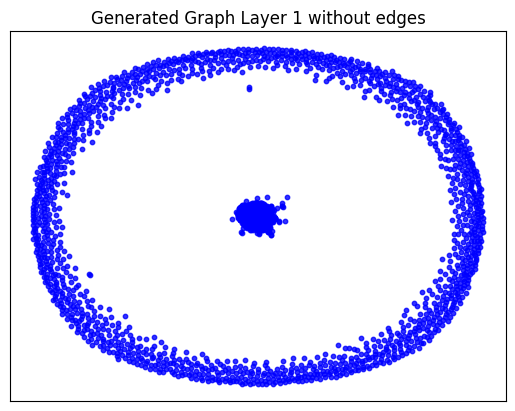

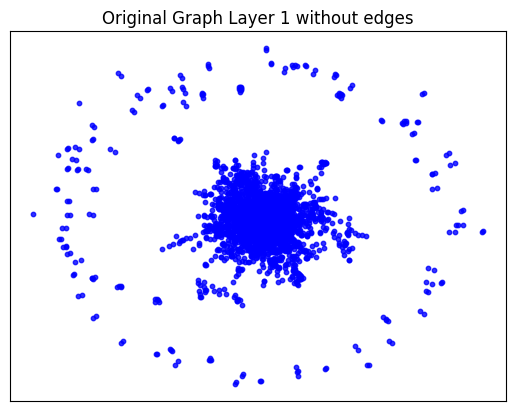

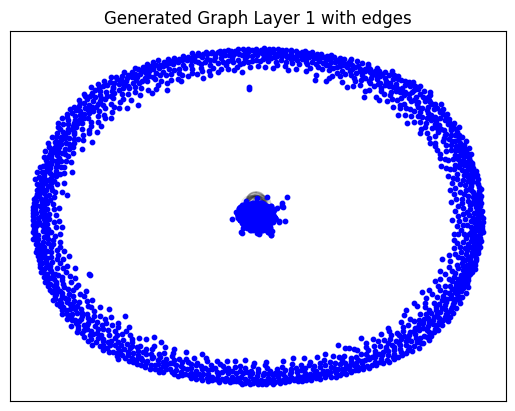

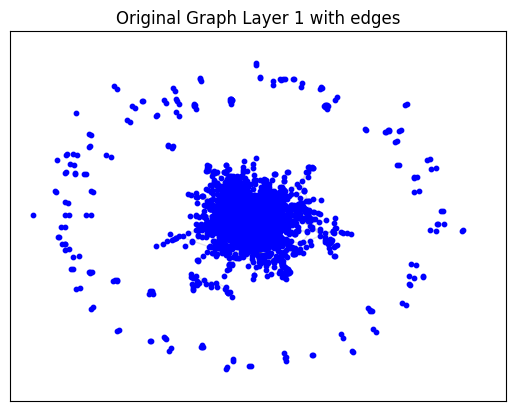

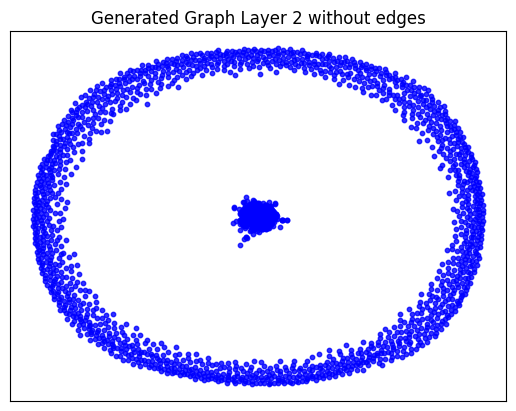

...

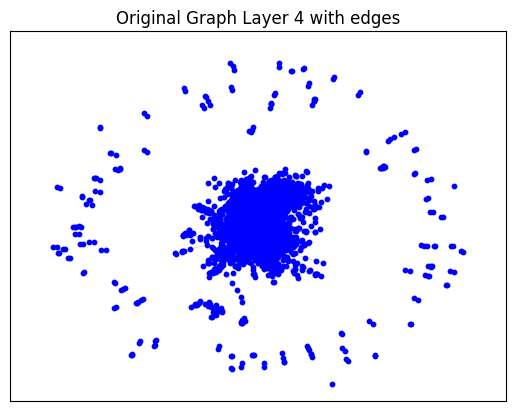

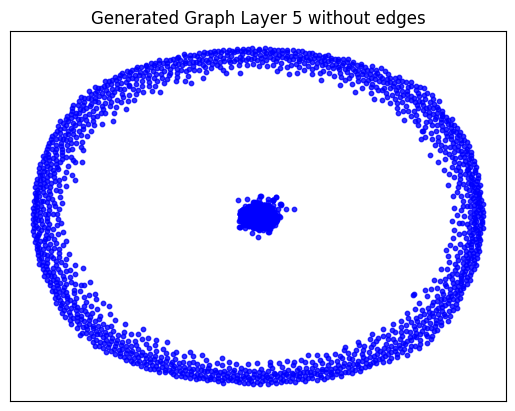

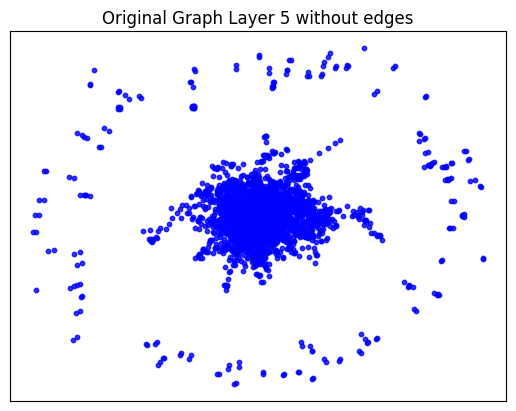

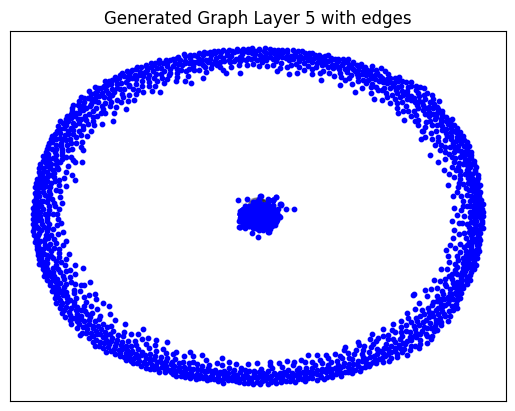

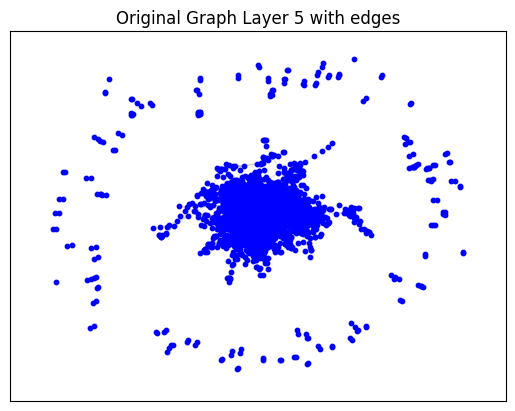

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_cora.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
targets is deprecated, use labels instead


Epoch 0 - Cost: 1.7119295597076416, Accuracy: 0.5004153847694397
Epoch 1 - Cost: 1.704107642173767, Accuracy: 0.5001063942909241
Epoch 2 - Cost: 1.7029954195022583, Accuracy: 0.5002713799476624
Epoch 3 - Cost: 1.6811445951461792, Accuracy: 0.4995565414428711
Epoch 4 - Cost: 1.631188154220581, Accuracy: 0.5001603364944458
Epoch 5 - Cost: 1.591827154159546, Accuracy: 0.4999350905418396
Epoch 6 - Cost: 1.6077369451522827, Accuracy: 0.499606192111969
Epoch 7 - Cost: 1.5796300172805786, Accuracy: 0.4984252452850342
Epoch 8 - Cost: 1.5020581483840942, Accuracy: 0.49751052260398865
Epoch 9 - Cost: 1.436898946762085, Accuracy: 0.49540039896965027
Epoch 10 - Cost: 1.3733960390090942, Accuracy: 0.49197492003440857
Epoch 11 - Cost: 1.3171696662902832, Accuracy: 0.4894377291202545
Epoch 12 - Cost: 1.2686530351638794, Accuracy: 0.4876363277435303
Epoch 13 - Cost: 1.182252049446106, Accuracy: 0.47861960530281067
Epoch 14 - Cost: 1.14200758934021, Accuracy: 0.4714566469192505
Epoch 15 - Cost: 1.09948

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.12045407295227051 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 275, 'd_min': 0, 'd': 1.792466765140325, 'LCC': 1097, 'wedge_count': 119101.0, 'claw_count': 6540250.0, 'triangle_count': 2524, 'power_law_exp': 2.5209270117257936, 'gini': 0.8421959625800097, 'rel_edge_distr_entropy': 0.7473920050356125, 'assortativity': -0.35084442946253575, 'clustering_coefficient': 0.0011577539084897366, 'n_components': 1549}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  q = np.asarray(q, dtype=np.float)


KL divergence between original network and the network generated by Music_GAN: 0.29407866818610745
KL divergence between original network and the network generated by Random E-R: 4.813177031753463
KL divergence between original network and the network generated by Random B-A: 1.0360588543112406
KL divergence between original network and the network generated by GAE: 1.3552517523579974
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.9560025440966826
KL divergence between original network and the network generated by Random E-R: 1.209039809672312
KL divergence between original network and the network generated by Random B-A: 0.9438793540448281
KL divergence between original network and the network generated by GAE: 0.21774545857451194


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

**PubMed Simulation:** <br>
The file taken from here: https://github.com/chennnM/GCNII/blob/master/data/ind.pubmed.graph <br>
Training MiscGan with the integrate G-Unets that trained with PROTEINS
<br>
We will split the dataset because of the limitation of GPU.

First batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_1.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_1'
args.filename = 'pubmed_1_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_1'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 13.6686
Epoch: [ 2] time: 13.9049
Epoch: [ 3] time: 14.1540
Epoch: [ 4] time: 14.3706
Epoch: [ 5] time: 14.6675
Epoch: [ 6] time: 14.8854
Epoch: [ 7] time: 15.1018
Epoch: [ 8] time: 15.3180
Epoch: [ 9] time: 15.5338
Epoch: [10] time: 15.7506
Epoch: [11] time: 15.9657
Epoch: [12] time: 16.1810
Epoch: [13] time: 16.3962
Epoch: [14] time: 16.6118
Epoch: [15] time: 16.8268
Epoch: [16] time: 17.0427
Epoch: [17] time: 17.2585
Epoch: [18] time: 17.4745
Epoch: [19] time: 17.6893
Epoch: [20] time: 17.9040
Epoch: [21] time: 18.1190
Epoch: [22] time: 18.3344
Epoch: [23] time: 18.5498
Epoch: [24] time: 18.7659
Epoch: [25] time: 18.9822
Epoch: [26] time: 19.1979
Epoch: [27] time: 19.4129
Epoch: [28] time: 19.6282
Epoch: [29] time: 19.8433
Epoch: [30] time: 20.0596
Epoch: [31] time: 20.2750
Epoch: [32] time: 20.4900
Epoch: [33] time: 20.7050
Epoch: [34] time: 20.9203
Epoch: [35] time: 21.1361
Epoch: [36] time: 21.3510
Epoch: [37] time: 21.5664
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6706, 6706])
Shape of feature_tensor before unpooling: torch.Size([6706, 64])
Shapes in down_outs: [torch.Size([6706, 64]), torch.Size([6035, 64]), torch.Size([4828, 64])]
Shapes in indices_list: [torch.Size([6035]), torch.Size([4828]), torch.Size([3379])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6706, 64])
Shape of indices_list[0]: torch.Size([6035])
Shape of new_h before assignment: torch.Size([6706, 64])
Shape of h_subset: torch.Size([6035, 64])
Shape of idx: torch.Size([6035])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([6035, 64])
Shape of indices_list[1]: torch.Size([4828])
Shape of new_h before assignment: torch.Size([6706, 64])
Shape of h_subset: torch.Size([4828, 64])
Shape of idx: torch.Size([4828])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4828, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.03540849685668945 seconds to compute statistics_degrees ---
--- 1.6124992370605469 seconds to compute statistics_LCC ---
--- 0.046918392181396484 seconds to compute statistics_wedge_count ---
--- 0.048774003982543945 seconds to compute statistics_claw_count ---
--- 0.2730295658111572 seconds to compute statistics_triangle_count ---
--- 0.03718304634094238 seconds to compute statistics_power_law_alpha ---
--- 0.03658175468444824 seconds to compute statistics_gini ---
--- 0.17498517036437988 seconds to compute statistics_edge_distribution_entropy ---
--- 0.06082892417907715 seconds to compute degree_assortativity_coefficient ---
--- 0.8094453811645508 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 125, 'd_min': 1, 'd': 2.3755406413124533, 'LCC': 5620, 'wedge_count': 72247.0, 'claw_count': 926637.0, 'triangle_count': 239, 'power_law_exp': 3.2411099164062187, 'gini': 0

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07854747772216797 seconds to compute degree_assortativity_coefficient ---
--- 0.7575559616088867 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 96, 'd_min': 0, 'd': 2.3758389261744965, 'LCC': 1808, 'wedge_count': 238511.0, 'claw_count': 3553869.0, 'triangle_count': 7561, 'power_law_exp': 1.4941575214128133, 'gini': 0.9207810831597785, 'rel_edge_distr_entropy': 0.7437812046980098, 'assortativity': -0.15707537059848167, 'clustering_coefficient': 0.006382621306525367, 'n_components': 4897}
Computing metrics for ER graph
--- 0.0326385498046875 seconds to compute statistics_degrees ---
--- 2.0252468585968018 seconds to compute statistics_LCC ---
--- 0.034388065338134766 seconds to compute statistics_wedge_count ---
--- 0.0356292724609375 seconds to compute statistics_claw_count ---
--- 0.4223804473876953 seconds to compute statistics_triangle_count ---
--- 0.03444719314575195 seconds to compute statistics_

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1681046485900879 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0793919563293457 seconds to compute degree_assortativity_coefficient ---
--- 1.0058138370513916 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.751081282624907, 'LCC': 6644, 'wedge_count': 75420.0, 'claw_count': 118663.0, 'triangle_count': 18, 'power_law_exp': 1.6874716490341513, 'gini': 0.2531662241458674, 'rel_edge_distr_entropy': 0.9876569226228041, 'assortativity': 0.009448577598538606, 'clustering_coefficient': 0.0004550702409344109, 'n_components': 62}
Computing metrics for bara graph
--- 0.032262563705444336 seconds to compute statistics_degrees ---
--- 2.634636640548706 seconds to compute statistics_LCC ---
--- 0.03443193435668945 seconds to compute statistics_wedge_count ---
--- 0.03557276725769043 seconds to compute statistics_claw_count ---
--- 34.88722801208496 seconds to compute st

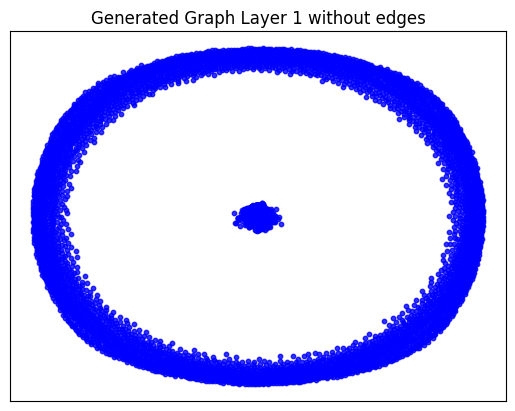

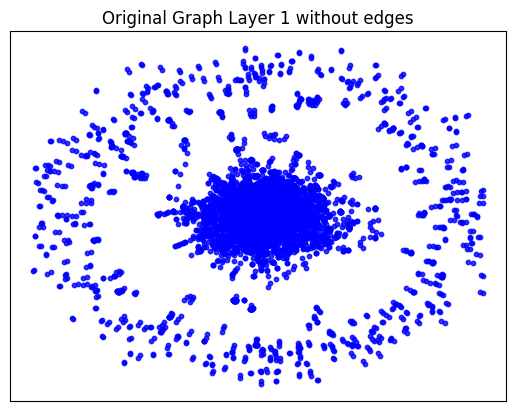

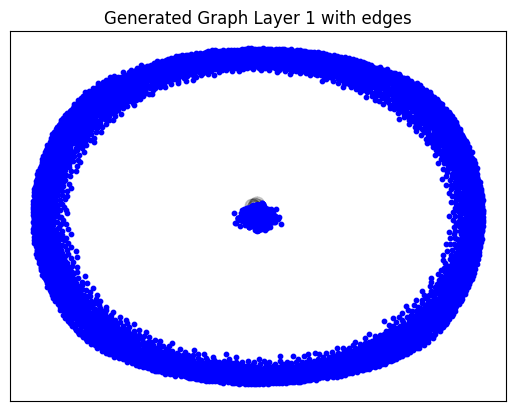

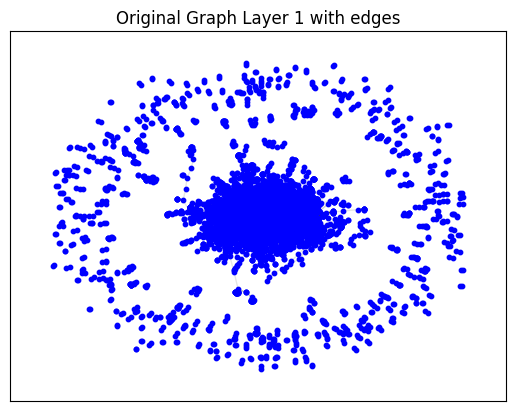

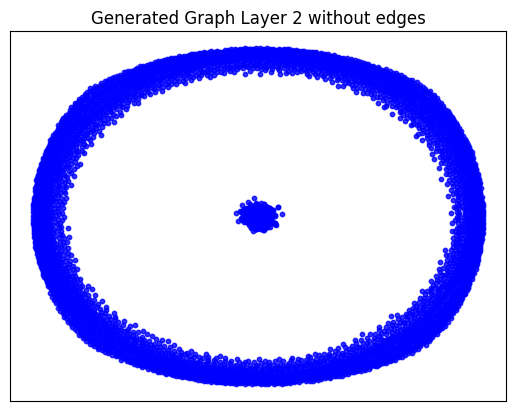

...

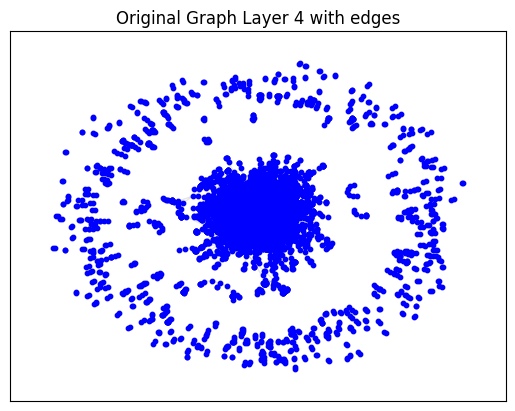

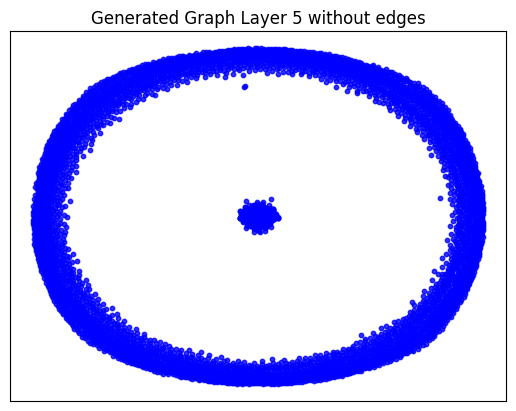

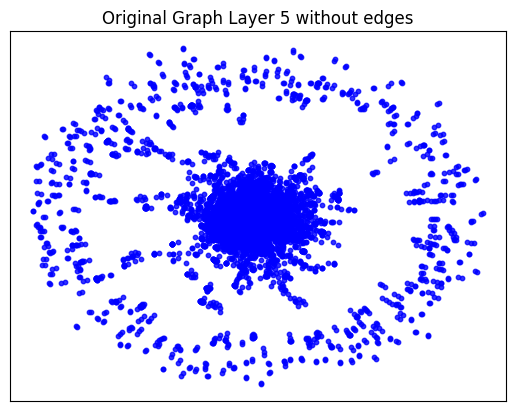

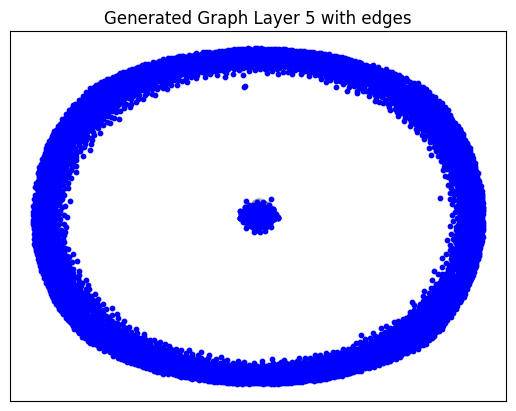

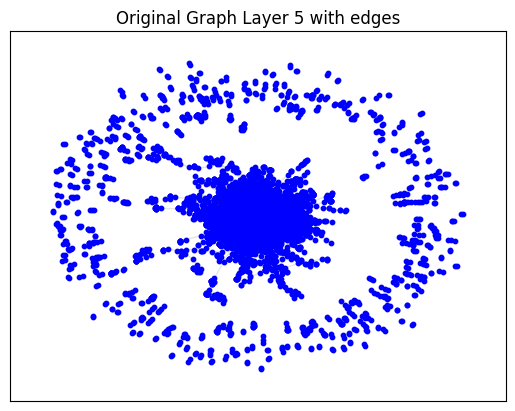

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_1.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


Epoch 0 - Cost: 1.7449625730514526, Accuracy: 0.5001486539840698
Epoch 1 - Cost: 1.7009016275405884, Accuracy: 0.5002387166023254
Epoch 2 - Cost: 1.6923487186431885, Accuracy: 0.49977803230285645
Epoch 3 - Cost: 1.6792123317718506, Accuracy: 0.49960094690322876
Epoch 4 - Cost: 1.658725380897522, Accuracy: 0.49977678060531616
Epoch 5 - Cost: 1.654512643814087, Accuracy: 0.49930447340011597
Epoch 6 - Cost: 1.6038529872894287, Accuracy: 0.4994831383228302
Epoch 7 - Cost: 1.5351228713989258, Accuracy: 0.4989089369773865
Epoch 8 - Cost: 1.4986896514892578, Accuracy: 0.4981570541858673
Epoch 9 - Cost: 1.4720604419708252, Accuracy: 0.4969438910484314
Epoch 10 - Cost: 1.4146672487258911, Accuracy: 0.49585795402526855
Epoch 11 - Cost: 1.366860032081604, Accuracy: 0.49443021416664124
Epoch 12 - Cost: 1.3212993144989014, Accuracy: 0.489967942237854
Epoch 13 - Cost: 1.2516635656356812, Accuracy: 0.4834395945072174
Epoch 14 - Cost: 1.2041146755218506, Accuracy: 0.4750997722148895
Epoch 15 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1743917465209961 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04987621307373047 seconds to compute degree_assortativity_coefficient ---
--- 0.8208301067352295 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 261, 'd_min': 0, 'd': 1.235759021771548, 'LCC': 1482, 'wedge_count': 165807.0, 'claw_count': 6478147.0, 'triangle_count': 8558, 'power_law_exp': 2.272989069669773, 'gini': 0.9308674152535037, 'rel_edge_distr_entropy': 0.7046516113359376, 'assortativity': -0.30522096802482734, 'clustering_coefficient': 0.003963170332504032, 'n_components': 5223}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.24319972240014043
KL divergence between original network and the network generated by Random E-R: 6.654088534446944
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0005099393694016134
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.367669240737285
KL divergence between original network and the network generated by Random E-R: 11.575588294378182
KL divergence between original network and the network generated by Random B-A: 1.902098495411995
KL divergence between original network and the network generated by GAE: 33.28080293988703


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Second batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_2.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_2'
args.filename = 'pubmed_2_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_2'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.2860
Epoch: [ 2] time: 10.4634
Epoch: [ 3] time: 10.6417
Epoch: [ 4] time: 10.8192
Epoch: [ 5] time: 10.9979
Epoch: [ 6] time: 11.1760
Epoch: [ 7] time: 11.3551
Epoch: [ 8] time: 11.5331
Epoch: [ 9] time: 11.7116
Epoch: [10] time: 11.8893
Epoch: [11] time: 12.0674
Epoch: [12] time: 12.2437
Epoch: [13] time: 12.4216
Epoch: [14] time: 12.5986
Epoch: [15] time: 12.7769
Epoch: [16] time: 12.9543
Epoch: [17] time: 13.1310
Epoch: [18] time: 13.3077
Epoch: [19] time: 13.4845
Epoch: [20] time: 13.6628
Epoch: [21] time: 13.8411
Epoch: [22] time: 14.0181
Epoch: [23] time: 14.1951
Epoch: [24] time: 14.3731
Epoch: [25] time: 14.5501
Epoch: [26] time: 14.7269
Epoch: [27] time: 14.9040
Epoch: [28] time: 15.0809
Epoch: [29] time: 15.2581
Epoch: [30] time: 15.4369
Epoch: [31] time: 15.6153
Epoch: [32] time: 15.7925
Epoch: [33] time: 15.9701
Epoch: [34] time: 16.1479
Epoch: [35] time: 16.3261
Epoch: [36] time: 16.5032
Epoch: [37] time: 16.6816
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6179, 6179])
Shape of feature_tensor before unpooling: torch.Size([6179, 64])
Shapes in down_outs: [torch.Size([6179, 64]), torch.Size([5561, 64]), torch.Size([4448, 64])]
Shapes in indices_list: [torch.Size([5561]), torch.Size([4448]), torch.Size([3113])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6179, 64])
Shape of indices_list[0]: torch.Size([5561])
Shape of new_h before assignment: torch.Size([6179, 64])
Shape of h_subset: torch.Size([5561, 64])
Shape of idx: torch.Size([5561])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5561, 64])
Shape of indices_list[1]: torch.Size([4448])
Shape of new_h before assignment: torch.Size([6179, 64])
Shape of h_subset: torch.Size([4448, 64])
Shape of idx: torch.Size([4448])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4448, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02835249900817871 seconds to compute statistics_degrees ---
--- 1.3245460987091064 seconds to compute statistics_LCC ---
--- 0.03953909873962402 seconds to compute statistics_wedge_count ---
--- 0.04016852378845215 seconds to compute statistics_claw_count ---
--- 0.2358386516571045 seconds to compute statistics_triangle_count ---
--- 0.029938936233520508 seconds to compute statistics_power_law_alpha ---
--- 0.029824256896972656 seconds to compute statistics_gini ---
--- 0.14637088775634766 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05551481246948242 seconds to compute degree_assortativity_coefficient ---
--- 0.664475679397583 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 121, 'd_min': 1, 'd': 2.42667529944966, 'LCC': 5083, 'wedge_count': 68270.0, 'claw_count': 838883.0, 'triangle_count': 315, 'power_law_exp': 3.1452805865076616, 'gini': 0.49

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5634076595306396 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 103, 'd_min': 0, 'd': 2.4279702168986725, 'LCC': 1577, 'wedge_count': 297012.0, 'claw_count': 5504018.0, 'triangle_count': 1173, 'power_law_exp': 1.4735333806759632, 'gini': 0.9395846120643143, 'rel_edge_distr_entropy': 0.7113263242977952, 'assortativity': 0.07876860808284525, 'clustering_coefficient': 0.00063935110677327, 'n_components': 4582}
Computing metrics for ER graph
--- 0.026873111724853516 seconds to compute statistics_degrees ---
--- 1.6696240901947021 seconds to compute statistics_LCC ---
--- 0.02973008155822754 seconds to compute statistics_wedge_count ---
--- 0.029852867126464844 seconds to compute statistics_claw_count ---
--- 0.36113786697387695 seconds to compute statistics_triangle_count ---
--- 0.029334545135498047 seconds to compute statistics_power_law_alpha ---
--- 0.029095888137817383 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0757298469543457 seconds to compute degree_assortativity_coefficient ---
--- 0.8321409225463867 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.85335059889932, 'LCC': 6131, 'wedge_count': 72729.0, 'claw_count': 118109.0, 'triangle_count': 25, 'power_law_exp': 1.6785493630251194, 'gini': 0.25137152029803844, 'rel_edge_distr_entropy': 0.987736461708979, 'assortativity': -0.010534271976228304, 'clustering_coefficient': 0.000635006646402899, 'n_components': 47}
Computing metrics for bara graph
--- 0.02707219123840332 seconds to compute statistics_degrees ---
--- 2.1679418087005615 seconds to compute statistics_LCC ---
--- 0.029555082321166992 seconds to compute statistics_wedge_count ---
--- 0.0301969051361084 seconds to compute statistics_claw_count ---
--- 31.754567861557007 seconds to compute statistics_triangle_count ---
--- 0.0294497013092041 seconds to compute statistics_po

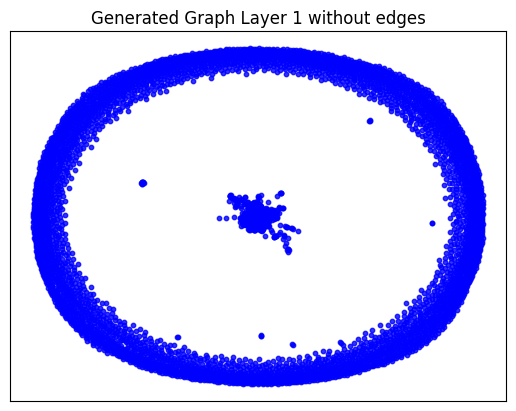

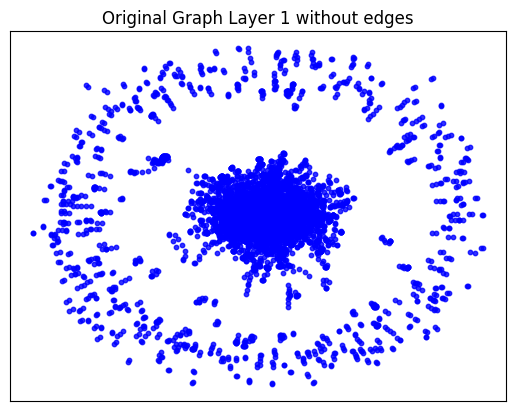

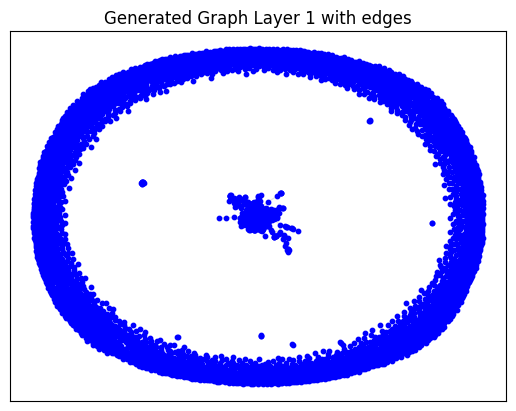

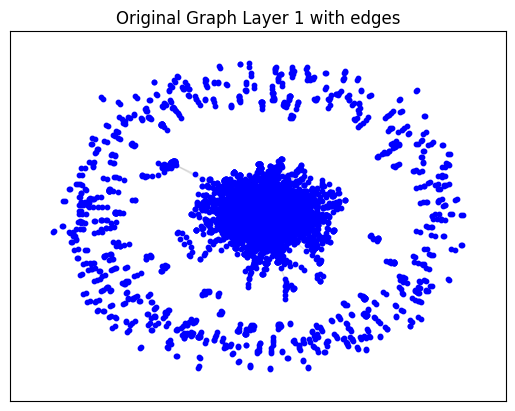

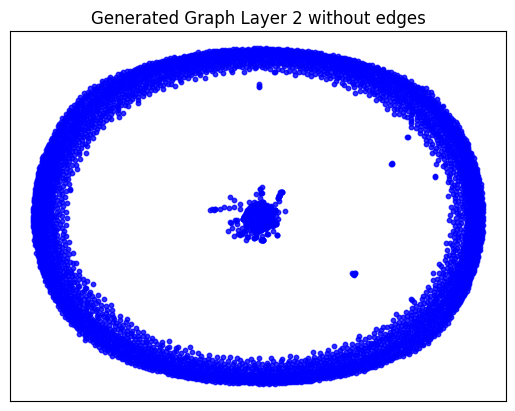

...

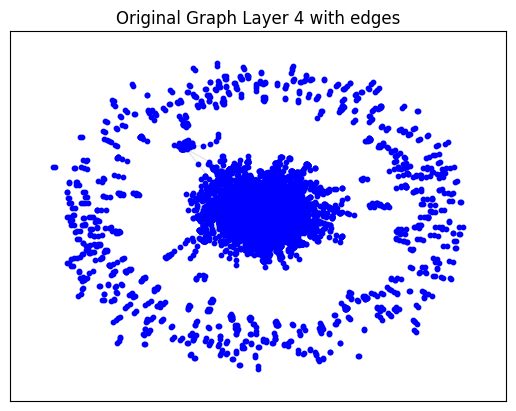

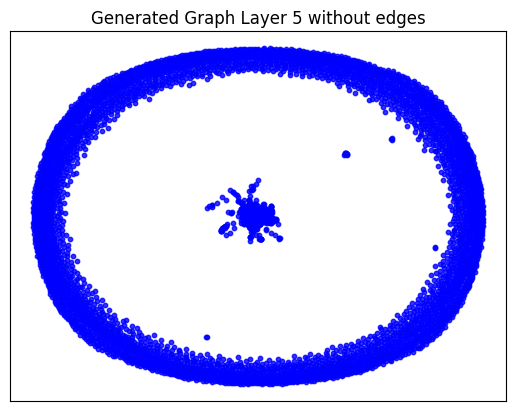

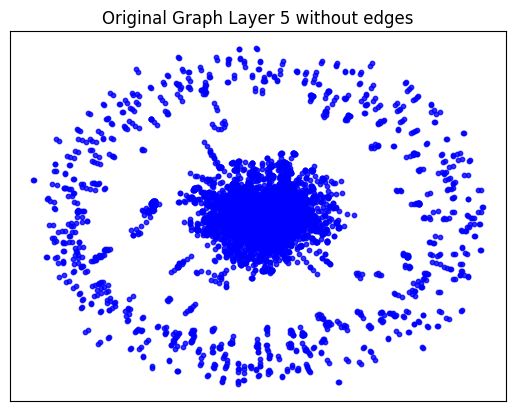

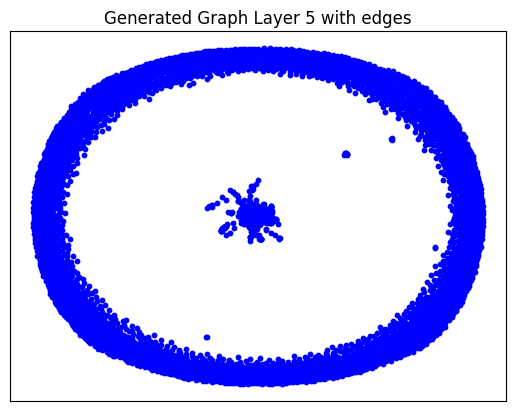

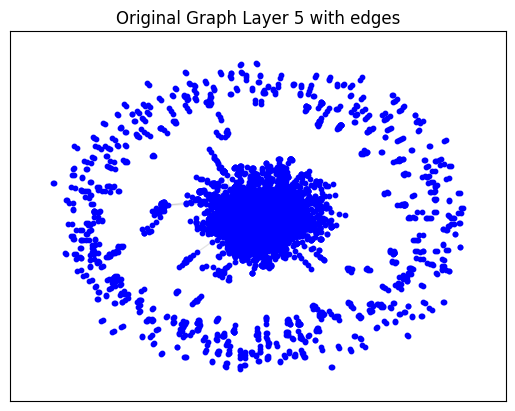

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_2.
Epoch 0 - Cost: 1.7120190858840942, Accuracy: 0.5001479387283325
Epoch 1 - Cost: 1.7493611574172974, Accuracy: 0.5000737309455872
Epoch 2 - Cost: 1.688991904258728, Accuracy: 0.5000778436660767
Epoch 3 - Cost: 1.7056758403778076, Accuracy: 0.49957025051116943
Epoch 4 - Cost: 1.6514511108398438, Accuracy: 0.49963635206222534
Epoch 5 - Cost: 1.611101508140564, Accuracy: 0.4992236793041229
Epoch 6 - Cost: 1.582106351852417, Accuracy: 0.499030739068985
Epoch 7 - Cost: 1.5366772413253784, Accuracy: 0.4981793761253357
Epoch 8 - Cost: 1.5037974119186401, Accuracy: 0.4977993667125702
Epoch 9 - Cost: 1.46920907497406, Accuracy: 0.4957578778266907
Epoch 10 - Cost: 1.3994401693344116, Accuracy: 0.4923669099807739
Epoch 11 - Cost: 1.330765962600708, Accuracy: 0.4906250536441803
Epoch 12 - Cost: 1.2735728025436401, Accuracy: 0.4850826859474182
Epoch 13 - Cost: 1.213

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14882254600524902 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04876899719238281 seconds to compute degree_assortativity_coefficient ---
--- 0.6620993614196777 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 191, 'd_min': 0, 'd': 1.266062469655284, 'LCC': 1254, 'wedge_count': 156260.0, 'claw_count': 4898067.0, 'triangle_count': 11480, 'power_law_exp': 2.164855042917667, 'gini': 0.9387857669930875, 'rel_edge_distr_entropy': 0.6920581235921235, 'assortativity': -0.2822296479291649, 'clustering_coefficient': 0.0070313452225132895, 'n_components': 4924}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.843670424920067
KL divergence between original network and the network generated by Random E-R: 6.622664725132172
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.00047966572782292383
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.025916833965002
KL divergence between original network and the network generated by Random E-R: 10.10488362329867
KL divergence between original network and the network generated by Random B-A: 2.0660779666222138
KL divergence between original network and the network generated by GAE: 30.595288826741257


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Third batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_3.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_3'
args.filename = 'pubmed_3_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_3'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 11.8472
Epoch: [ 2] time: 12.1837
Epoch: [ 3] time: 12.5198
Epoch: [ 4] time: 12.8562
Epoch: [ 5] time: 13.1934
Epoch: [ 6] time: 13.5305
Epoch: [ 7] time: 13.8671
Epoch: [ 8] time: 14.2037
Epoch: [ 9] time: 14.5402
Epoch: [10] time: 14.8768
Epoch: [11] time: 15.2131
Epoch: [12] time: 15.5497
Epoch: [13] time: 15.8870
Epoch: [14] time: 16.2240
Epoch: [15] time: 16.5615
Epoch: [16] time: 16.8981
Epoch: [17] time: 17.2346
Epoch: [18] time: 17.5717
Epoch: [19] time: 17.9079
Epoch: [20] time: 18.2438
Epoch: [21] time: 18.5799
Epoch: [22] time: 18.9160
Epoch: [23] time: 19.2525
Epoch: [24] time: 19.5885
Epoch: [25] time: 19.9250
Epoch: [26] time: 20.2616
Epoch: [27] time: 20.5980
Epoch: [28] time: 20.9348
Epoch: [29] time: 21.2710
Epoch: [30] time: 21.6071
Epoch: [31] time: 21.9459
Epoch: [32] time: 22.2817
Epoch: [33] time: 22.6179
Epoch: [34] time: 22.9547
Epoch: [35] time: 23.2912
Epoch: [36] time: 23.6272
Epoch: [37] time: 23.9641
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6249, 6249])
Shape of feature_tensor before unpooling: torch.Size([6249, 64])
Shapes in down_outs: [torch.Size([6249, 64]), torch.Size([5624, 64]), torch.Size([4499, 64])]
Shapes in indices_list: [torch.Size([5624]), torch.Size([4499]), torch.Size([3149])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6249, 64])
Shape of indices_list[0]: torch.Size([5624])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([5624, 64])
Shape of idx: torch.Size([5624])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5624, 64])
Shape of indices_list[1]: torch.Size([4499])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([4499, 64])
Shape of idx: torch.Size([4499])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4499, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.029447555541992188 seconds to compute statistics_degrees ---
--- 1.307837963104248 seconds to compute statistics_LCC ---
--- 0.040393829345703125 seconds to compute statistics_wedge_count ---
--- 0.04214596748352051 seconds to compute statistics_claw_count ---
--- 0.24013113975524902 seconds to compute statistics_triangle_count ---
--- 0.030278921127319336 seconds to compute statistics_power_law_alpha ---
--- 0.030690908432006836 seconds to compute statistics_gini ---
--- 0.15106701850891113 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05492210388183594 seconds to compute degree_assortativity_coefficient ---
--- 0.7221784591674805 seconds to compute connected_components ---
--- 1.1920928955078125e-06 seconds to compute statistics_cluster_props ---
{'d_max': 67, 'd_min': 1, 'd': 2.3970870678617158, 'LCC': 5101, 'wedge_count': 61532.0, 'claw_count': 513132.0, 'triangle_count': 269, 'power_law_exp': 3.196356649714029, 'gini':

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5334615707397461 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 100, 'd_min': 0, 'd': 2.4022087067861717, 'LCC': 2723, 'wedge_count': 195444.0, 'claw_count': 2866748.0, 'triangle_count': 1650, 'power_law_exp': 1.6287362678768473, 'gini': 0.896207079422854, 'rel_edge_distr_entropy': 0.7709801296648222, 'assortativity': 0.12135729414241067, 'clustering_coefficient': 0.0017266951960897853, 'n_components': 3511}
Computing metrics for ER graph
--- 0.02786421775817871 seconds to compute statistics_degrees ---
--- 1.671987771987915 seconds to compute statistics_LCC ---
--- 0.030658960342407227 seconds to compute statistics_wedge_count ---
--- 0.030748605728149414 seconds to compute statistics_claw_count ---
--- 0.3683135509490967 seconds to compute statistics_triangle_count ---
--- 0.030266523361206055 seconds to compute statistics_power_law_alpha ---
--- 0.02983832359313965 seconds to compute statistics_gin

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14504218101501465 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07432699203491211 seconds to compute degree_assortativity_coefficient ---
--- 0.8390624523162842 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.7941741357234315, 'LCC': 6193, 'wedge_count': 71768.0, 'claw_count': 115184.0, 'triangle_count': 10, 'power_law_exp': 1.6834876383634476, 'gini': 0.2526275350757632, 'rel_edge_distr_entropy': 0.9875602319074572, 'assortativity': 0.007318439758041037, 'clustering_coefficient': 0.0002604528406723156, 'n_components': 56}
Computing metrics for bara graph
--- 0.028112173080444336 seconds to compute statistics_degrees ---
--- 2.1512434482574463 seconds to compute statistics_LCC ---
--- 0.030386686325073242 seconds to compute statistics_wedge_count ---
--- 0.03115534782409668 seconds to compute statistics_claw_count ---
--- 32.4982373714447 seconds to comput

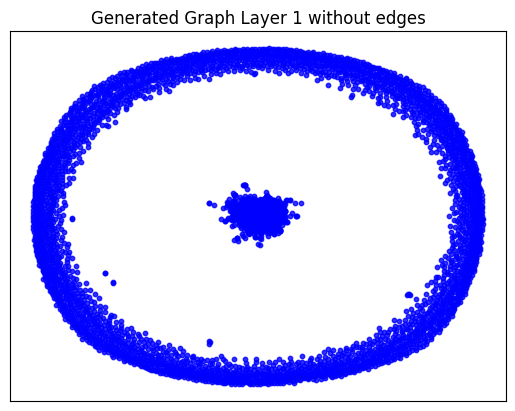

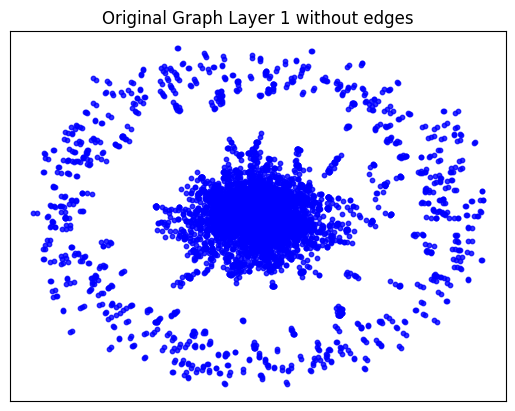

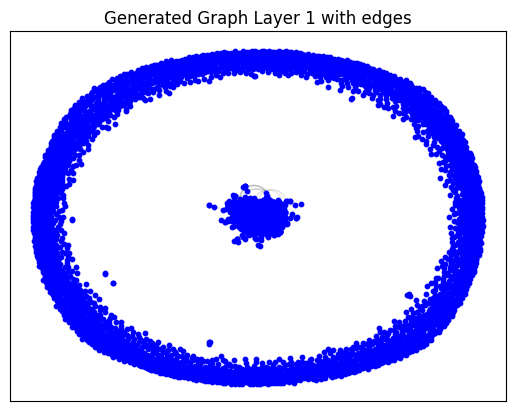

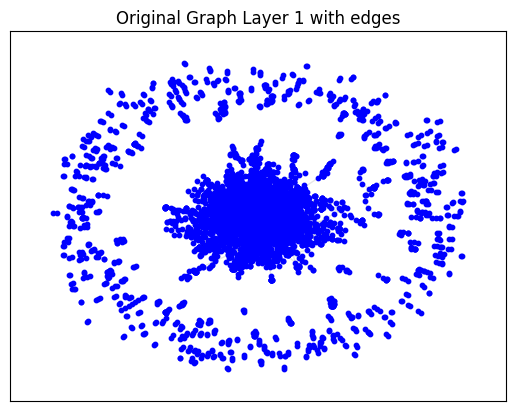

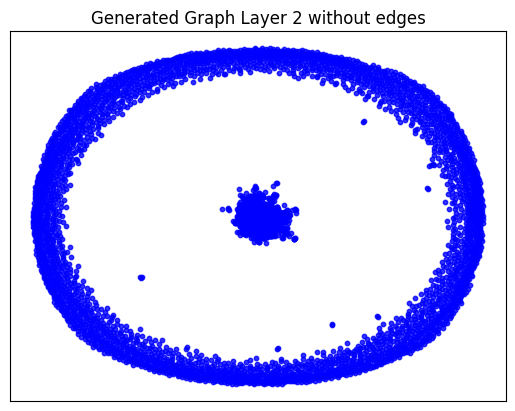

...

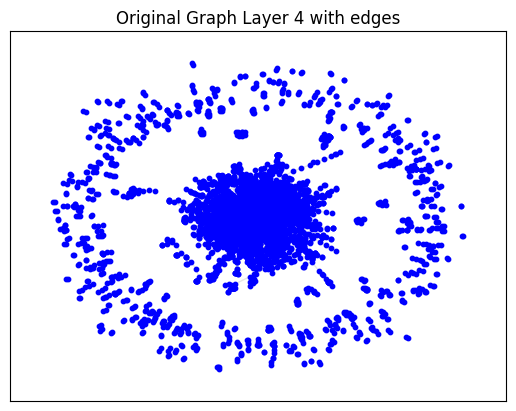

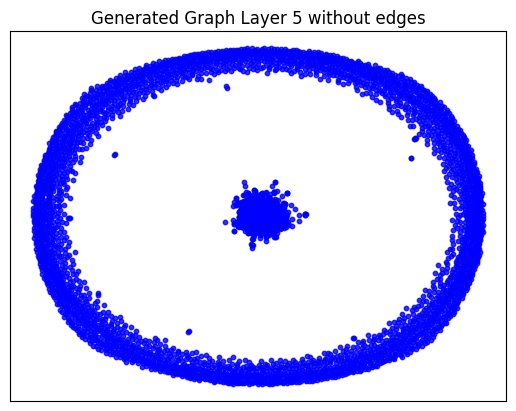

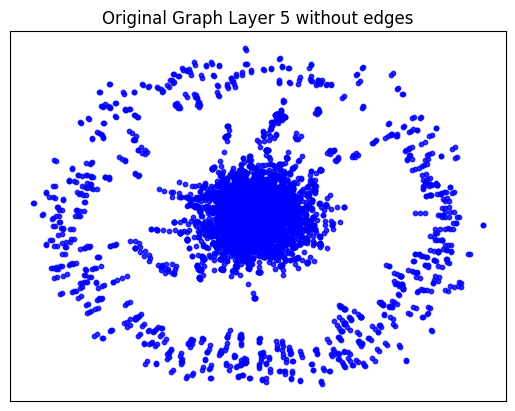

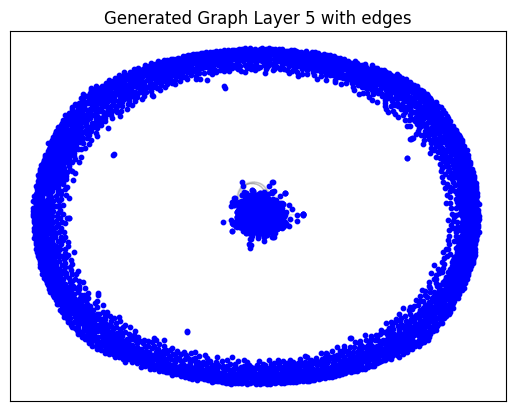

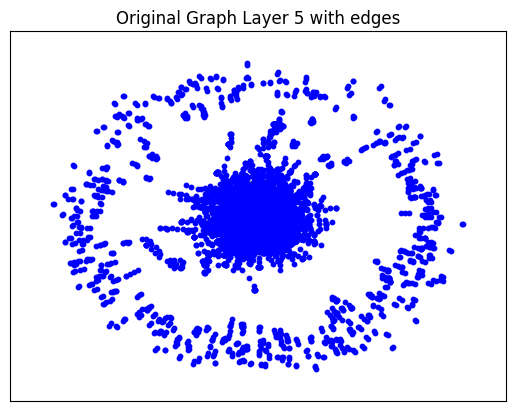

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_3.
Epoch 0 - Cost: 1.7176573276519775, Accuracy: 0.5000187158584595
Epoch 1 - Cost: 1.707345724105835, Accuracy: 0.5002131462097168
Epoch 2 - Cost: 1.6714779138565063, Accuracy: 0.49991917610168457
Epoch 3 - Cost: 1.6351901292800903, Accuracy: 0.499621719121933
Epoch 4 - Cost: 1.6144275665283203, Accuracy: 0.4996008276939392
Epoch 5 - Cost: 1.5369980335235596, Accuracy: 0.4994567334651947
Epoch 6 - Cost: 1.505509853363037, Accuracy: 0.4988069534301758
Epoch 7 - Cost: 1.4807289838790894, Accuracy: 0.4985114336013794
Epoch 8 - Cost: 1.433118224143982, Accuracy: 0.4975173771381378
Epoch 9 - Cost: 1.375165343284607, Accuracy: 0.49494585394859314
Epoch 10 - Cost: 1.316099762916565, Accuracy: 0.49270910024642944
Epoch 11 - Cost: 1.2444326877593994, Accuracy: 0.4878426194190979
Epoch 12 - Cost: 1.1943145990371704, Accuracy: 0.4819512367248535
Epoch 13 - Cost: 1.1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15153217315673828 seconds to compute statistics_edge_distribution_entropy ---
--- 0.049199819564819336 seconds to compute degree_assortativity_coefficient ---
--- 0.6495733261108398 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 150, 'd_min': 0, 'd': 1.247559609537526, 'LCC': 1098, 'wedge_count': 140703.0, 'claw_count': 3442217.0, 'triangle_count': 11228, 'power_law_exp': 1.99082451227665, 'gini': 0.9441719192259064, 'rel_edge_distr_entropy': 0.6888555036487604, 'assortativity': -0.35167830917968723, 'clustering_coefficient': 0.00978555390319669, 'n_components': 5151}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.45531125101443515
KL divergence between original network and the network generated by Random E-R: 5.15307578111311
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.019499632065631
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.9315581940111838
KL divergence between original network and the network generated by Random E-R: 11.96553303585995
KL divergence between original network and the network generated by Random B-A: 1.9163597239350083
KL divergence between original network and the network generated by GAE: 37.89071803694582


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fourth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_4.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_4'
args.filename = 'pubmed_4_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_4'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.6665
Epoch: [ 2] time: 11.0221
Epoch: [ 3] time: 11.3773
Epoch: [ 4] time: 11.7336
Epoch: [ 5] time: 12.0896
Epoch: [ 6] time: 12.4456
Epoch: [ 7] time: 12.8023
Epoch: [ 8] time: 13.1587
Epoch: [ 9] time: 13.5135
Epoch: [10] time: 13.8696
Epoch: [11] time: 14.2256
Epoch: [12] time: 14.5818
Epoch: [13] time: 14.9379
Epoch: [14] time: 15.2929
Epoch: [15] time: 15.6488
Epoch: [16] time: 16.0053
Epoch: [17] time: 16.3616
Epoch: [18] time: 16.7181
Epoch: [19] time: 17.0753
Epoch: [20] time: 17.4318
Epoch: [21] time: 17.7889
Epoch: [22] time: 18.1465
Epoch: [23] time: 18.5046
Epoch: [24] time: 18.8618
Epoch: [25] time: 19.2179
Epoch: [26] time: 19.5747
Epoch: [27] time: 19.9316
Epoch: [28] time: 20.2886
Epoch: [29] time: 20.6459
Epoch: [30] time: 21.0025
Epoch: [31] time: 21.3592
Epoch: [32] time: 21.7160
Epoch: [33] time: 22.0734
Epoch: [34] time: 22.4283
Epoch: [35] time: 22.7847
Epoch: [36] time: 23.1413
Epoch: [37] time: 23.4971
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6377, 6377])
Shape of feature_tensor before unpooling: torch.Size([6377, 64])
Shapes in down_outs: [torch.Size([6377, 64]), torch.Size([5739, 64]), torch.Size([4591, 64])]
Shapes in indices_list: [torch.Size([5739]), torch.Size([4591]), torch.Size([3213])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6377, 64])
Shape of indices_list[0]: torch.Size([5739])
Shape of new_h before assignment: torch.Size([6377, 64])
Shape of h_subset: torch.Size([5739, 64])
Shape of idx: torch.Size([5739])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5739, 64])
Shape of indices_list[1]: torch.Size([4591])
Shape of new_h before assignment: torch.Size([6377, 64])
Shape of h_subset: torch.Size([4591, 64])
Shape of idx: torch.Size([4591])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4591, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.030531644821166992 seconds to compute statistics_degrees ---
--- 1.3628249168395996 seconds to compute statistics_LCC ---
--- 0.041323184967041016 seconds to compute statistics_wedge_count ---
--- 0.04253411293029785 seconds to compute statistics_claw_count ---
--- 0.2589130401611328 seconds to compute statistics_triangle_count ---
--- 0.03219795227050781 seconds to compute statistics_power_law_alpha ---
--- 0.034502506256103516 seconds to compute statistics_gini ---
--- 0.16692042350769043 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0593264102935791 seconds to compute degree_assortativity_coefficient ---
--- 0.7113094329833984 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 77, 'd_min': 1, 'd': 2.363393977415307, 'LCC': 5306, 'wedge_count': 62382.0, 'claw_count': 599389.0, 'triangle_count': 226, 'power_law_exp': 3.210872721331903, 'gini': 0.48

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5507771968841553 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 115, 'd_min': 0, 'd': 2.367314930991217, 'LCC': 2161, 'wedge_count': 279037.0, 'claw_count': 5787970.0, 'triangle_count': 3176, 'power_law_exp': 1.5508515913004146, 'gini': 0.924651211255139, 'rel_edge_distr_entropy': 0.7340412671932052, 'assortativity': -0.0782421481717264, 'clustering_coefficient': 0.0016461730105719276, 'n_components': 4149}
Computing metrics for ER graph
--- 0.029499530792236328 seconds to compute statistics_degrees ---
--- 1.7470853328704834 seconds to compute statistics_LCC ---
--- 0.033313751220703125 seconds to compute statistics_wedge_count ---
--- 0.032564401626586914 seconds to compute statistics_claw_count ---
--- 0.37990427017211914 seconds to compute statistics_triangle_count ---
--- 0.031555891036987305 seconds to compute statistics_power_law_alpha ---
--- 0.03024888038635254 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15229153633117676 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07483911514282227 seconds to compute degree_assortativity_coefficient ---
--- 0.8737866878509521 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.726787954830614, 'LCC': 6313, 'wedge_count': 71356.0, 'claw_count': 112609.0, 'triangle_count': 18, 'power_law_exp': 1.691454153036066, 'gini': 0.2569782617691785, 'rel_edge_distr_entropy': 0.9871647496103418, 'assortativity': 0.010198182175930076, 'clustering_coefficient': 0.00047953538349510254, 'n_components': 64}
Computing metrics for bara graph
--- 0.028963565826416016 seconds to compute statistics_degrees ---
--- 2.228523015975952 seconds to compute statistics_LCC ---
--- 0.03064250946044922 seconds to compute statistics_wedge_count ---
--- 0.031158924102783203 seconds to compute statistics_claw_count ---
--- 32.59239482879639 seconds to comput

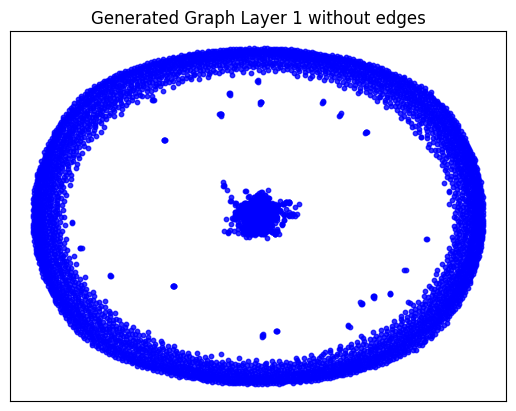

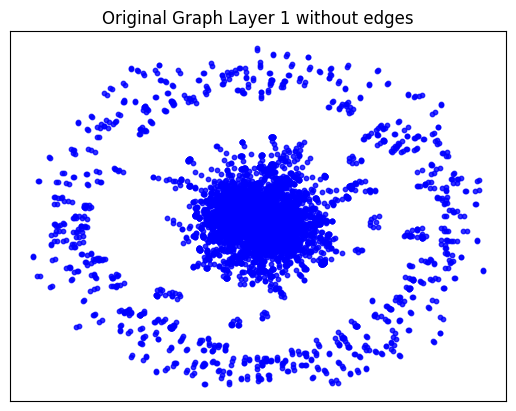

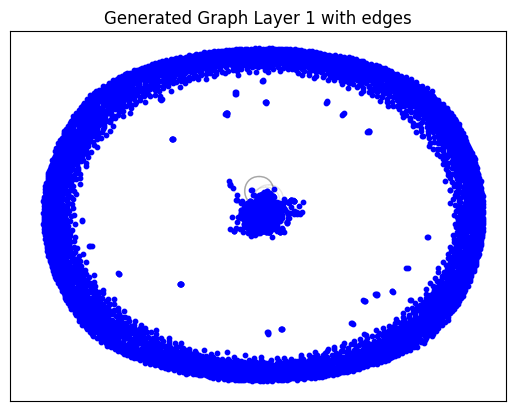

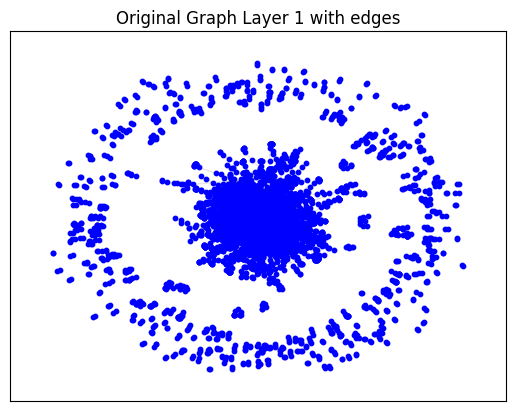

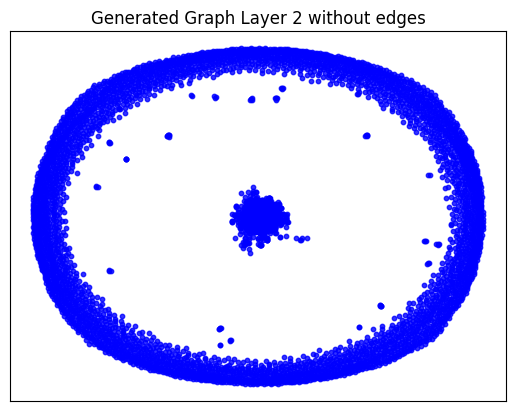

...

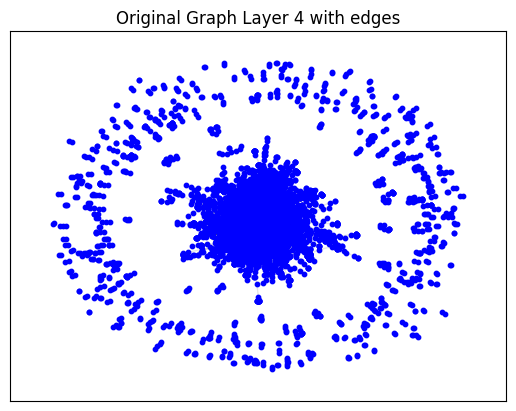

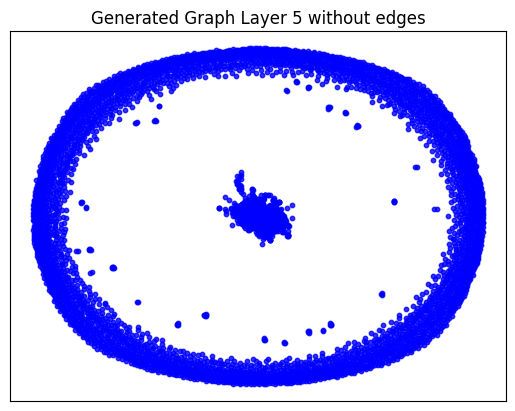

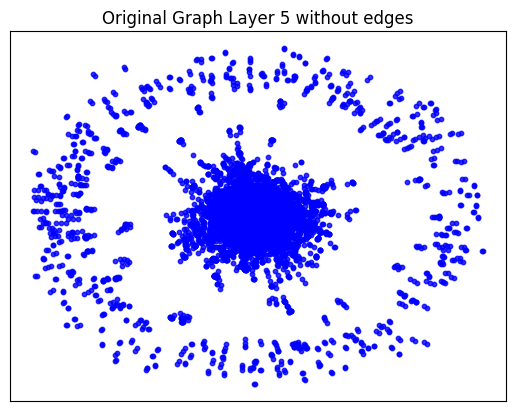

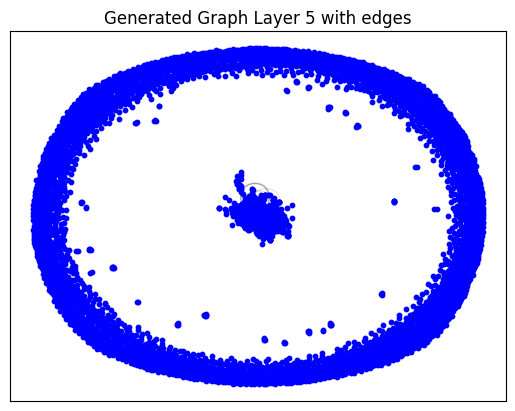

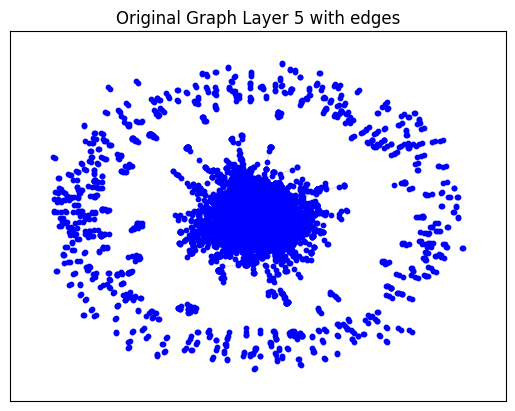

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_4.
Epoch 0 - Cost: 1.7240742444992065, Accuracy: 0.5001055598258972
Epoch 1 - Cost: 1.6973940134048462, Accuracy: 0.49993881583213806
Epoch 2 - Cost: 1.6890275478363037, Accuracy: 0.4997877776622772
Epoch 3 - Cost: 1.6838092803955078, Accuracy: 0.49986618757247925
Epoch 4 - Cost: 1.690430760383606, Accuracy: 0.499551385641098
Epoch 5 - Cost: 1.6327680349349976, Accuracy: 0.4994889199733734
Epoch 6 - Cost: 1.6033358573913574, Accuracy: 0.49954891204833984
Epoch 7 - Cost: 1.5896531343460083, Accuracy: 0.498902827501297
Epoch 8 - Cost: 1.5129774808883667, Accuracy: 0.49899354577064514
Epoch 9 - Cost: 1.4985558986663818, Accuracy: 0.49841174483299255
Epoch 10 - Cost: 1.4505332708358765, Accuracy: 0.4970608949661255
Epoch 11 - Cost: 1.4317667484283447, Accuracy: 0.49640515446662903
Epoch 12 - Cost: 1.3653185367584229, Accuracy: 0.49504414200782776
Epoch 13 - Co

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15899085998535156 seconds to compute statistics_edge_distribution_entropy ---
--- 0.049938201904296875 seconds to compute degree_assortativity_coefficient ---
--- 0.679743766784668 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 180, 'd_min': 0, 'd': 1.2280068997961424, 'LCC': 1468, 'wedge_count': 145229.0, 'claw_count': 4351289.0, 'triangle_count': 8053, 'power_law_exp': 2.3274283542798484, 'gini': 0.9266608203841673, 'rel_edge_distr_entropy': 0.7069418176342834, 'assortativity': -0.3356401100033573, 'clustering_coefficient': 0.0055521478807773975, 'n_components': 4909}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.7369504104288717
KL divergence between original network and the network generated by Random E-R: 5.230348987743837
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.4231053808386767
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.019418085812382663
KL divergence between original network and the network generated by Random E-R: 4.44663773468091
KL divergence between original network and the network generated by Random B-A: 1.9621833736522976
KL divergence between original network and the network generated by GAE: 46.22754560327706


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fifth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_5.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_5'
args.filename = 'pubmed_5_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_5'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.3576
Epoch: [ 2] time: 7.7001
Epoch: [ 3] time: 8.0397
Epoch: [ 4] time: 8.3790
Epoch: [ 5] time: 8.7182
Epoch: [ 6] time: 9.0578
Epoch: [ 7] time: 9.3987
Epoch: [ 8] time: 9.7381
Epoch: [ 9] time: 10.0772
Epoch: [10] time: 10.4162
Epoch: [11] time: 10.7556
Epoch: [12] time: 11.0954
Epoch: [13] time: 11.4364
Epoch: [14] time: 11.7766
Epoch: [15] time: 12.1164
Epoch: [16] time: 12.5017
Epoch: [17] time: 12.8417
Epoch: [18] time: 13.1818
Epoch: [19] time: 13.5215
Epoch: [20] time: 13.8610
Epoch: [21] time: 14.2010
Epoch: [22] time: 14.5407
Epoch: [23] time: 14.8812
Epoch: [24] time: 15.2217
Epoch: [25] time: 15.5621
Epoch: [26] time: 15.9021
Epoch: [27] time: 16.2425
Epoch: [28] time: 16.5829
Epoch: [29] time: 16.9242
Epoch: [30] time: 17.2647
Epoch: [31] time: 17.6130
Epoch: [32] time: 17.9546
Epoch: [33] time: 18.2965
Epoch: [34] time: 18.6368
Epoch: [35] time: 18.9762
Epoch: [36] time: 19.3156
Epoch: [37] time: 19.6545
Epoch: [38] time: 19

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6249, 6249])
Shape of feature_tensor before unpooling: torch.Size([6249, 64])
Shapes in down_outs: [torch.Size([6249, 64]), torch.Size([5624, 64]), torch.Size([4499, 64])]
Shapes in indices_list: [torch.Size([5624]), torch.Size([4499]), torch.Size([3149])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6249, 64])
Shape of indices_list[0]: torch.Size([5624])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([5624, 64])
Shape of idx: torch.Size([5624])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5624, 64])
Shape of indices_list[1]: torch.Size([4499])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([4499, 64])
Shape of idx: torch.Size([4499])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4499, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.029061555862426758 seconds to compute statistics_degrees ---
--- 1.3373467922210693 seconds to compute statistics_LCC ---
--- 0.044492244720458984 seconds to compute statistics_wedge_count ---
--- 0.043981313705444336 seconds to compute statistics_claw_count ---
--- 0.2489781379699707 seconds to compute statistics_triangle_count ---
--- 0.03144669532775879 seconds to compute statistics_power_law_alpha ---
--- 0.03228425979614258 seconds to compute statistics_gini ---
--- 0.15372252464294434 seconds to compute statistics_edge_distribution_entropy ---
--- 0.06061601638793945 seconds to compute degree_assortativity_coefficient ---
--- 0.6701669692993164 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 72, 'd_min': 1, 'd': 2.399807938540333, 'LCC': 5123, 'wedge_count': 66593.0, 'claw_count': 613491.0, 'triangle_count': 387, 'power_law_exp': 3.2149085473681556, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5305221080780029 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 129, 'd_min': 0, 'd': 2.4007682458386683, 'LCC': 1945, 'wedge_count': 250619.0, 'claw_count': 4894221.0, 'triangle_count': 8770, 'power_law_exp': 1.6518869141527552, 'gini': 0.9153513230900554, 'rel_edge_distr_entropy': 0.7475155214273302, 'assortativity': -0.21800995082211103, 'clustering_coefficient': 0.0053757278226708605, 'n_components': 4278}
Computing metrics for ER graph
--- 0.028403520584106445 seconds to compute statistics_degrees ---
--- 1.6754534244537354 seconds to compute statistics_LCC ---
--- 0.030408143997192383 seconds to compute statistics_wedge_count ---
--- 0.031185388565063477 seconds to compute statistics_claw_count ---
--- 0.3676450252532959 seconds to compute statistics_triangle_count ---
--- 0.03126335144042969 seconds to compute statistics_power_law_alpha ---
--- 0.03265833854675293 seconds to compute statistics_

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14562678337097168 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07339119911193848 seconds to compute degree_assortativity_coefficient ---
--- 0.8462874889373779 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.799615877080666, 'LCC': 6188, 'wedge_count': 72356.0, 'claw_count': 116801.0, 'triangle_count': 16, 'power_law_exp': 1.6852996711568524, 'gini': 0.257070220320309, 'rel_edge_distr_entropy': 0.9871092702326397, 'assortativity': -0.0013277753979350857, 'clustering_coefficient': 0.00041095538565594474, 'n_components': 60}
Computing metrics for bara graph
--- 0.028522014617919922 seconds to compute statistics_degrees ---
--- 2.138840675354004 seconds to compute statistics_LCC ---
--- 0.03044891357421875 seconds to compute statistics_wedge_count ---
--- 0.03012681007385254 seconds to compute statistics_claw_count ---
--- 31.766398429870605 seconds to comp

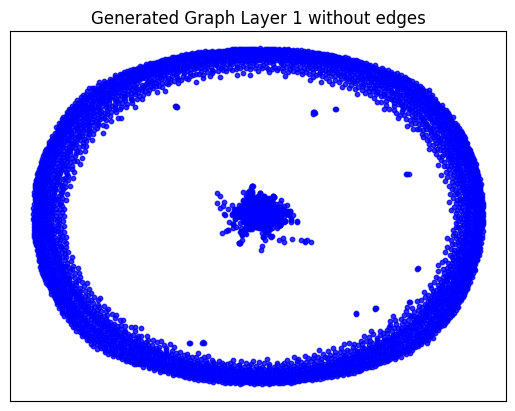

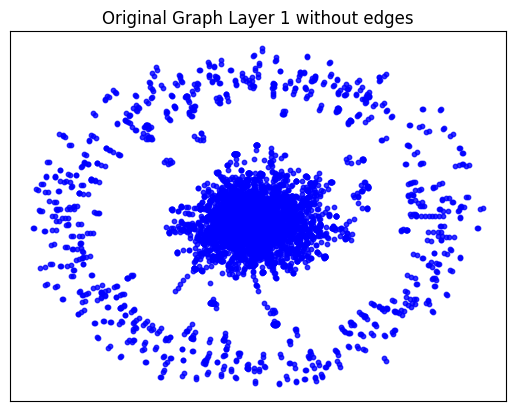

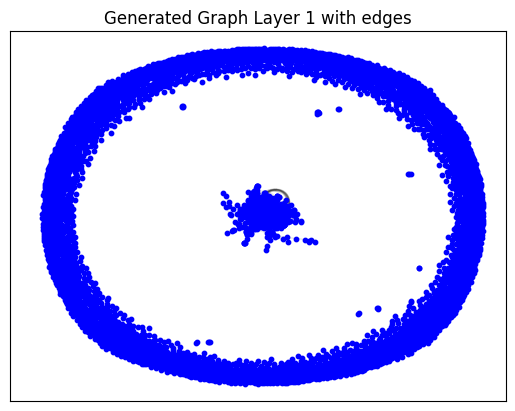

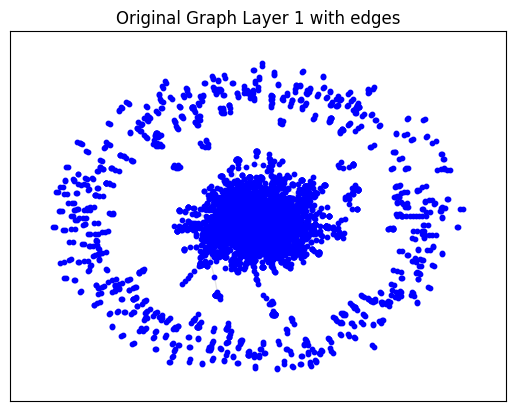

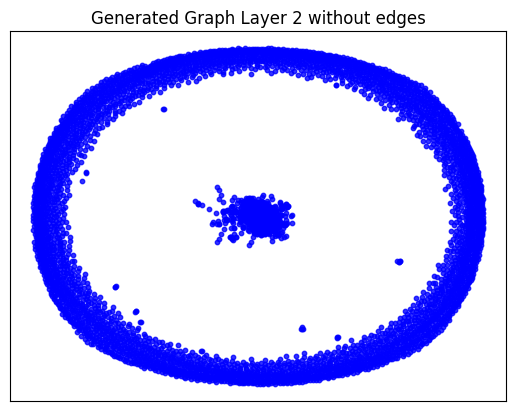

...

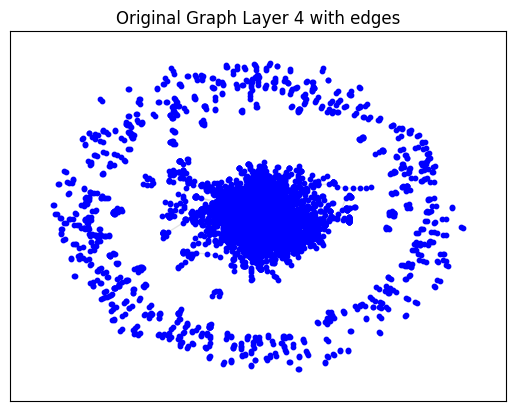

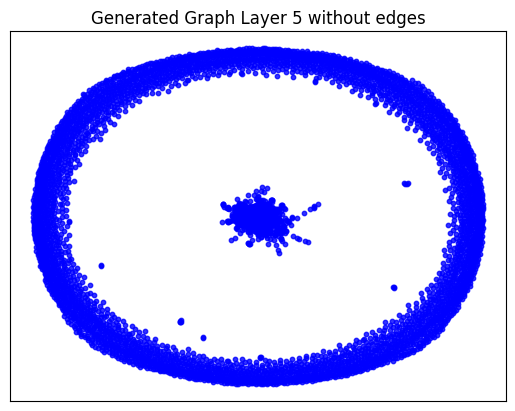

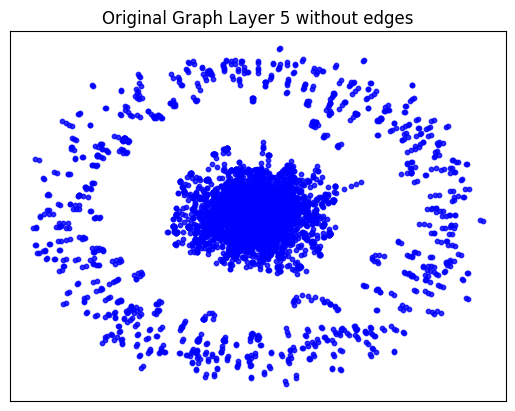

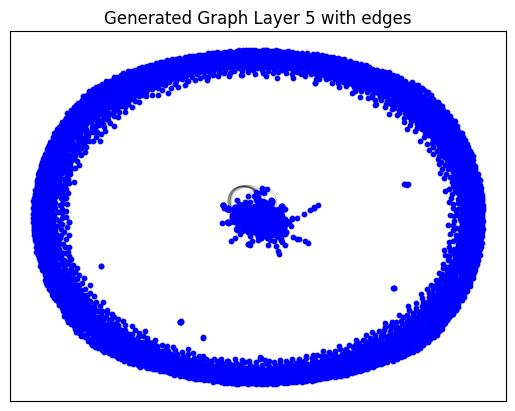

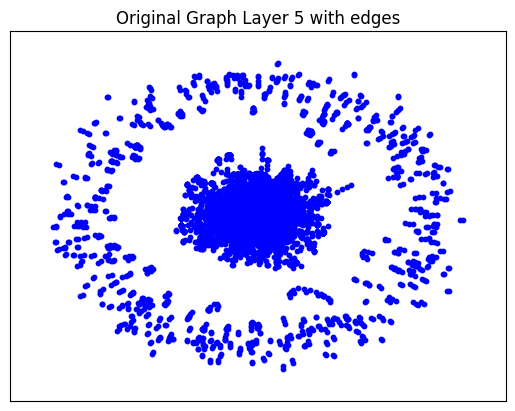

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_5.
Epoch 0 - Cost: 1.734731912612915, Accuracy: 0.4995763301849365
Epoch 1 - Cost: 1.720680594444275, Accuracy: 0.4998289942741394
Epoch 2 - Cost: 1.6987589597702026, Accuracy: 0.4999774694442749
Epoch 3 - Cost: 1.6888353824615479, Accuracy: 0.5001510977745056
Epoch 4 - Cost: 1.696363091468811, Accuracy: 0.499674916267395
Epoch 5 - Cost: 1.6681784391403198, Accuracy: 0.4998222887516022
Epoch 6 - Cost: 1.6425861120224, Accuracy: 0.5000783801078796
Epoch 7 - Cost: 1.5955805778503418, Accuracy: 0.4998677670955658
Epoch 8 - Cost: 1.6020981073379517, Accuracy: 0.4993691146373749
Epoch 9 - Cost: 1.5555864572525024, Accuracy: 0.49911436438560486
Epoch 10 - Cost: 1.5191595554351807, Accuracy: 0.49895384907722473
Epoch 11 - Cost: 1.4667208194732666, Accuracy: 0.49804168939590454
Epoch 12 - Cost: 1.445609211921692, Accuracy: 0.4970893859863281
Epoch 13 - Cost: 1.415

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15228509902954102 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05640292167663574 seconds to compute degree_assortativity_coefficient ---
--- 0.6714754104614258 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 172, 'd_min': 0, 'd': 1.250760121619459, 'LCC': 1321, 'wedge_count': 150197.0, 'claw_count': 4352797.0, 'triangle_count': 9178, 'power_law_exp': 2.2308587566328697, 'gini': 0.9358741615649293, 'rel_edge_distr_entropy': 0.6952006575325392, 'assortativity': -0.358935241343199, 'clustering_coefficient': 0.006325587892107075, 'n_components': 4929}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.580919874597103
KL divergence between original network and the network generated by Random E-R: 5.3439098829814435
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.5863494195909679
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.9557670229618838
KL divergence between original network and the network generated by Random E-R: 10.461473880651809
KL divergence between original network and the network generated by Random B-A: 2.033384407258823
KL divergence between original network and the network generated by GAE: 28.887282639033337


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Sixth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_6.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_6'
args.filename = 'pubmed_6_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_6'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.6354
Epoch: [ 2] time: 10.9667
Epoch: [ 3] time: 11.2970
Epoch: [ 4] time: 11.6278
Epoch: [ 5] time: 11.9589
Epoch: [ 6] time: 12.2904
Epoch: [ 7] time: 12.6206
Epoch: [ 8] time: 12.9514
Epoch: [ 9] time: 13.2830
Epoch: [10] time: 13.6159
Epoch: [11] time: 13.9468
Epoch: [12] time: 14.2769
Epoch: [13] time: 14.6068
Epoch: [14] time: 14.9366
Epoch: [15] time: 15.2664
Epoch: [16] time: 15.5967
Epoch: [17] time: 15.9270
Epoch: [18] time: 16.2569
Epoch: [19] time: 16.5875
Epoch: [20] time: 16.9173
Epoch: [21] time: 17.2475
Epoch: [22] time: 17.5776
Epoch: [23] time: 17.9075
Epoch: [24] time: 18.2385
Epoch: [25] time: 18.5684
Epoch: [26] time: 18.8982
Epoch: [27] time: 19.2282
Epoch: [28] time: 19.5583
Epoch: [29] time: 19.8891
Epoch: [30] time: 20.2198
Epoch: [31] time: 20.5501
Epoch: [32] time: 20.8808
Epoch: [33] time: 21.2113
Epoch: [34] time: 21.5424
Epoch: [35] time: 21.8728
Epoch: [36] time: 22.2034
Epoch: [37] time: 22.5344
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6131, 6131])
Shape of feature_tensor before unpooling: torch.Size([6131, 64])
Shapes in down_outs: [torch.Size([6131, 64]), torch.Size([5517, 64]), torch.Size([4413, 64])]
Shapes in indices_list: [torch.Size([5517]), torch.Size([4413]), torch.Size([3089])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6131, 64])
Shape of indices_list[0]: torch.Size([5517])
Shape of new_h before assignment: torch.Size([6131, 64])
Shape of h_subset: torch.Size([5517, 64])
Shape of idx: torch.Size([5517])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5517, 64])
Shape of indices_list[1]: torch.Size([4413])
Shape of new_h before assignment: torch.Size([6131, 64])
Shape of h_subset: torch.Size([4413, 64])
Shape of idx: torch.Size([4413])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4413, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.028825759887695312 seconds to compute statistics_degrees ---
--- 1.2597336769104004 seconds to compute statistics_LCC ---
--- 0.038797616958618164 seconds to compute statistics_wedge_count ---
--- 0.040280818939208984 seconds to compute statistics_claw_count ---
--- 0.23254776000976562 seconds to compute statistics_triangle_count ---
--- 0.030365467071533203 seconds to compute statistics_power_law_alpha ---
--- 0.029797792434692383 seconds to compute statistics_gini ---
--- 0.1440896987915039 seconds to compute statistics_edge_distribution_entropy ---
--- 0.054790496826171875 seconds to compute degree_assortativity_coefficient ---
--- 0.6263089179992676 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 74, 'd_min': 1, 'd': 2.3845024469820553, 'LCC': 5080, 'wedge_count': 62385.0, 'claw_count': 572252.0, 'triangle_count': 276, 'power_law_exp': 3.2183053218669566, 'gini'

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5118653774261475 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 159, 'd_min': 0, 'd': 2.3846655791190865, 'LCC': 2708, 'wedge_count': 202062.0, 'claw_count': 4754841.0, 'triangle_count': 906, 'power_law_exp': 1.7563262547710101, 'gini': 0.8645446841220359, 'rel_edge_distr_entropy': 0.7923477522489913, 'assortativity': -0.15705487217052513, 'clustering_coefficient': 0.0005716279471805681, 'n_components': 3408}
Computing metrics for ER graph
--- 0.02709364891052246 seconds to compute statistics_degrees ---
--- 1.7225322723388672 seconds to compute statistics_LCC ---
--- 0.028895139694213867 seconds to compute statistics_wedge_count ---
--- 0.029440879821777344 seconds to compute statistics_claw_count ---
--- 0.35349202156066895 seconds to compute statistics_triangle_count ---
--- 0.028811216354370117 seconds to compute statistics_power_law_alpha ---
--- 0.028544902801513672 seconds to compute statistic

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07386612892150879 seconds to compute degree_assortativity_coefficient ---
--- 0.8563756942749023 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.7690048939641105, 'LCC': 6056, 'wedge_count': 70051.0, 'claw_count': 112579.0, 'triangle_count': 23, 'power_law_exp': 1.686356712409529, 'gini': 0.25692751328343344, 'rel_edge_distr_entropy': 0.9870538759827026, 'assortativity': -0.013260910939935488, 'clustering_coefficient': 0.0006129029392693131, 'n_components': 71}
Computing metrics for bara graph
--- 0.026828765869140625 seconds to compute statistics_degrees ---
--- 2.078690528869629 seconds to compute statistics_LCC ---
--- 0.02954578399658203 seconds to compute statistics_wedge_count ---
--- 0.029528141021728516 seconds to compute statistics_claw_count ---
--- 30.715530157089233 seconds to compute statistics_triangle_count ---
--- 0.02927708625793457 seconds to compute statist

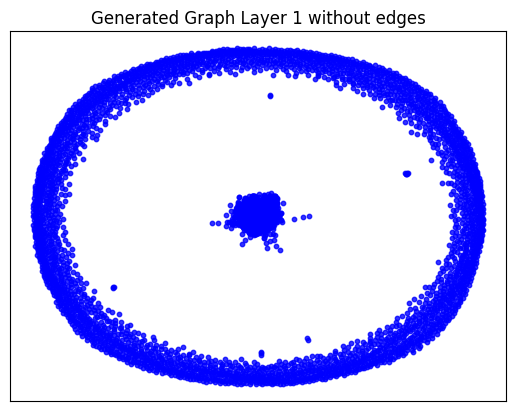

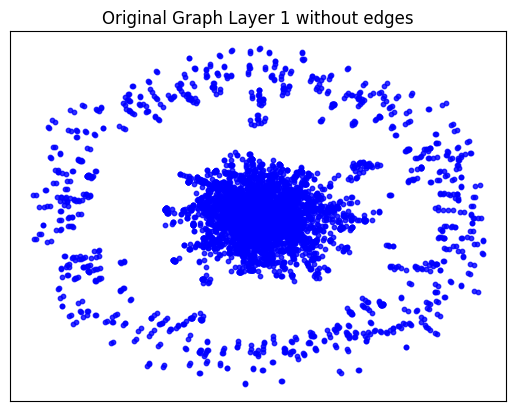

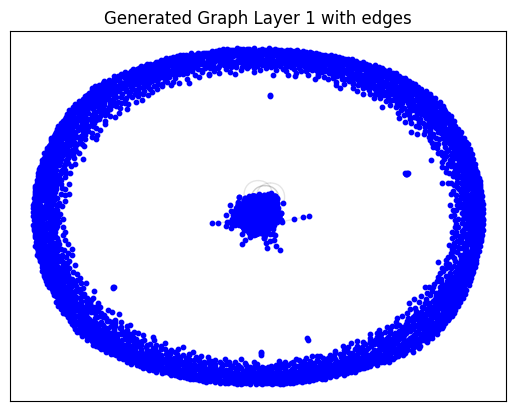

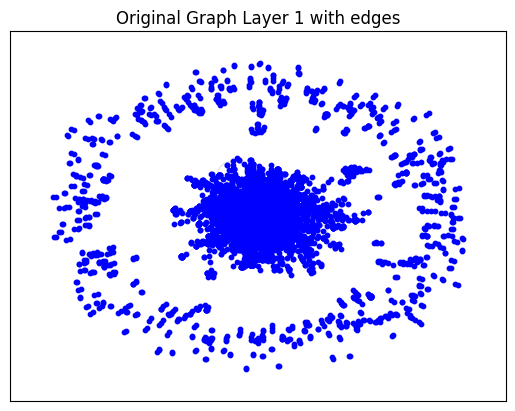

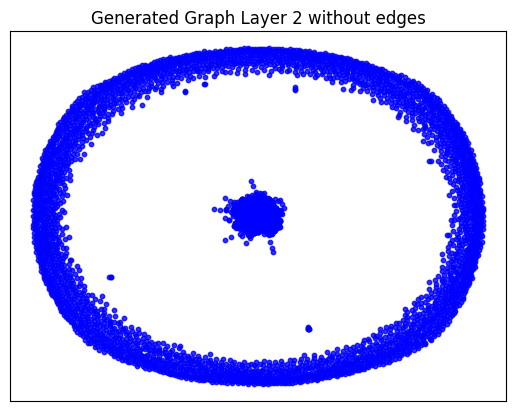

...

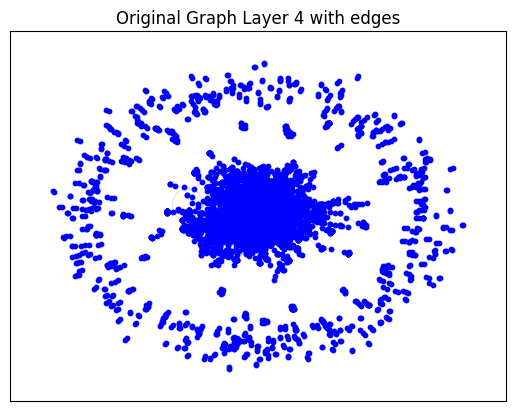

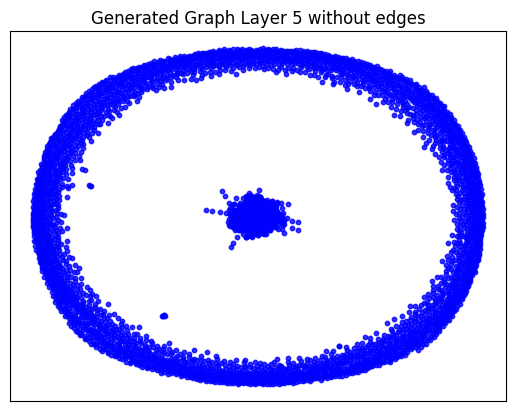

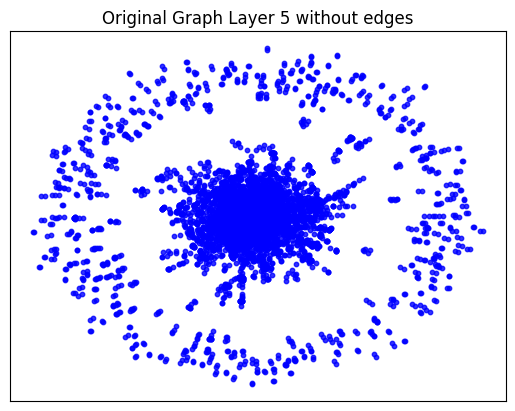

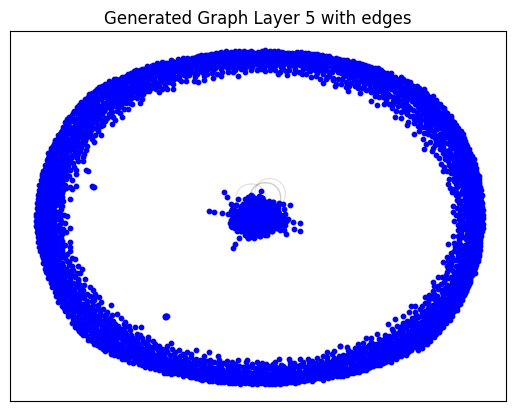

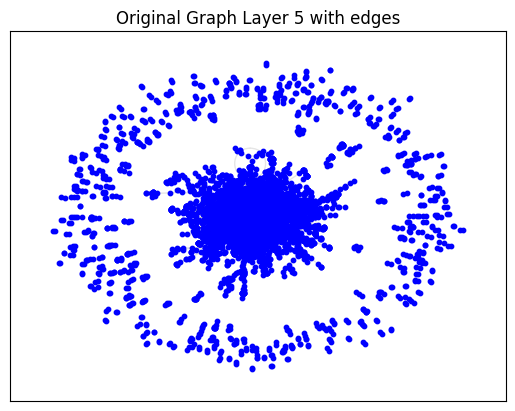

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_6.
Epoch 0 - Cost: 1.759606122970581, Accuracy: 0.5002733469009399
Epoch 1 - Cost: 1.7001290321350098, Accuracy: 0.5000448226928711
Epoch 2 - Cost: 1.7239445447921753, Accuracy: 0.49995753169059753
Epoch 3 - Cost: 1.6827054023742676, Accuracy: 0.49979662895202637
Epoch 4 - Cost: 1.6911847591400146, Accuracy: 0.49989402294158936
Epoch 5 - Cost: 1.6831014156341553, Accuracy: 0.49996593594551086
Epoch 6 - Cost: 1.6344590187072754, Accuracy: 0.5001266598701477
Epoch 7 - Cost: 1.6094087362289429, Accuracy: 0.4993632137775421
Epoch 8 - Cost: 1.5971592664718628, Accuracy: 0.4992946982383728
Epoch 9 - Cost: 1.5697439908981323, Accuracy: 0.498557984828949
Epoch 10 - Cost: 1.5243000984191895, Accuracy: 0.498905748128891
Epoch 11 - Cost: 1.490663766860962, Accuracy: 0.49812254309654236
Epoch 12 - Cost: 1.4573900699615479, Accuracy: 0.49667298793792725
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1436910629272461 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04958629608154297 seconds to compute degree_assortativity_coefficient ---
--- 0.6242713928222656 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 200, 'd_min': 0, 'd': 1.2433534496819443, 'LCC': 1047, 'wedge_count': 166791.0, 'claw_count': 5369965.0, 'triangle_count': 12643, 'power_law_exp': 2.0512511275283467, 'gini': 0.9477456143430847, 'rel_edge_distr_entropy': 0.6754242141862865, 'assortativity': -0.3172229283567363, 'clustering_coefficient': 0.007063174527208278, 'n_components': 5080}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.9384419011593668
KL divergence between original network and the network generated by Random E-R: 5.205409774840328
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.319782648249076
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.9278916345131192
KL divergence between original network and the network generated by Random E-R: 53.77972967086383
KL divergence between original network and the network generated by Random B-A: 2.042059219686231
KL divergence between original network and the network generated by GAE: 40.18481136403633


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Seventh batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_7.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_7'
args.filename = 'pubmed_7_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_7'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.6395
Epoch: [ 2] time: 10.9289
Epoch: [ 3] time: 11.2182
Epoch: [ 4] time: 11.5069
Epoch: [ 5] time: 11.7956
Epoch: [ 6] time: 12.0842
Epoch: [ 7] time: 12.3728
Epoch: [ 8] time: 12.6611
Epoch: [ 9] time: 12.9497
Epoch: [10] time: 13.2385
Epoch: [11] time: 13.5279
Epoch: [12] time: 13.8165
Epoch: [13] time: 14.1056
Epoch: [14] time: 14.3940
Epoch: [15] time: 14.6829
Epoch: [16] time: 14.9717
Epoch: [17] time: 15.2604
Epoch: [18] time: 15.5491
Epoch: [19] time: 15.8382
Epoch: [20] time: 16.1269
Epoch: [21] time: 16.4155
Epoch: [22] time: 16.7049
Epoch: [23] time: 16.9938
Epoch: [24] time: 17.2824
Epoch: [25] time: 17.5713
Epoch: [26] time: 17.8601
Epoch: [27] time: 18.1494
Epoch: [28] time: 18.4382
Epoch: [29] time: 18.7268
Epoch: [30] time: 19.0154
Epoch: [31] time: 19.3045
Epoch: [32] time: 19.5936
Epoch: [33] time: 19.8825
Epoch: [34] time: 20.1751
Epoch: [35] time: 20.4646
Epoch: [36] time: 20.7545
Epoch: [37] time: 21.0449
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5714, 5714])
Shape of feature_tensor before unpooling: torch.Size([5714, 64])
Shapes in down_outs: [torch.Size([5714, 64]), torch.Size([5142, 64]), torch.Size([4113, 64])]
Shapes in indices_list: [torch.Size([5142]), torch.Size([4113]), torch.Size([2879])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5714, 64])
Shape of indices_list[0]: torch.Size([5142])
Shape of new_h before assignment: torch.Size([5714, 64])
Shape of h_subset: torch.Size([5142, 64])
Shape of idx: torch.Size([5142])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5142, 64])
Shape of indices_list[1]: torch.Size([4113])
Shape of new_h before assignment: torch.Size([5714, 64])
Shape of h_subset: torch.Size([4113, 64])
Shape of idx: torch.Size([4113])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4113, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02662062644958496 seconds to compute statistics_degrees ---
--- 1.1841213703155518 seconds to compute statistics_LCC ---
--- 0.03706192970275879 seconds to compute statistics_wedge_count ---
--- 0.03819894790649414 seconds to compute statistics_claw_count ---
--- 0.20646953582763672 seconds to compute statistics_triangle_count ---
--- 0.027279138565063477 seconds to compute statistics_power_law_alpha ---
--- 0.027478456497192383 seconds to compute statistics_gini ---
--- 0.12715959548950195 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05409073829650879 seconds to compute degree_assortativity_coefficient ---
--- 0.5905139446258545 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 171, 'd_min': 1, 'd': 2.3980395589007526, 'LCC': 4687, 'wedge_count': 90231.0, 'claw_count': 2322979.0, 'triangle_count': 333, 'power_law_exp': 3.265572740743697, 'gini': 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.49259328842163086 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 201, 'd_min': 0, 'd': 2.398214598284614, 'LCC': 2237, 'wedge_count': 180002.0, 'claw_count': 4394477.0, 'triangle_count': 2489, 'power_law_exp': 1.7017240567760221, 'gini': 0.8722257084882272, 'rel_edge_distr_entropy': 0.7876485736084464, 'assortativity': -0.039189590495398906, 'clustering_coefficient': 0.0016991783095007666, 'n_components': 3450}
Computing metrics for ER graph
--- 0.0230715274810791 seconds to compute statistics_degrees ---
--- 1.3993875980377197 seconds to compute statistics_LCC ---
--- 0.02593207359313965 seconds to compute statistics_wedge_count ---
--- 0.02645587921142578 seconds to compute statistics_claw_count ---
--- 0.31650447845458984 seconds to compute statistics_triangle_count ---
--- 0.02571845054626465 seconds to compute statistics_power_law_alpha ---
--- 0.025119543075561523 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.06849098205566406 seconds to compute degree_assortativity_coefficient ---
--- 0.696239709854126 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.796079117801505, 'LCC': 5663, 'wedge_count': 65991.0, 'claw_count': 106255.0, 'triangle_count': 24, 'power_law_exp': 1.6857193982704426, 'gini': 0.25654301049853, 'rel_edge_distr_entropy': 0.9870623000455359, 'assortativity': -0.003535765000348493, 'clustering_coefficient': 0.000677615171050774, 'n_components': 51}
Computing metrics for bara graph
--- 0.02329421043395996 seconds to compute statistics_degrees ---
--- 1.8228187561035156 seconds to compute statistics_LCC ---
--- 0.02566838264465332 seconds to compute statistics_wedge_count ---
--- 0.0260922908782959 seconds to compute statistics_claw_count ---
--- 28.871354579925537 seconds to compute statistics_triangle_count ---
--- 0.026132583618164062 seconds to compute statistics_po

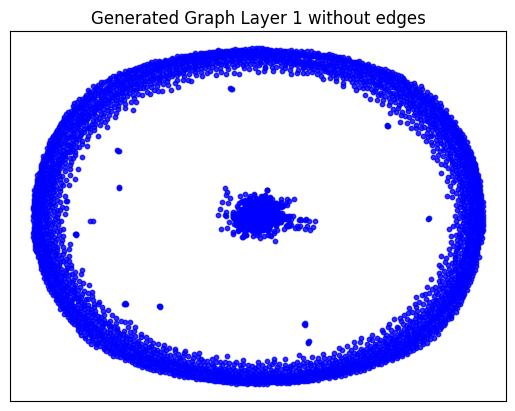

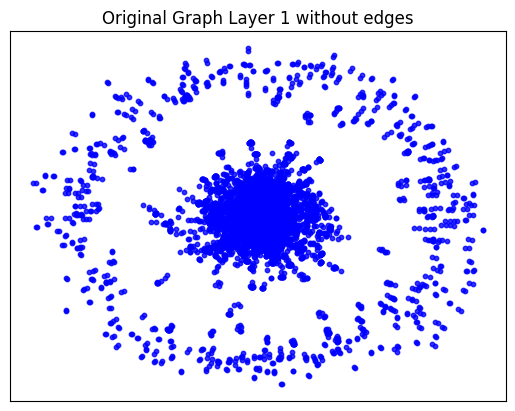

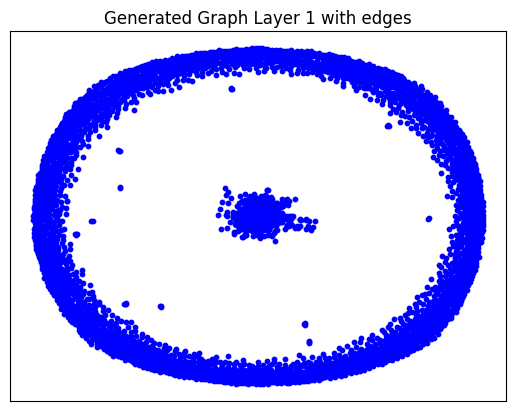

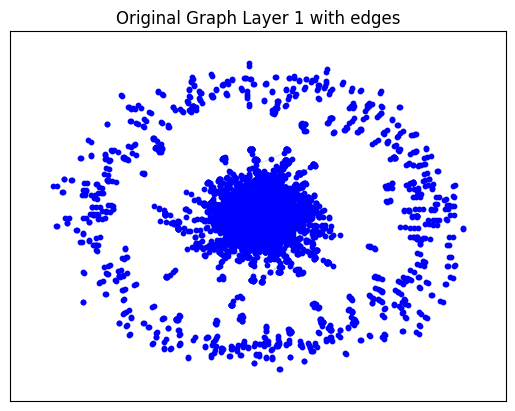

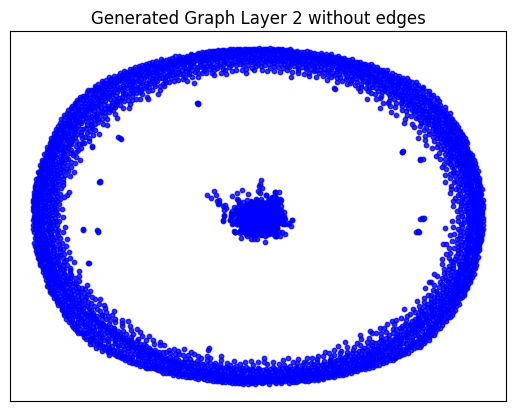

...

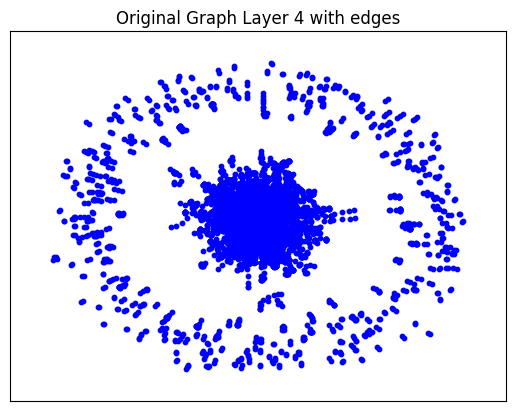

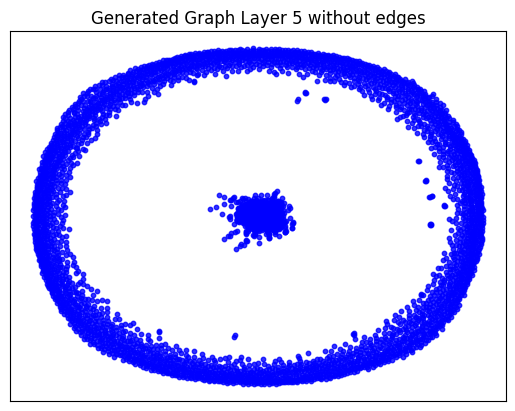

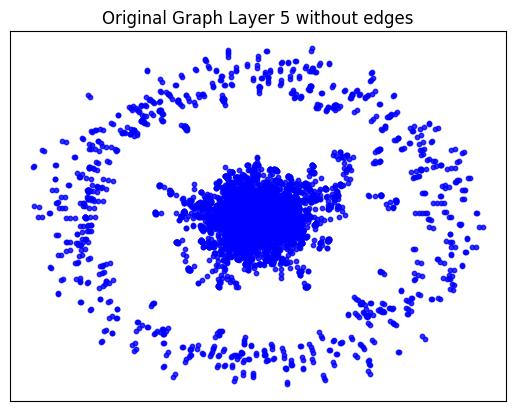

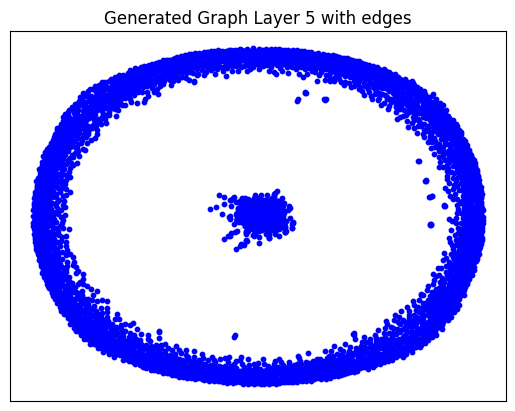

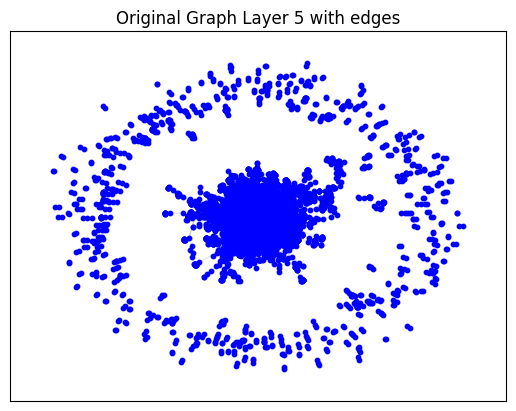

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_7.
Epoch 0 - Cost: 1.7147189378738403, Accuracy: 0.49976256489753723
Epoch 1 - Cost: 1.7146005630493164, Accuracy: 0.4998149573802948
Epoch 2 - Cost: 1.6900303363800049, Accuracy: 0.4999636709690094
Epoch 3 - Cost: 1.7085741758346558, Accuracy: 0.5000606179237366
Epoch 4 - Cost: 1.6604580879211426, Accuracy: 0.500048816204071
Epoch 5 - Cost: 1.6309503316879272, Accuracy: 0.49980196356773376
Epoch 6 - Cost: 1.6083582639694214, Accuracy: 0.49986162781715393
Epoch 7 - Cost: 1.5442841053009033, Accuracy: 0.498984694480896
Epoch 8 - Cost: 1.5401583909988403, Accuracy: 0.49893537163734436
Epoch 9 - Cost: 1.4756218194961548, Accuracy: 0.4982406497001648
Epoch 10 - Cost: 1.4429947137832642, Accuracy: 0.49858155846595764
Epoch 11 - Cost: 1.3862569332122803, Accuracy: 0.4969587028026581
Epoch 12 - Cost: 1.3231772184371948, Accuracy: 0.49362316727638245
Epoch 13 - Co

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.05376005172729492 seconds to compute degree_assortativity_coefficient ---
--- 0.5505125522613525 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 365, 'd_min': 0, 'd': 1.23871193559678, 'LCC': 1146, 'wedge_count': 245226.0, 'claw_count': 20767674.0, 'triangle_count': 6064, 'power_law_exp': 1.9846035357666802, 'gini': 0.9309372151286288, 'rel_edge_distr_entropy': 0.6843278953642433, 'assortativity': -0.30090380812615825, 'clustering_coefficient': 0.000875976770436593, 'n_components': 4568}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.5940691453075686
KL divergence between original network and the network generated by Random E-R: 6.421687292602892
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.02430447547230515
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.7155674905287506
KL divergence between original network and the network generated by Random E-R: 6.929604983799468
KL divergence between original network and the network generated by Random B-A: 1.9977160654443797
KL divergence between original network and the network generated by GAE: 29.2404272321439


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Eighth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_8.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_8'
args.filename = 'pubmed_8_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_8'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 11.5218
Epoch: [ 2] time: 11.8471
Epoch: [ 3] time: 12.1732
Epoch: [ 4] time: 12.4989
Epoch: [ 5] time: 12.8248
Epoch: [ 6] time: 13.1500
Epoch: [ 7] time: 13.4761
Epoch: [ 8] time: 13.8017
Epoch: [ 9] time: 14.1274
Epoch: [10] time: 14.4546
Epoch: [11] time: 14.7801
Epoch: [12] time: 15.1053
Epoch: [13] time: 15.4314
Epoch: [14] time: 15.7570
Epoch: [15] time: 16.0817
Epoch: [16] time: 16.4061
Epoch: [17] time: 16.7317
Epoch: [18] time: 17.0571
Epoch: [19] time: 17.3831
Epoch: [20] time: 17.7086
Epoch: [21] time: 18.0341
Epoch: [22] time: 18.3601
Epoch: [23] time: 18.6849
Epoch: [24] time: 19.0102
Epoch: [25] time: 19.3360
Epoch: [26] time: 19.6614
Epoch: [27] time: 19.9870
Epoch: [28] time: 20.3137
Epoch: [29] time: 20.6391
Epoch: [30] time: 20.9637
Epoch: [31] time: 21.2911
Epoch: [32] time: 21.6172
Epoch: [33] time: 21.9433
Epoch: [34] time: 22.2696
Epoch: [35] time: 22.5951
Epoch: [36] time: 22.9215
Epoch: [37] time: 23.2471
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6066, 6066])
Shape of feature_tensor before unpooling: torch.Size([6066, 64])
Shapes in down_outs: [torch.Size([6066, 64]), torch.Size([5459, 64]), torch.Size([4367, 64])]
Shapes in indices_list: [torch.Size([5459]), torch.Size([4367]), torch.Size([3056])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6066, 64])
Shape of indices_list[0]: torch.Size([5459])
Shape of new_h before assignment: torch.Size([6066, 64])
Shape of h_subset: torch.Size([5459, 64])
Shape of idx: torch.Size([5459])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5459, 64])
Shape of indices_list[1]: torch.Size([4367])
Shape of new_h before assignment: torch.Size([6066, 64])
Shape of h_subset: torch.Size([4367, 64])
Shape of idx: torch.Size([4367])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4367, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02948760986328125 seconds to compute statistics_degrees ---
--- 1.246887445449829 seconds to compute statistics_LCC ---
--- 0.04022860527038574 seconds to compute statistics_wedge_count ---
--- 0.04145216941833496 seconds to compute statistics_claw_count ---
--- 0.2257983684539795 seconds to compute statistics_triangle_count ---
--- 0.03029179573059082 seconds to compute statistics_power_law_alpha ---
--- 0.030443191528320312 seconds to compute statistics_gini ---
--- 0.14295244216918945 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05306386947631836 seconds to compute degree_assortativity_coefficient ---
--- 0.6205840110778809 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 130, 'd_min': 1, 'd': 2.2667765869744434, 'LCC': 4731, 'wedge_count': 57302.0, 'claw_count': 741223.0, 'triangle_count': 244, 'power_law_exp': 3.352070470682542, 'gini': 0.47

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5313582420349121 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 185, 'd_min': 0, 'd': 2.2674361088211046, 'LCC': 2304, 'wedge_count': 262711.0, 'claw_count': 7020161.0, 'triangle_count': 2072, 'power_law_exp': 1.700507617674969, 'gini': 0.9112740492636731, 'rel_edge_distr_entropy': 0.7449756974329071, 'assortativity': -0.26200309689451073, 'clustering_coefficient': 0.0008854497781461137, 'n_components': 3735}
Computing metrics for ER graph
--- 0.02695012092590332 seconds to compute statistics_degrees ---
--- 1.5994071960449219 seconds to compute statistics_LCC ---
--- 0.02990889549255371 seconds to compute statistics_wedge_count ---
--- 0.030626773834228516 seconds to compute statistics_claw_count ---
--- 0.34392261505126953 seconds to compute statistics_triangle_count ---
--- 0.02875375747680664 seconds to compute statistics_power_law_alpha ---
--- 0.028293132781982422 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07132077217102051 seconds to compute degree_assortativity_coefficient ---
--- 0.798060417175293 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.533553173948887, 'LCC': 5982, 'wedge_count': 62394.0, 'claw_count': 94594.0, 'triangle_count': 15, 'power_law_exp': 1.7116415744346831, 'gini': 0.261128267836485, 'rel_edge_distr_entropy': 0.9865699062116785, 'assortativity': 0.005899717356082492, 'clustering_coefficient': 0.00047571727593716305, 'n_components': 80}
Computing metrics for bara graph
--- 0.02704930305480957 seconds to compute statistics_degrees ---
--- 2.0510294437408447 seconds to compute statistics_LCC ---
--- 0.0290071964263916 seconds to compute statistics_wedge_count ---
--- 0.029718875885009766 seconds to compute statistics_claw_count ---
--- 32.85906147956848 seconds to compute statistics_triangle_count ---
--- 0.02927231788635254 seconds to compute statistics_po

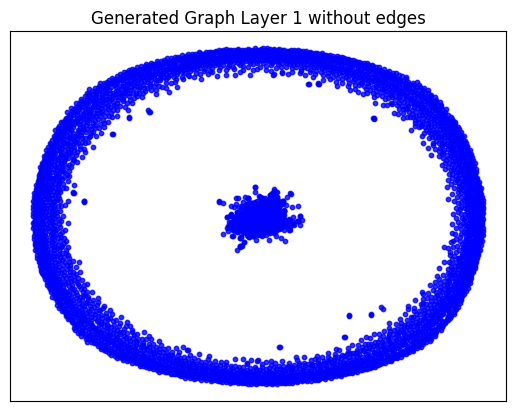

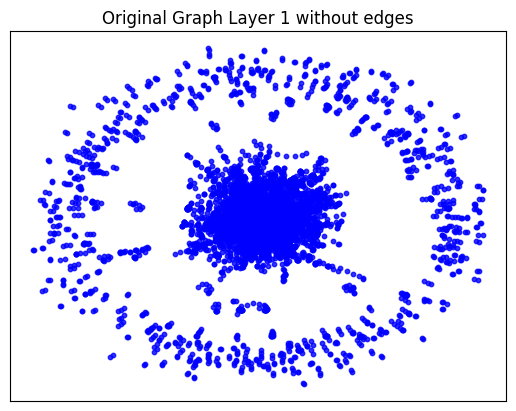

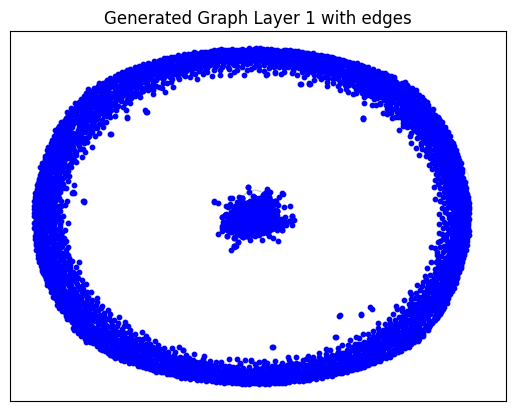

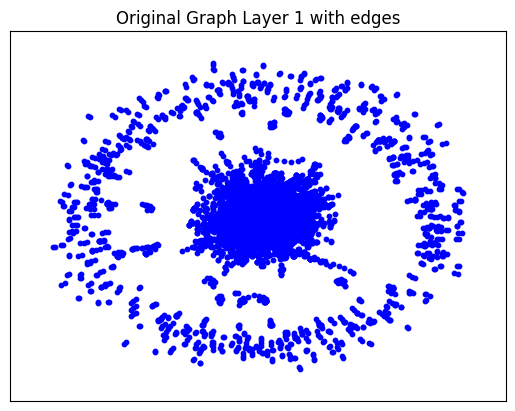

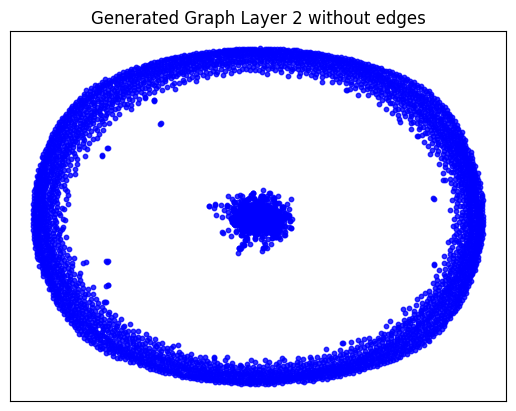

...

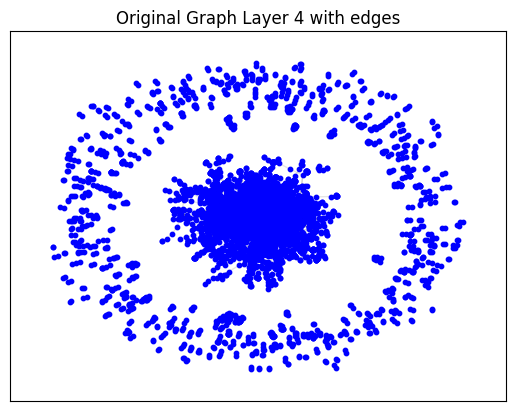

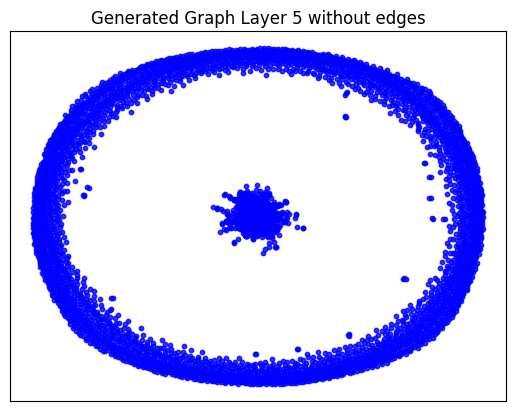

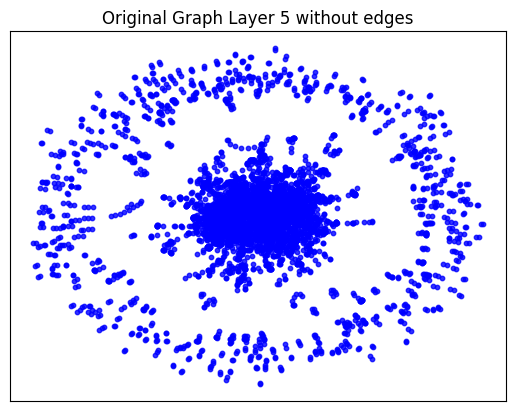

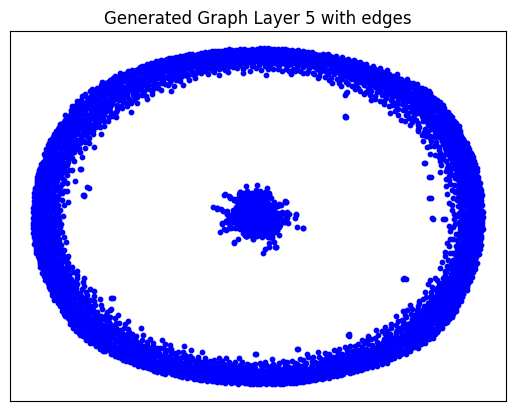

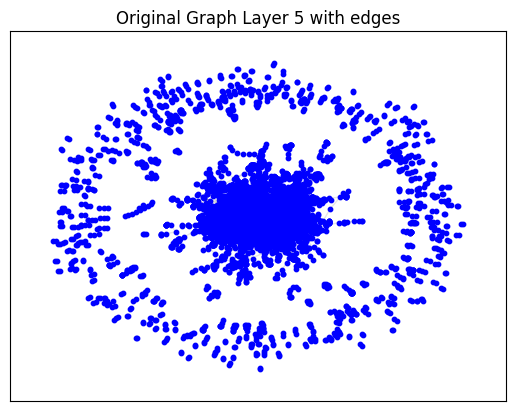

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_8.
Epoch 0 - Cost: 1.6888173818588257, Accuracy: 0.499688059091568
Epoch 1 - Cost: 1.7450286149978638, Accuracy: 0.4999299943447113
Epoch 2 - Cost: 1.6941314935684204, Accuracy: 0.49989739060401917
Epoch 3 - Cost: 1.6595032215118408, Accuracy: 0.49984434247016907
Epoch 4 - Cost: 1.699102520942688, Accuracy: 0.49945521354675293
Epoch 5 - Cost: 1.6768131256103516, Accuracy: 0.4998931884765625
Epoch 6 - Cost: 1.620754599571228, Accuracy: 0.4998193383216858
Epoch 7 - Cost: 1.5866930484771729, Accuracy: 0.49952104687690735
Epoch 8 - Cost: 1.5668553113937378, Accuracy: 0.49947428703308105
Epoch 9 - Cost: 1.5739938020706177, Accuracy: 0.4991110563278198
Epoch 10 - Cost: 1.4527233839035034, Accuracy: 0.49825242161750793
Epoch 11 - Cost: 1.465630292892456, Accuracy: 0.49774929881095886
Epoch 12 - Cost: 1.4338651895523071, Accuracy: 0.4976702630519867
Epoch 13 - Cos

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04921150207519531 seconds to compute degree_assortativity_coefficient ---
--- 0.6159849166870117 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 206, 'd_min': 0, 'd': 1.1795252225519288, 'LCC': 1318, 'wedge_count': 120942.0, 'claw_count': 3766586.0, 'triangle_count': 4973, 'power_law_exp': 2.2022945906367246, 'gini': 0.9276877939221095, 'rel_edge_distr_entropy': 0.7089461360573281, 'assortativity': -0.30797478649856436, 'clustering_coefficient': 0.003960881286130199, 'n_components': 4746}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.03951511065385815
KL divergence between original network and the network generated by Random E-R: 6.214766767160001
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.022513468292793e-07
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.2729678137346871
KL divergence between original network and the network generated by Random E-R: 2.947996663885646
KL divergence between original network and the network generated by Random B-A: 1.9669430587474885
KL divergence between original network and the network generated by GAE: 33.11428129572361


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Ninth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_9.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_9'
args.filename = 'pubmed_9_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_9'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.7739
Epoch: [ 2] time: 10.0873
Epoch: [ 3] time: 10.4004
Epoch: [ 4] time: 10.7137
Epoch: [ 5] time: 11.0265
Epoch: [ 6] time: 11.3393
Epoch: [ 7] time: 11.6523
Epoch: [ 8] time: 11.9650
Epoch: [ 9] time: 12.2778
Epoch: [10] time: 12.5905
Epoch: [11] time: 12.9038
Epoch: [12] time: 13.2173
Epoch: [13] time: 13.5306
Epoch: [14] time: 13.8442
Epoch: [15] time: 14.1572
Epoch: [16] time: 14.4704
Epoch: [17] time: 14.7834
Epoch: [18] time: 15.0972
Epoch: [19] time: 15.4108
Epoch: [20] time: 15.7249
Epoch: [21] time: 16.0383
Epoch: [22] time: 16.3518
Epoch: [23] time: 16.6656
Epoch: [24] time: 16.9796
Epoch: [25] time: 17.2944
Epoch: [26] time: 17.6098
Epoch: [27] time: 17.9248
Epoch: [28] time: 18.2385
Epoch: [29] time: 18.5522
Epoch: [30] time: 18.8670
Epoch: [31] time: 19.1807
Epoch: [32] time: 19.4936
Epoch: [33] time: 19.8066
Epoch: [34] time: 20.1199
Epoch: [35] time: 20.4334
Epoch: [36] time: 20.7464
Epoch: [37] time: 21.0598
Epoch: [38] t

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5936, 5936])
Shape of feature_tensor before unpooling: torch.Size([5936, 64])
Shapes in down_outs: [torch.Size([5936, 64]), torch.Size([5342, 64]), torch.Size([4273, 64])]
Shapes in indices_list: [torch.Size([5342]), torch.Size([4273]), torch.Size([2991])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5936, 64])
Shape of indices_list[0]: torch.Size([5342])
Shape of new_h before assignment: torch.Size([5936, 64])
Shape of h_subset: torch.Size([5342, 64])
Shape of idx: torch.Size([5342])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5342, 64])
Shape of indices_list[1]: torch.Size([4273])
Shape of new_h before assignment: torch.Size([5936, 64])
Shape of h_subset: torch.Size([4273, 64])
Shape of idx: torch.Size([4273])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4273, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.027184247970581055 seconds to compute statistics_degrees ---
--- 1.1770145893096924 seconds to compute statistics_LCC ---
--- 0.03792977333068848 seconds to compute statistics_wedge_count ---
--- 0.0386967658996582 seconds to compute statistics_claw_count ---
--- 0.21649718284606934 seconds to compute statistics_triangle_count ---
--- 0.029811382293701172 seconds to compute statistics_power_law_alpha ---
--- 0.029870986938476562 seconds to compute statistics_gini ---
--- 0.137345552444458 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0545656681060791 seconds to compute degree_assortativity_coefficient ---
--- 0.5865294933319092 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 88, 'd_min': 1, 'd': 2.318786857624263, 'LCC': 4666, 'wedge_count': 62653.0, 'claw_count': 678007.0, 'triangle_count': 255, 'power_law_exp': 3.3236412505818898, 'gini': 0.481

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.4821927547454834 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 499, 'd_min': 0, 'd': 2.318955349620893, 'LCC': 1899, 'wedge_count': 666736.0, 'claw_count': 53340109.0, 'triangle_count': 7188, 'power_law_exp': 1.7897952103343457, 'gini': 0.9442815710241268, 'rel_edge_distr_entropy': 0.6747230913228977, 'assortativity': -0.2432721734889202, 'clustering_coefficient': 0.000404273639560804, 'n_components': 4001}
Computing metrics for ER graph
--- 0.025325775146484375 seconds to compute statistics_degrees ---
--- 1.506589412689209 seconds to compute statistics_LCC ---
--- 0.02791452407836914 seconds to compute statistics_wedge_count ---
--- 0.027842044830322266 seconds to compute statistics_claw_count ---
--- 0.33574771881103516 seconds to compute statistics_triangle_count ---
--- 0.027106285095214844 seconds to compute statistics_power_law_alpha ---
--- 0.027136802673339844 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07051253318786621 seconds to compute degree_assortativity_coefficient ---
--- 0.7585225105285645 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.637573715248526, 'LCC': 5869, 'wedge_count': 63838.0, 'claw_count': 98526.0, 'triangle_count': 18, 'power_law_exp': 1.7014842286309393, 'gini': 0.25858527449491286, 'rel_edge_distr_entropy': 0.9868817130323172, 'assortativity': 0.005683271199863261, 'clustering_coefficient': 0.0005480786797393581, 'n_components': 64}
Computing metrics for bara graph
--- 0.025185346603393555 seconds to compute statistics_degrees ---
--- 1.94453763961792 seconds to compute statistics_LCC ---
--- 0.02751922607421875 seconds to compute statistics_wedge_count ---
--- 0.028250694274902344 seconds to compute statistics_claw_count ---
--- 30.034052848815918 seconds to compute statistics_triangle_count ---
--- 0.027412891387939453 seconds to compute statistic

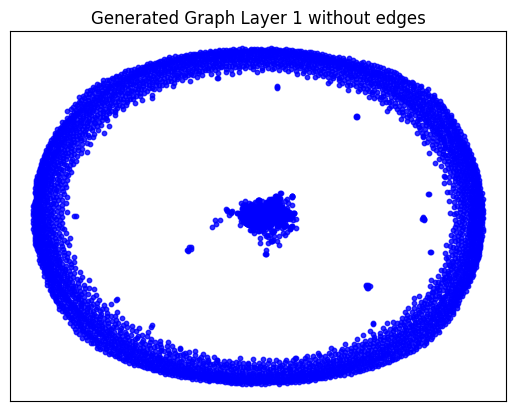

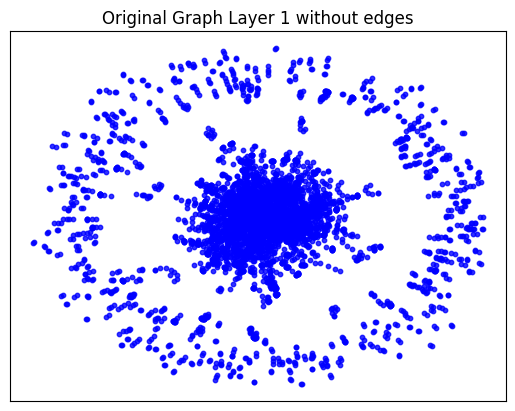

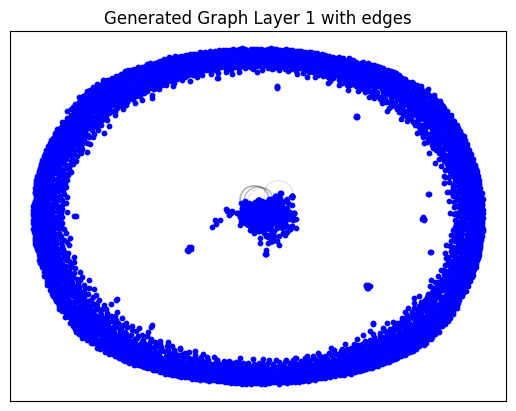

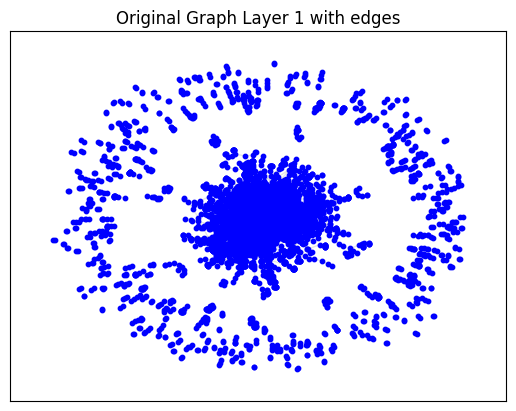

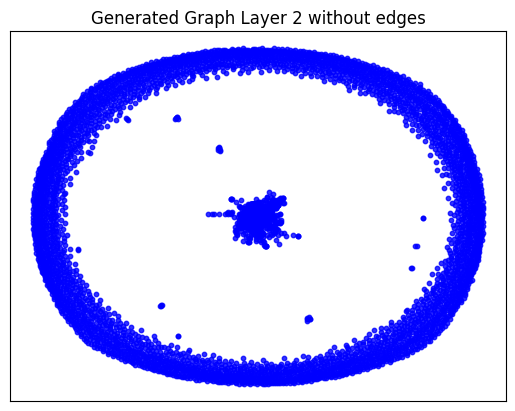

...

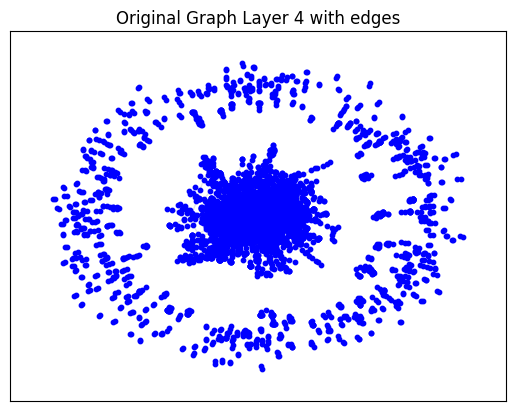

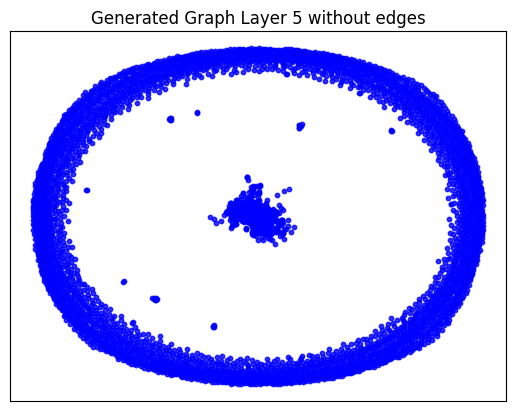

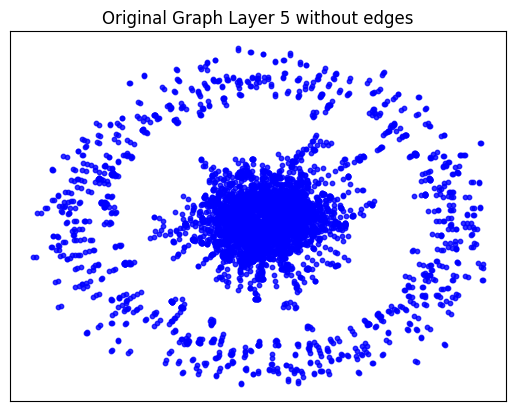

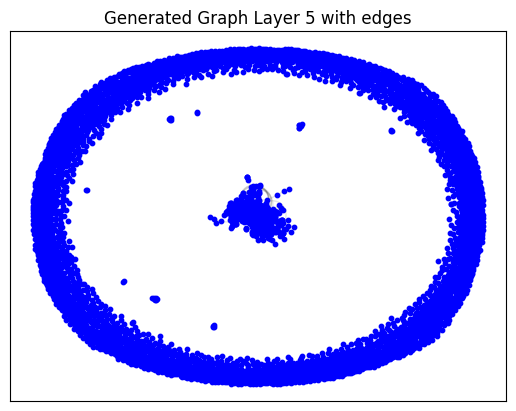

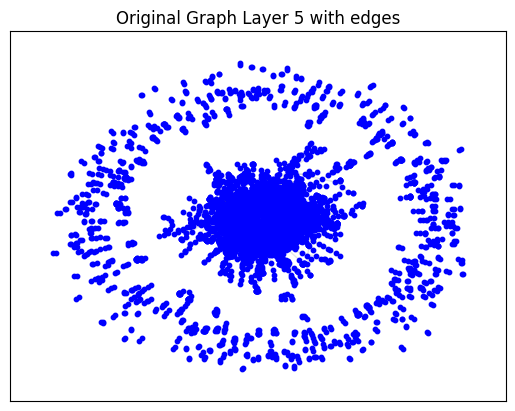

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_9.
Epoch 0 - Cost: 1.685871958732605, Accuracy: 0.5000656247138977
Epoch 1 - Cost: 1.7233946323394775, Accuracy: 0.4998094141483307
Epoch 2 - Cost: 1.6973227262496948, Accuracy: 0.5000463128089905
Epoch 3 - Cost: 1.6833606958389282, Accuracy: 0.4998861849308014
Epoch 4 - Cost: 1.7020477056503296, Accuracy: 0.49974560737609863
Epoch 5 - Cost: 1.6657317876815796, Accuracy: 0.49984976649284363
Epoch 6 - Cost: 1.6471089124679565, Accuracy: 0.4995996654033661
Epoch 7 - Cost: 1.5823285579681396, Accuracy: 0.49926653504371643
Epoch 8 - Cost: 1.5319719314575195, Accuracy: 0.4990237355232239
Epoch 9 - Cost: 1.548900842666626, Accuracy: 0.4979255795478821
Epoch 10 - Cost: 1.4842572212219238, Accuracy: 0.4987524151802063
Epoch 11 - Cost: 1.4747833013534546, Accuracy: 0.497652530670166
Epoch 12 - Cost: 1.3825124502182007, Accuracy: 0.49720796942710876
Epoch 13 - Cost:

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04693961143493652 seconds to compute degree_assortativity_coefficient ---
--- 0.5858170986175537 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 234, 'd_min': 0, 'd': 1.1987870619946093, 'LCC': 1070, 'wedge_count': 184274.0, 'claw_count': 8801087.0, 'triangle_count': 8004, 'power_law_exp': 2.0057820606312795, 'gini': 0.9428168309068514, 'rel_edge_distr_entropy': 0.6764149643789981, 'assortativity': -0.35123810631296415, 'clustering_coefficient': 0.0027282993566590127, 'n_components': 4867}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 3.448121765860726
KL divergence between original network and the network generated by Random E-R: 6.27356259945888
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.07168720227322091
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.04512106229799968
KL divergence between original network and the network generated by Random E-R: 3.651234895469554
KL divergence between original network and the network generated by Random B-A: 1.8415080711344076
KL divergence between original network and the network generated by GAE: 43.621163624420944


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

10 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_10.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_10'
args.filename = 'pubmed_10_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_10'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.0946
Epoch: [ 2] time: 10.2654
Epoch: [ 3] time: 10.4369
Epoch: [ 4] time: 10.6077
Epoch: [ 5] time: 10.7777
Epoch: [ 6] time: 10.9480
Epoch: [ 7] time: 11.1181
Epoch: [ 8] time: 11.2891
Epoch: [ 9] time: 11.4604
Epoch: [10] time: 11.6309
Epoch: [11] time: 11.8004
Epoch: [12] time: 11.9706
Epoch: [13] time: 12.1417
Epoch: [14] time: 12.3118
Epoch: [15] time: 12.4813
Epoch: [16] time: 12.6511
Epoch: [17] time: 12.8222
Epoch: [18] time: 12.9923
Epoch: [19] time: 13.1634
Epoch: [20] time: 13.3342
Epoch: [21] time: 13.5045
Epoch: [22] time: 13.6742
Epoch: [23] time: 13.8468
Epoch: [24] time: 14.0168
Epoch: [25] time: 14.1877
Epoch: [26] time: 14.3594
Epoch: [27] time: 14.5305
Epoch: [28] time: 14.7019
Epoch: [29] time: 14.8728
Epoch: [30] time: 15.0441
Epoch: [31] time: 15.2154
Epoch: [32] time: 15.3864
Epoch: [33] time: 15.5571
Epoch: [34] time: 15.7278
Epoch: [35] time: 15.8978
Epoch: [36] time: 16.0702
Epoch: [37] time: 16.2426
Epoch: [38] 

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5919, 5919])
Shape of feature_tensor before unpooling: torch.Size([5919, 64])
Shapes in down_outs: [torch.Size([5919, 64]), torch.Size([5327, 64]), torch.Size([4261, 64])]
Shapes in indices_list: [torch.Size([5327]), torch.Size([4261]), torch.Size([2982])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5919, 64])
Shape of indices_list[0]: torch.Size([5327])
Shape of new_h before assignment: torch.Size([5919, 64])
Shape of h_subset: torch.Size([5327, 64])
Shape of idx: torch.Size([5327])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5327, 64])
Shape of indices_list[1]: torch.Size([4261])
Shape of new_h before assignment: torch.Size([5919, 64])
Shape of h_subset: torch.Size([4261, 64])
Shape of idx: torch.Size([4261])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4261, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.026645898818969727 seconds to compute statistics_degrees ---
--- 1.1808884143829346 seconds to compute statistics_LCC ---
--- 0.03769683837890625 seconds to compute statistics_wedge_count ---
--- 0.03900742530822754 seconds to compute statistics_claw_count ---
--- 0.21871042251586914 seconds to compute statistics_triangle_count ---
--- 0.027263164520263672 seconds to compute statistics_power_law_alpha ---
--- 0.02750372886657715 seconds to compute statistics_gini ---
--- 0.1327531337738037 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05545616149902344 seconds to compute degree_assortativity_coefficient ---
--- 0.5848996639251709 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 68, 'd_min': 1, 'd': 2.314295370057452, 'LCC': 4870, 'wedge_count': 54376.0, 'claw_count': 471800.0, 'triangle_count': 207, 'power_law_exp': 3.3106266630472776, 'gini': 0.4

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.47777748107910156 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 82, 'd_min': 0, 'd': 2.3176748901655966, 'LCC': 2488, 'wedge_count': 152020.0, 'claw_count': 2048035.0, 'triangle_count': 3794, 'power_law_exp': 1.790928101563914, 'gini': 0.8712164823601172, 'rel_edge_distr_entropy': 0.7919803972206817, 'assortativity': -0.03132031915310211, 'clustering_coefficient': 0.005557522210313789, 'n_components': 3410}
Computing metrics for ER graph
--- 0.024710416793823242 seconds to compute statistics_degrees ---
--- 1.6599524021148682 seconds to compute statistics_LCC ---
--- 0.02718830108642578 seconds to compute statistics_wedge_count ---
--- 0.02783489227294922 seconds to compute statistics_claw_count ---
--- 0.3351175785064697 seconds to compute statistics_triangle_count ---
--- 0.02706742286682129 seconds to compute statistics_power_law_alpha ---
--- 0.026690244674682617 seconds to compute statistics_gi

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07048892974853516 seconds to compute degree_assortativity_coefficient ---
--- 0.8233270645141602 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 16.0, 'd_min': 0.0, 'd': 4.628590740114904, 'LCC': 5860, 'wedge_count': 63641.0, 'claw_count': 99219.0, 'triangle_count': 10, 'power_law_exp': 1.7034601378501242, 'gini': 0.260222961963817, 'rel_edge_distr_entropy': 0.9867452871159837, 'assortativity': -0.0003155081875461164, 'clustering_coefficient': 0.0003023614428688054, 'n_components': 58}
Computing metrics for bara graph
--- 0.025432825088500977 seconds to compute statistics_degrees ---
--- 1.9338562488555908 seconds to compute statistics_LCC ---
--- 0.027239561080932617 seconds to compute statistics_wedge_count ---
--- 0.028165578842163086 seconds to compute statistics_claw_count ---
--- 29.965118646621704 seconds to compute statistics_triangle_count ---
--- 0.027196407318115234 seconds to compute statis

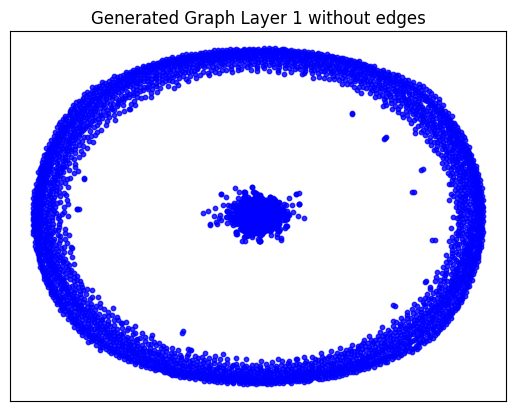

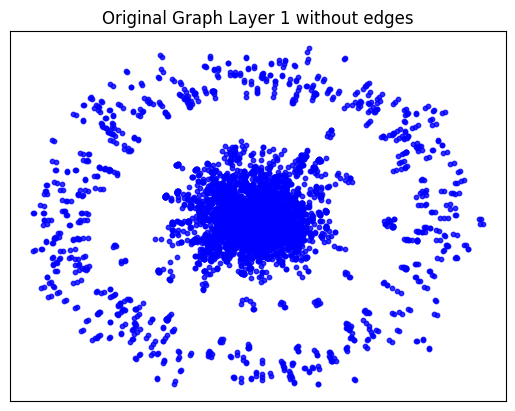

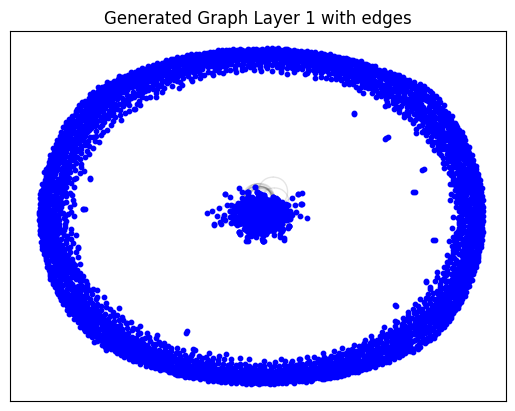

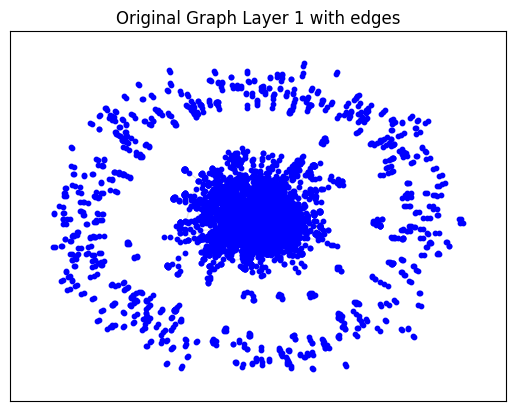

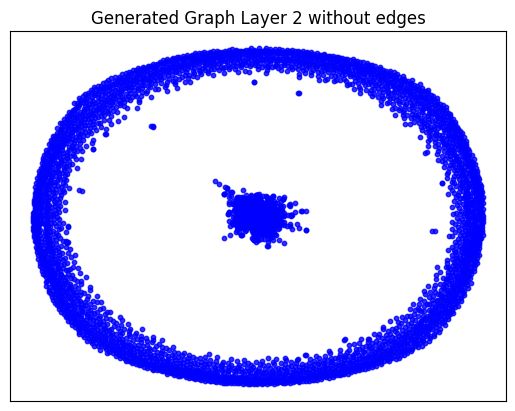

...

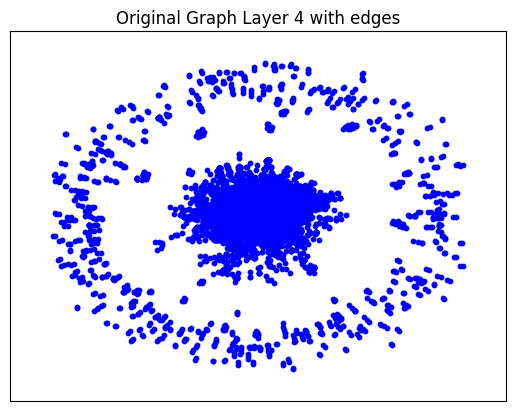

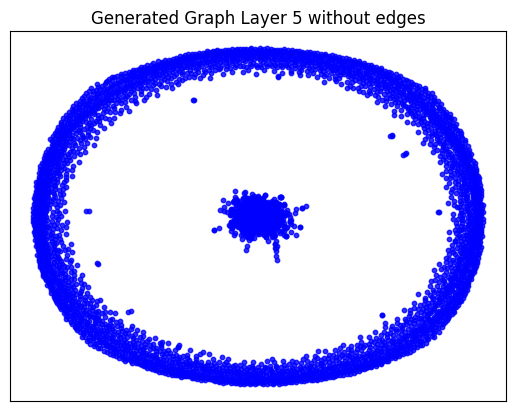

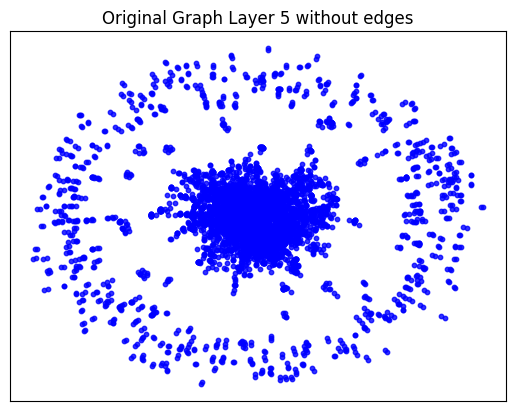

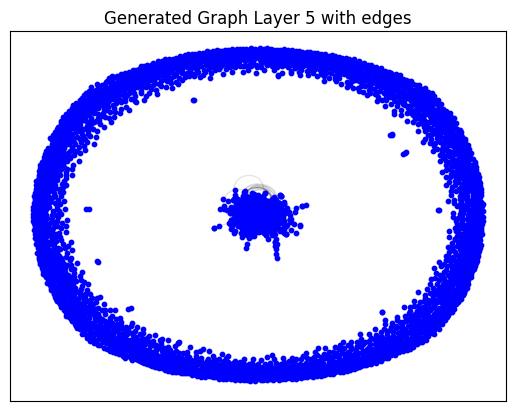

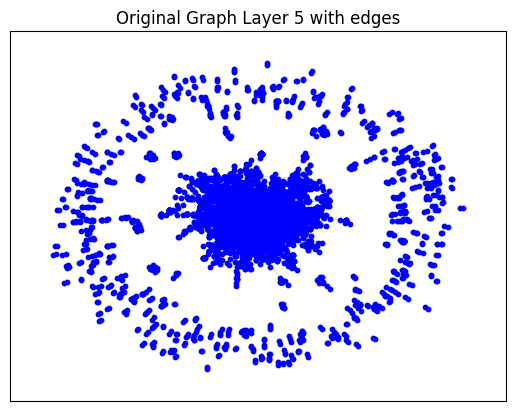

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_10.
Epoch 0 - Cost: 1.7825216054916382, Accuracy: 0.5000157356262207
Epoch 1 - Cost: 1.7465065717697144, Accuracy: 0.5003288388252258
Epoch 2 - Cost: 1.7614755630493164, Accuracy: 0.49956396222114563
Epoch 3 - Cost: 1.6508665084838867, Accuracy: 0.5001380443572998
Epoch 4 - Cost: 1.6674047708511353, Accuracy: 0.5000688433647156
Epoch 5 - Cost: 1.6408941745758057, Accuracy: 0.49985843896865845
Epoch 6 - Cost: 1.5952166318893433, Accuracy: 0.49985021352767944
Epoch 7 - Cost: 1.6442493200302124, Accuracy: 0.4995019733905792
Epoch 8 - Cost: 1.5830097198486328, Accuracy: 0.49946269392967224
Epoch 9 - Cost: 1.538310170173645, Accuracy: 0.49978089332580566
Epoch 10 - Cost: 1.503585696220398, Accuracy: 0.49928003549575806
Epoch 11 - Cost: 1.4761985540390015, Accuracy: 0.49889013171195984
Epoch 12 - Cost: 1.4678596258163452, Accuracy: 0.4993382394313812
Epoch 13 - 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.052490949630737305 seconds to compute degree_assortativity_coefficient ---
--- 0.5861220359802246 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 166, 'd_min': 0, 'd': 1.2025680013515796, 'LCC': 871, 'wedge_count': 137476.0, 'claw_count': 3575193.0, 'triangle_count': 11112, 'power_law_exp': 1.9171467781739198, 'gini': 0.9530489367062254, 'rel_edge_distr_entropy': 0.6697144277089372, 'assortativity': -0.3565190674323318, 'clustering_coefficient': 0.009324251865563621, 'n_components': 5039}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.33001635406403956
KL divergence between original network and the network generated by Random E-R: 5.033596493532427
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.4169639996783103
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.251291789884639
KL divergence between original network and the network generated by Random E-R: 3.946791802338172
KL divergence between original network and the network generated by Random B-A: 1.9801732829909735
KL divergence between original network and the network generated by GAE: 39.27142058876304


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

11 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_11.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_11'
args.filename = 'pubmed_11_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_11'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.9234
Epoch: [ 2] time: 10.2493
Epoch: [ 3] time: 10.5758
Epoch: [ 4] time: 10.9009
Epoch: [ 5] time: 11.2279
Epoch: [ 6] time: 11.5535
Epoch: [ 7] time: 11.8779
Epoch: [ 8] time: 12.2031
Epoch: [ 9] time: 12.5288
Epoch: [10] time: 12.8538
Epoch: [11] time: 13.1791
Epoch: [12] time: 13.5051
Epoch: [13] time: 13.8301
Epoch: [14] time: 14.1555
Epoch: [15] time: 14.4817
Epoch: [16] time: 14.8074
Epoch: [17] time: 15.1323
Epoch: [18] time: 15.4566
Epoch: [19] time: 15.7813
Epoch: [20] time: 16.1055
Epoch: [21] time: 16.4306
Epoch: [22] time: 16.7559
Epoch: [23] time: 17.0795
Epoch: [24] time: 17.4049
Epoch: [25] time: 17.7296
Epoch: [26] time: 18.0542
Epoch: [27] time: 18.3792
Epoch: [28] time: 18.7038
Epoch: [29] time: 19.0275
Epoch: [30] time: 19.3513
Epoch: [31] time: 19.6775
Epoch: [32] time: 20.0021
Epoch: [33] time: 20.3270
Epoch: [34] time: 20.6513
Epoch: [35] time: 20.9756
Epoch: [36] time: 21.3060
Epoch: [37] time: 21.6317
Epoch: [38] t

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6030, 6030])
Shape of feature_tensor before unpooling: torch.Size([6030, 64])
Shapes in down_outs: [torch.Size([6030, 64]), torch.Size([5427, 64]), torch.Size([4341, 64])]
Shapes in indices_list: [torch.Size([5427]), torch.Size([4341]), torch.Size([3038])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6030, 64])
Shape of indices_list[0]: torch.Size([5427])
Shape of new_h before assignment: torch.Size([6030, 64])
Shape of h_subset: torch.Size([5427, 64])
Shape of idx: torch.Size([5427])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5427, 64])
Shape of indices_list[1]: torch.Size([4341])
Shape of new_h before assignment: torch.Size([6030, 64])
Shape of h_subset: torch.Size([4341, 64])
Shape of idx: torch.Size([4341])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4341, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.028395414352416992 seconds to compute statistics_degrees ---
--- 1.214137315750122 seconds to compute statistics_LCC ---
--- 0.03862619400024414 seconds to compute statistics_wedge_count ---
--- 0.039986610412597656 seconds to compute statistics_claw_count ---
--- 0.22105789184570312 seconds to compute statistics_triangle_count ---
--- 0.029388427734375 seconds to compute statistics_power_law_alpha ---
--- 0.030110836029052734 seconds to compute statistics_gini ---
--- 0.13948583602905273 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05423307418823242 seconds to compute degree_assortativity_coefficient ---
--- 0.6066713333129883 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 69, 'd_min': 1, 'd': 2.27301376679383, 'LCC': 4751, 'wedge_count': 53338.0, 'claw_count': 474398.0, 'triangle_count': 211, 'power_law_exp': 3.3312306128720413, 'gini': 0.47

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.49410414695739746 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 95, 'd_min': 0, 'd': 2.2731796317797315, 'LCC': 1847, 'wedge_count': 182484.0, 'claw_count': 2672786.0, 'triangle_count': 11339, 'power_law_exp': 1.6183401121389624, 'gini': 0.9091263078508598, 'rel_edge_distr_entropy': 0.7560570318817695, 'assortativity': -0.1530866808666229, 'clustering_coefficient': 0.01272716932818415, 'n_components': 4142}
Computing metrics for ER graph
--- 0.02597355842590332 seconds to compute statistics_degrees ---
--- 1.5660929679870605 seconds to compute statistics_LCC ---
--- 0.028368234634399414 seconds to compute statistics_wedge_count ---
--- 0.028948068618774414 seconds to compute statistics_claw_count ---
--- 0.3405344486236572 seconds to compute statistics_triangle_count ---
--- 0.028388023376464844 seconds to compute statistics_power_law_alpha ---
--- 0.027728796005249023 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0705411434173584 seconds to compute degree_assortativity_coefficient ---
--- 0.7858233451843262 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 17.0, 'd_min': 0.0, 'd': 4.54602753358766, 'LCC': 5968, 'wedge_count': 62281.0, 'claw_count': 94723.0, 'triangle_count': 14, 'power_law_exp': 1.7123087866584208, 'gini': 0.2597895320506247, 'rel_edge_distr_entropy': 0.986767110387774, 'assortativity': 0.01023003016366289, 'clustering_coefficient': 0.00044339811872512485, 'n_components': 61}
Computing metrics for bara graph
--- 0.025867462158203125 seconds to compute statistics_degrees ---
--- 1.9999923706054688 seconds to compute statistics_LCC ---
--- 0.02838420867919922 seconds to compute statistics_wedge_count ---
--- 0.029552221298217773 seconds to compute statistics_claw_count ---
--- 30.724706888198853 seconds to compute statistics_triangle_count ---
--- 0.028358936309814453 seconds to compute statistics_

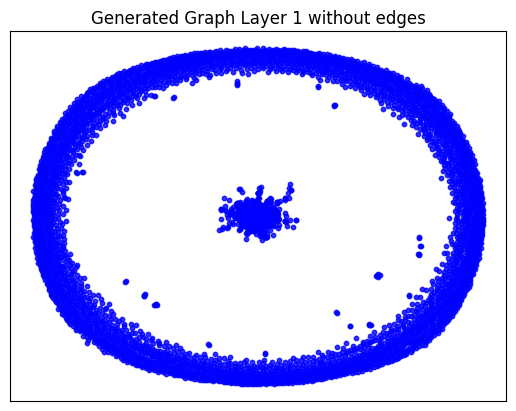

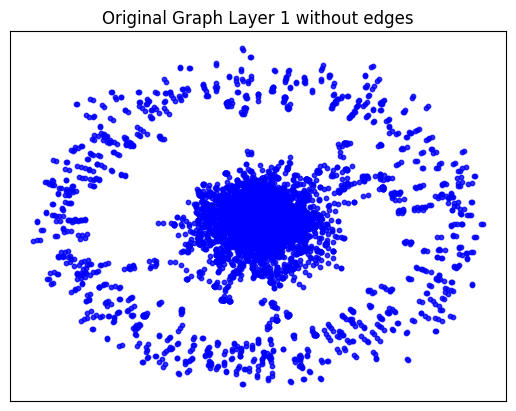

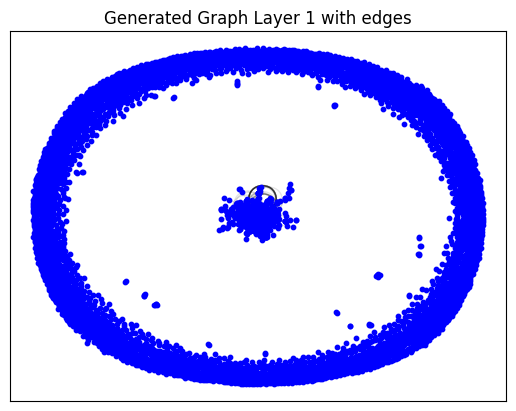

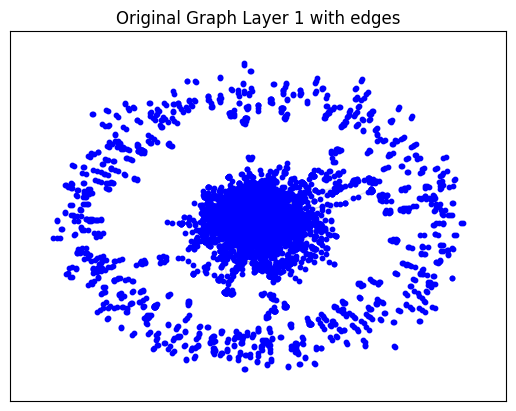

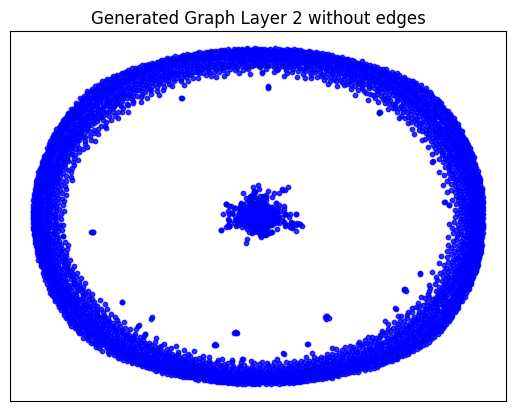

...

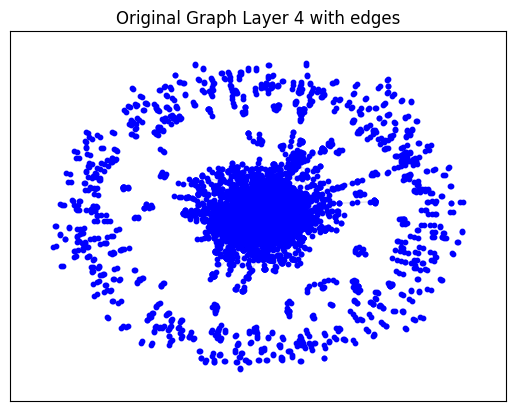

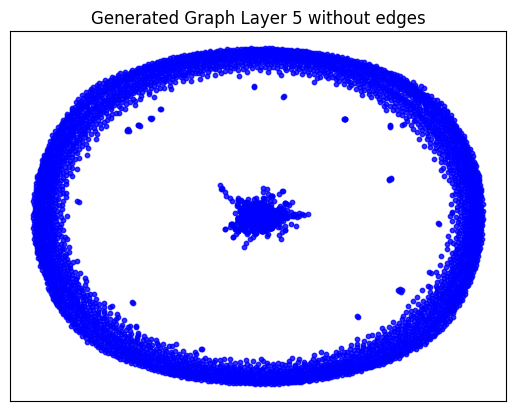

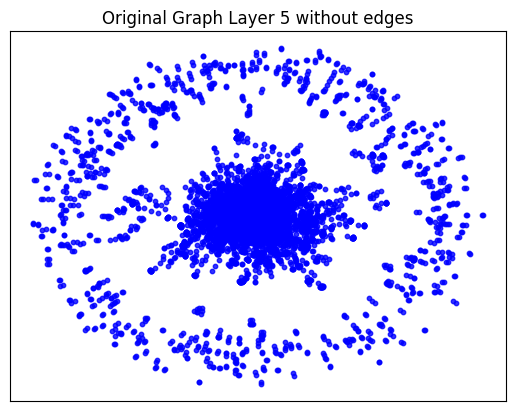

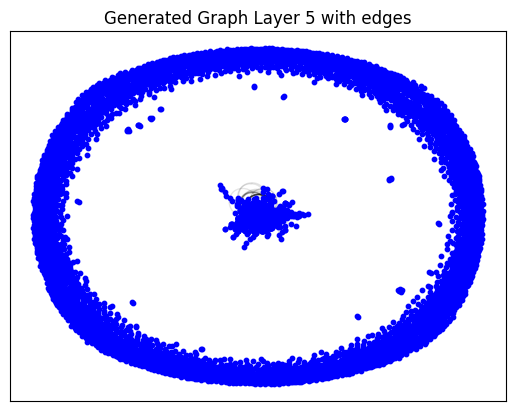

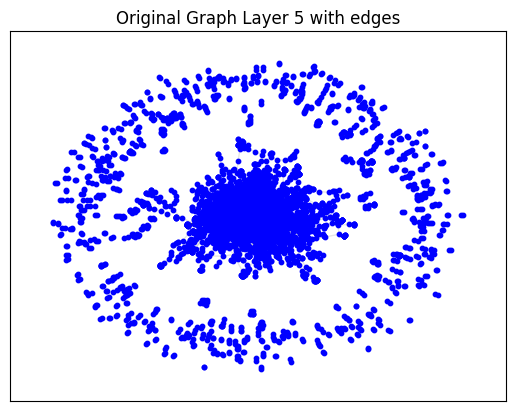

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_11.
Epoch 0 - Cost: 1.7334781885147095, Accuracy: 0.5001765489578247
Epoch 1 - Cost: 1.715218424797058, Accuracy: 0.4998694658279419
Epoch 2 - Cost: 1.717099666595459, Accuracy: 0.49981409311294556
Epoch 3 - Cost: 1.6629178524017334, Accuracy: 0.5000373125076294
Epoch 4 - Cost: 1.675560712814331, Accuracy: 0.500001072883606
Epoch 5 - Cost: 1.6804249286651611, Accuracy: 0.49957722425460815
Epoch 6 - Cost: 1.6284719705581665, Accuracy: 0.49977636337280273
Epoch 7 - Cost: 1.6050209999084473, Accuracy: 0.49993327260017395
Epoch 8 - Cost: 1.564860463142395, Accuracy: 0.49914655089378357
Epoch 9 - Cost: 1.5712933540344238, Accuracy: 0.4996238350868225
Epoch 10 - Cost: 1.4836599826812744, Accuracy: 0.49900397658348083
Epoch 11 - Cost: 1.4600114822387695, Accuracy: 0.4997206926345825
Epoch 12 - Cost: 1.5391793251037598, Accuracy: 0.4990518391132355
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04780864715576172 seconds to compute degree_assortativity_coefficient ---
--- 0.6064205169677734 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 175, 'd_min': 0, 'd': 1.1704809286898838, 'LCC': 769, 'wedge_count': 122663.0, 'claw_count': 3146895.0, 'triangle_count': 9018, 'power_law_exp': 1.7352919385960741, 'gini': 0.9474888709376514, 'rel_edge_distr_entropy': 0.6824955721201165, 'assortativity': -0.2119720071242428, 'clustering_coefficient': 0.00859704565929273, 'n_components': 5208}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by it

KL divergence between original network and the network generated by Music_GAN: 0.2676166687442758
KL divergence between original network and the network generated by Random E-R: 4.9867154137789935
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 3.478486102517622
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.4488177767460964
KL divergence between original network and the network generated by Random E-R: 13.563048655968046
KL divergence between original network and the network generated by Random B-A: 1.8305089861380908
KL divergence between original network and the network generated by GAE: 48.75922124612156


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

12 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_12.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_12'
args.filename = 'pubmed_12_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_12'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.9741
Epoch: [ 2] time: 9.1908
Epoch: [ 3] time: 9.4062
Epoch: [ 4] time: 9.6220
Epoch: [ 5] time: 9.8377
Epoch: [ 6] time: 10.0535
Epoch: [ 7] time: 10.2692
Epoch: [ 8] time: 10.4847
Epoch: [ 9] time: 10.7000
Epoch: [10] time: 10.9185
Epoch: [11] time: 11.1335
Epoch: [12] time: 11.3487
Epoch: [13] time: 11.5636
Epoch: [14] time: 11.7780
Epoch: [15] time: 11.9928
Epoch: [16] time: 12.2068
Epoch: [17] time: 12.4212
Epoch: [18] time: 12.6354
Epoch: [19] time: 12.8503
Epoch: [20] time: 13.0644
Epoch: [21] time: 13.2786
Epoch: [22] time: 13.4935
Epoch: [23] time: 13.7086
Epoch: [24] time: 13.9239
Epoch: [25] time: 14.1385
Epoch: [26] time: 14.3536
Epoch: [27] time: 14.5693
Epoch: [28] time: 14.7843
Epoch: [29] time: 14.9993
Epoch: [30] time: 15.2133
Epoch: [31] time: 15.4278
Epoch: [32] time: 15.6422
Epoch: [33] time: 15.8571
Epoch: [34] time: 16.0718
Epoch: [35] time: 16.2857
Epoch: [36] time: 16.5001
Epoch: [37] time: 16.7143
Epoch: [38] time:

Testing PubMed

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([4869, 4869])
Shape of feature_tensor before unpooling: torch.Size([4869, 64])
Shapes in down_outs: [torch.Size([4869, 64]), torch.Size([4382, 64]), torch.Size([3505, 64])]
Shapes in indices_list: [torch.Size([4382]), torch.Size([3505]), torch.Size([2453])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([4869, 64])
Shape of indices_list[0]: torch.Size([4382])
Shape of new_h before assignment: torch.Size([4869, 64])
Shape of h_subset: torch.Size([4382, 64])
Shape of idx: torch.Size([4382])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4382, 64])
Shape of indices_list[1]: torch.Size([3505])
Shape of new_h before assignment: torch.Size([4869, 64])
Shape of h_subset: torch.Size([3505, 64])
Shape of idx: torch.Size([3505])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([3505, 64])
Shape of

<ipython-input-54-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.01960134506225586 seconds to compute statistics_degrees ---
--- 0.794520378112793 seconds to compute statistics_LCC ---
--- 0.026841402053833008 seconds to compute statistics_wedge_count ---
--- 0.02738356590270996 seconds to compute statistics_claw_count ---
--- 0.1497490406036377 seconds to compute statistics_triangle_count ---
--- 0.01921367645263672 seconds to compute statistics_power_law_alpha ---
--- 0.01946258544921875 seconds to compute statistics_gini ---
--- 0.09200024604797363 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04294610023498535 seconds to compute degree_assortativity_coefficient ---
--- 0.394486665725708 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 73, 'd_min': 1, 'd': 2.16557107641742, 'LCC': 3626, 'wedge_count': 42172.0, 'claw_count': 358538.0, 'triangle_count': 135, 'power_law_exp': 3.696549019736893, 'gini': 0.468934

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.01938462257385254 seconds to compute statistics_power_law_alpha ---
--- 0.01943039894104004 seconds to compute statistics_gini ---
--- 0.03847336769104004 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05629706382751465 seconds to compute degree_assortativity_coefficient ---
--- 0.34360599517822266 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 98, 'd_min': 0, 'd': 2.1659819227608876, 'LCC': 1886, 'wedge_count': 135523.0, 'claw_count': 2176829.0, 'triangle_count': 1580, 'power_law_exp': 1.7166772795366572, 'gini': 0.8937708150717643, 'rel_edge_distr_entropy': 0.7640104444444458, 'assortativity': -0.128870701219465, 'clustering_coefficient': 0.0021774792599694327, 'n_components': 2973}
Computing metrics for ER graph
--- 0.017401695251464844 seconds to compute statistics_degrees ---
--- 1.0154573917388916 seconds to compute statistics_LCC ---
--- 0.01869034767150879 seconds to compute

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5083980560302734 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.33114215283484, 'LCC': 4790, 'wedge_count': 45524.0, 'claw_count': 65093.0, 'triangle_count': 8, 'power_law_exp': 1.7351347298004502, 'gini': 0.26540241195097547, 'rel_edge_distr_entropy': 0.9856832516746132, 'assortativity': -0.005956581339646384, 'clustering_coefficient': 0.0003687032399797213, 'n_components': 77}
Computing metrics for bara graph
--- 0.017862319946289062 seconds to compute statistics_degrees ---
--- 1.3603971004486084 seconds to compute statistics_LCC ---
--- 0.018751144409179688 seconds to compute statistics_wedge_count ---
--- 0.02000284194946289 seconds to compute statistics_claw_count ---
--- 24.614288806915283 seconds to compute statistics_triangle_count ---
--- 0.01907825469970703 seconds to compute statistics_power_law_alpha ---
--- 0.01850128173828125 seconds to compute statistics_gini

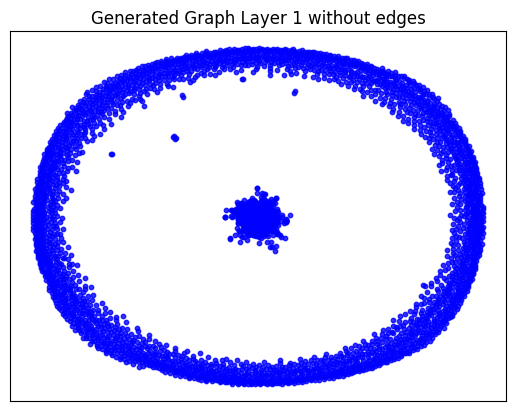

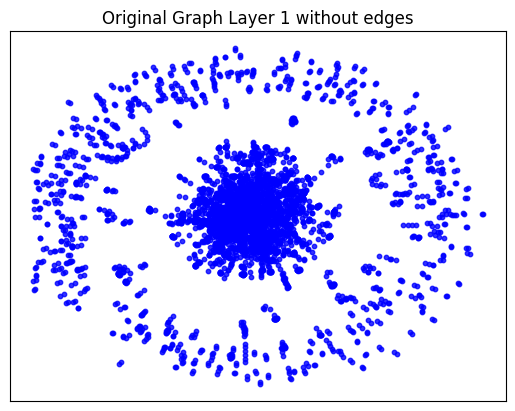

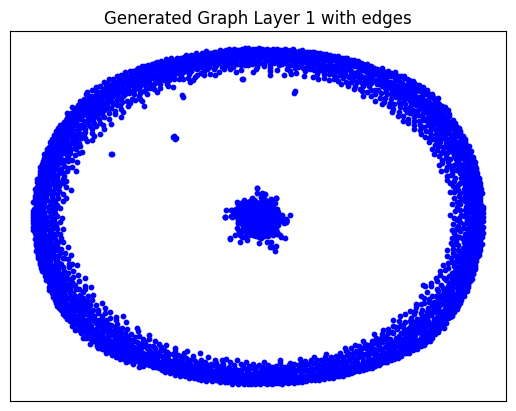

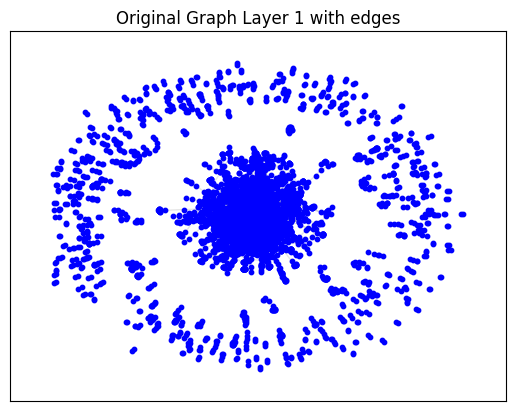

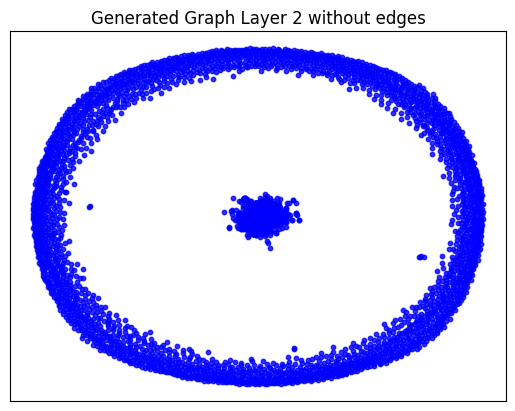

...

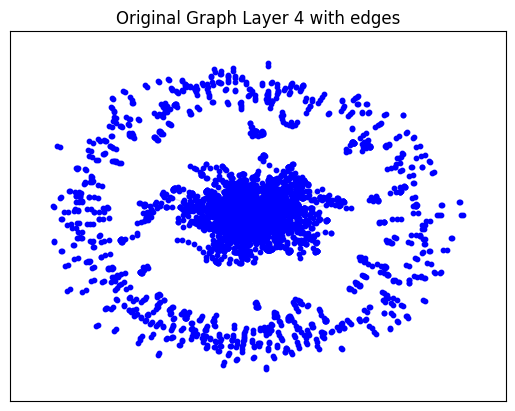

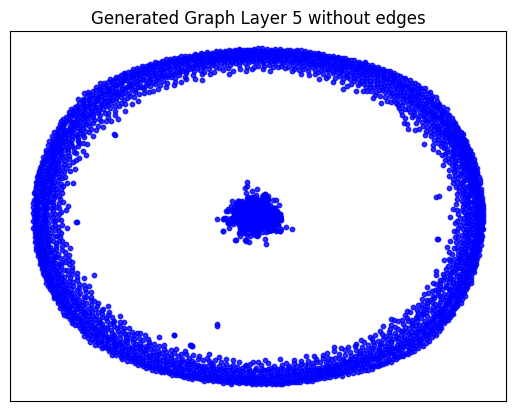

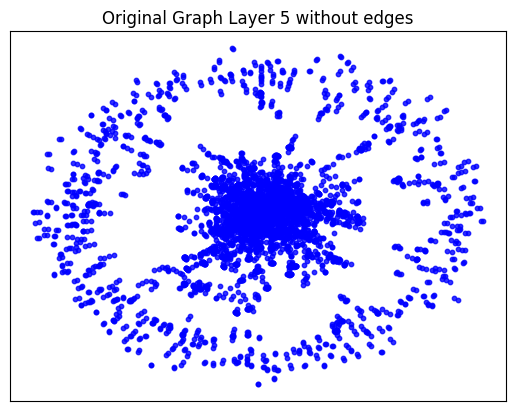

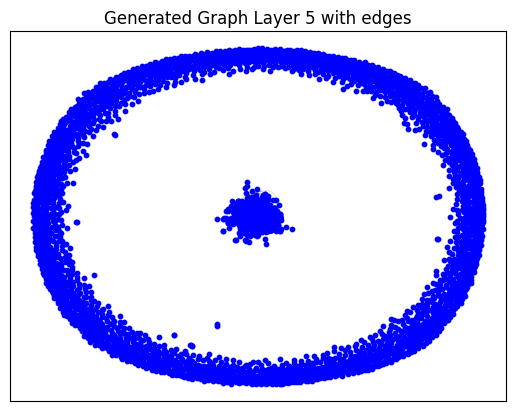

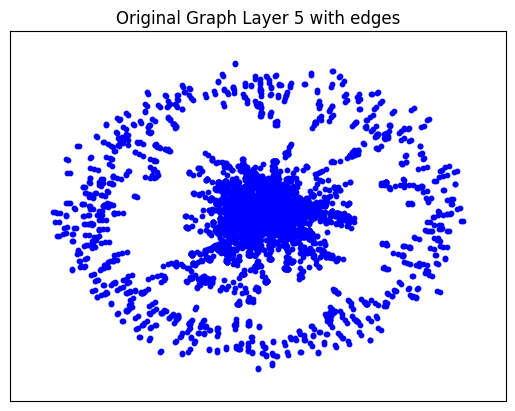

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_12.
Epoch 0 - Cost: 1.8151438236236572, Accuracy: 0.5002774000167847
Epoch 1 - Cost: 1.6694992780685425, Accuracy: 0.4998253285884857
Epoch 2 - Cost: 1.6488171815872192, Accuracy: 0.4998162090778351
Epoch 3 - Cost: 1.557843804359436, Accuracy: 0.4996674954891205
Epoch 4 - Cost: 1.6665459871292114, Accuracy: 0.4999244511127472
Epoch 5 - Cost: 1.594692587852478, Accuracy: 0.4992155432701111
Epoch 6 - Cost: 1.730082392692566, Accuracy: 0.4994581937789917
Epoch 7 - Cost: 1.7251026630401611, Accuracy: 0.4993671476840973
Epoch 8 - Cost: 1.5529447793960571, Accuracy: 0.49942654371261597
Epoch 9 - Cost: 1.6645952463150024, Accuracy: 0.49912595748901367
Epoch 10 - Cost: 1.6406035423278809, Accuracy: 0.49960893392562866
Epoch 11 - Cost: 1.6296706199645996, Accuracy: 0.49875113368034363
Epoch 12 - Cost: 1.5124536752700806, Accuracy: 0.4983062148094177
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.022907257080078125 seconds to compute statistics_power_law_alpha ---
--- 0.02027583122253418 seconds to compute statistics_gini ---
--- 0.09251141548156738 seconds to compute statistics_edge_distribution_entropy ---
--- 0.03625297546386719 seconds to compute degree_assortativity_coefficient ---
--- 0.39446282386779785 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 139, 'd_min': 0, 'd': 1.1084411583487368, 'LCC': 225, 'wedge_count': 143210.0, 'claw_count': 3789911.0, 'triangle_count': 20263, 'power_law_exp': 1.4011097416752307, 'gini': 0.9780066537044896, 'rel_edge_distr_entropy': 0.5815103624830413, 'assortativity': -0.2837830310854917, 'clustering_coefficient': 0.016039690641811905, 'n_components': 4638}
Evaluation Results:
Start computing graph degree


<ipython-input-52-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-52-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-52-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-52-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.450639102058521
KL divergence between original network and the network generated by Random E-R: 5.710267076116543
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.4488152022300747
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.934309237390551
KL divergence between original network and the network generated by Random E-R: 13.417728595469963
KL divergence between original network and the network generated by Random B-A: 1.8168086337873823
KL divergence between original network and the network generated by GAE: 15.24909434045714


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()